In [87]:
import pandas as pd
import numpy as np
from matplotlib.colors import rgb2hex
import datetime as dt
import matplotlib.pyplot as plt
import cmcrameri.cm as cmc
import matplotlib.patheffects as pe
import calendar
import cartopy.feature as cfeature
import geopandas
from cartopy.io import img_tiles
import cartopy.crs as ccrs
from math import floor
import matplotlib.ticker as mticker 
import cartopy.feature as cfeature
from cartopy.io.shapereader import Reader, natural_earth
from shapely.geometry import box
import matplotlib.gridspec as gridspec 
from scipy.stats import linregress
import matplotlib.patches as patches
from haversine import haversine, Unit
import matplotlib.colors as mcolors
from mpl_toolkits.mplot3d import Axes3D
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

In [2]:
creepmeters = pd.read_csv('../../Data/DATA_tidied/creepmeter_metadata_post_standardisation_sac_codes_updated.csv')
creepmeters.drop_duplicates('Creepmeter_abbrv',inplace=True)
creepmeters.drop(creepmeters[creepmeters['Creepmeter_abbrv']=='XMBC'].index,inplace=True)
creepmeters.drop(creepmeters[creepmeters['Creepmeter_abbrv']=='TABC'].index,inplace=True)
creepmeters.reset_index(inplace=True,drop=True)
print(creepmeters)

    Unnamed: 0 Network Creepmeter_abbrv File_code  \
0            0     EAF             BAL1   BAL1_1T   
1            1    PARK             C461  C461_10T   
2            2    PARK             C462   C462_1T   
3            3     UTA             CAN1  CAN1_30T   
4            4     NAF             CER1  CER1_30S   
..         ...     ...              ...       ...   
73         128     EAF             YZW1   YZW1_1T   
74         129   SOCAL             COML  COML_30T   
75         130   SOCAL             COLE  COLE_30T   
76         131   SOCAL             COLW   COLW_5T   
77         133   SOCAL             EASH   EASH_5T   

                     Start Time                     End Time  \
0   2023-03-12T10:47:55.000000Z  2023-09-05T13:14:55.000000Z   
1   2004-09-29T02:20:00.000000Z  2022-06-20T12:40:00.000000Z   
2   2021-08-19T19:10:11.000000Z  2024-03-22T01:05:11.000000Z   
3   2012-06-12T15:33:00.000000Z  2017-06-15T08:33:00.000000Z   
4   2019-10-09T06:46:00.000000Z  2024-05-23

In [3]:
########## East Anatolia ############
EAF = creepmeters.drop(creepmeters[creepmeters["Network"]!="EAF"].index)
EAF.reset_index(inplace=True,drop=True)
EAF.sort_values(by='Latitude',inplace=True,ascending=False)
EAF.reset_index(inplace=True,drop=True)

########## North Anatolia ############
NAF = creepmeters.drop(creepmeters[creepmeters["Network"]!="NAF"].index)
NAF.sort_values(by='Longitude',inplace=True,ascending=True)
NAF.reset_index(inplace=True,drop=True)


########## Parkfield ############
PARK = creepmeters.drop(creepmeters[creepmeters["Network"]!="PARK"].index)
PARK.reset_index(inplace=True,drop=True)
PARK.sort_values(by='Latitude',inplace=True,ascending=False)
PARK.reset_index(inplace=True,drop=True)
PARK

########## Hayward ############
HAY = creepmeters.drop(creepmeters[creepmeters["Network"]!="HAY"].index)
HAY.sort_values(by='Latitude',inplace=True,ascending=False)
HAY.reset_index(inplace=True,drop=True)
HAY

########## Hollister ############
HOL = creepmeters.drop(creepmeters[creepmeters["Network"]!="HOL"].index)
HOL.reset_index(inplace=True,drop=True)
CAL = creepmeters.drop(creepmeters[creepmeters["Network"]!="CAL"].index)
CAL.reset_index(inplace=True,drop=True)
print(CAL)
HOL = pd.concat([HOL,CAL],ignore_index=True)
HOL.sort_values(by='Latitude',inplace=True,ascending=False)
HOL.reset_index(inplace=True,drop=True)

########## Chaman ############
CHAF = creepmeters.drop(creepmeters[creepmeters["Network"]!="CHAF"].index)
CHAF.reset_index(inplace=True,drop=True)

########## Dead Sea ############
DSF = creepmeters.drop(creepmeters[creepmeters["Network"]!="DSF"].index)
DSF.reset_index(inplace=True,drop=True)

########## Utah ############
UTA = creepmeters.drop(creepmeters[creepmeters["Network"]!="UTA"].index)
UTA.reset_index(inplace=True,drop=True)

########## SoCal ############
SOCAL= creepmeters.drop(creepmeters[creepmeters["Network"]!="SOCAL"].index)
SOCAL.sort_values(by='Latitude',inplace=True,ascending=False)
SOCAL.reset_index(inplace=True,drop=True)

########## Ridgecrest ############
RID = creepmeters.drop(creepmeters[creepmeters["Network"]!="RID"].index)
RID.sort_values(by='Latitude',inplace=True,ascending=False)
RID.reset_index(inplace=True,drop=True)

   Unnamed: 0 Network Creepmeter_abbrv File_code                   Start Time  \
0         122     CAL             XSH1   XSH1_1T  2020-10-15T17:01:59.000000Z   

                      End Time  Sampling rate, Hz Sampling rate, mins  \
0  2024-10-09T18:37:59.000000Z           0.016667                  1T   

   Latitude  Longitude Length Depth  Obliquity Creepmeter_full_name  \
0    36.943   -121.445   14 m   NaN       41.5          Shore Rd #1   

             Fault  
0  Calaveras Fault  


In [4]:
print('EAF:',len(EAF))
print('NAF:',len(NAF))
print('PARK:',len(PARK))
print('HAY:',len(HAY))
print('HOL:',len(HOL))
print('CHAF:',len(CHAF))
print('UTA:',len(UTA))
print('SOCAL:',len(SOCAL))
print('RID:',len(RID))
print('DSF:',len(DSF))


EAF: 14
NAF: 10
PARK: 15
HAY: 5
HOL: 11
CHAF: 1
UTA: 1
SOCAL: 14
RID: 6
DSF: 1


In [412]:
len(PARK) + len(HAY) + len(HOL) + len(SOCAL)+ len(RID)

51

In [6]:
cmap=cmc.managua

In [7]:
colours_igor  = cmap(np.linspace(0, 1, 7))
for i in range(len(colours_igor)):
    print(rgb2hex(colours_igor[i]))


#ffcf67
#cc824d
#92463b
#572949
#4e5593
#6498ce
#81e7ff


In [8]:
gdf_Asia = geopandas.read_file("../../Data/GIS_Files/AFEAD_v2022/AFEAD_v2022.shp")
gdf_USA = geopandas.read_file("../../Data/GIS_Files/Shapefile/QFaults.shp")
gdf_Cali = gdf_USA.drop(gdf_USA[gdf_USA.Location!='California'].index)
gdf_Utah = gdf_USA.drop(gdf_USA[gdf_USA.Location!='Utah'].index)

In [9]:
df_all = pd.read_csv("../../Data/DATA_tidied/Picks/All_picks_12_JUN_2025.csv",index_col=0)

df_all['Start Time'] = pd.to_datetime(df_all['Start Time'])
df_all.drop(df_all[df_all['Start Time']>dt.datetime(2024,1,1,0,0,0)].index,inplace=True)
df_all.drop(df_all[df_all['Displacement, mm']<0.02].index,inplace=True)
df_ce = df_all.copy(deep=True)
print(len(df_ce))
print(np.max(df_ce['Duration, hrs']))
print(np.max(df_ce['Displacement, mm']))
df_creeplet = df_ce.drop(df_ce[abs(df_ce['Displacement, mm'])>0.1].index)
df_surge = df_ce.drop(df_ce[df_ce['Duration, hrs']<720].index)
df_creeplet.drop(df_creeplet[df_creeplet['Duration, hrs']>720].index,inplace=True)
df_creeplet.drop(df_creeplet[df_creeplet['Displacement, mm']<0.02].index,inplace=True)
print('creeplet no',len(df_creeplet),'med dur',np.median(df_creeplet['Duration, hrs']),'dis',np.median(df_creeplet['Displacement, mm']))
print('surge no',len(df_surge),'med dur', np.median(df_surge['Duration, hrs']),'dis',np.median(df_surge['Displacement, mm']))
df_ce.drop(df_ce[df_ce['Duration, hrs']>720].index,inplace=True)
df_ce.drop(df_ce[df_ce['Displacement, mm']<0.1].index,inplace=True)
print('creep events', len(df_ce),'med dur', np.median(df_ce['Duration, hrs']),'dis',np.median(df_ce['Displacement, mm']))
colours  = cmap(np.linspace(0, 1, 10))

5695
30253.33361111111
26.82999000000001
creeplet no 1063 med dur 9.68361111111111 dis 0.0561442784262133
surge no 207 med dur 1322.1663888888888 dis 1.6400000000000006
creep events 4428 med dur 29.95847222222222 dis 0.4600000000000008


In [10]:
df_creeplet.to_csv('../../Data/DATA_tidied/creeplets.csv')
df_surge.to_csv('../../Data/DATA_tidied/surge.csv')

In [11]:
np.min(df_all['Displacement, mm'])

0.0200917893677988

/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/2134589964.py:42: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  plt.xlim([0,20])


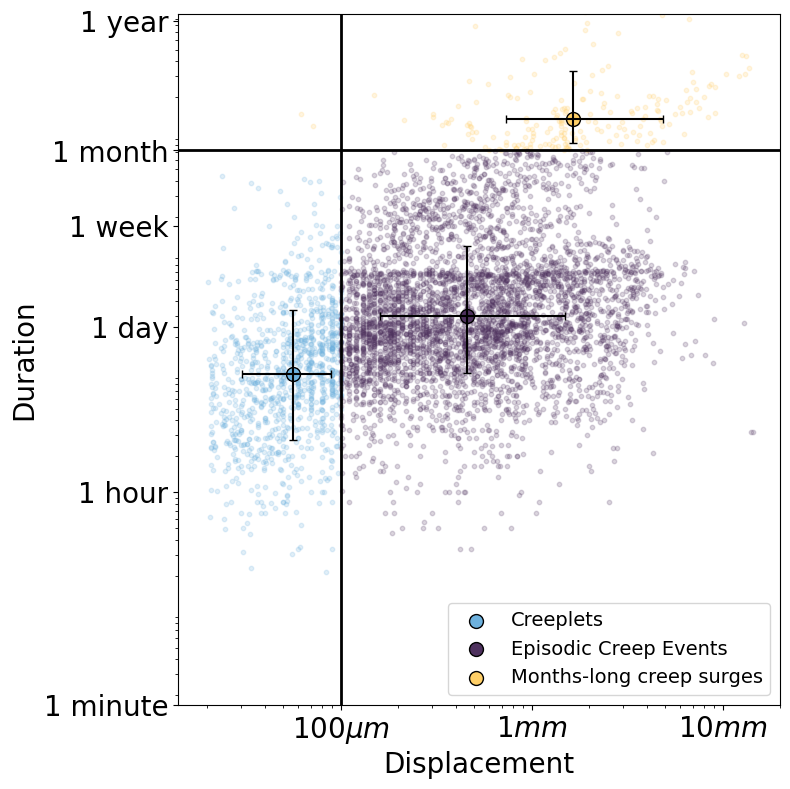

In [12]:
plt.figure(figsize=(8,8))
axis = plt.subplot(1,1,1)
plt.scatter(df_creeplet['Displacement, mm'],df_creeplet['Duration, hrs'],color = rgb2hex(colours[8]),s=10,alpha=0.2)
axis.errorbar(np.median(df_creeplet['Displacement, mm']), np.median(df_creeplet['Duration, hrs']),
              yerr=[[np.median(df_creeplet['Duration, hrs'])-np.percentile(df_creeplet['Duration, hrs'],15)],
                    [np.percentile(df_creeplet['Duration, hrs'],85)-np.median(df_creeplet['Duration, hrs'])]], 
              xerr=[[np.median(df_creeplet['Displacement, mm'])-np.percentile(df_creeplet['Displacement, mm'],15)],
                    [np.percentile(df_creeplet['Displacement, mm'],85)-np.median(df_creeplet['Displacement, mm'])]], 
                    fmt='none', ecolor='k', capsize=3)
plt.scatter(np.median(df_creeplet['Displacement, mm']),np.median(df_creeplet['Duration, hrs']),color = rgb2hex(colours[8]),
            label = 'Creeplets',s=100,edgecolors='k')

plt.scatter(df_ce['Displacement, mm'],df_ce['Duration, hrs'],color = rgb2hex(colours[5]),s=10,alpha=0.2)
axis.errorbar(np.median(df_ce['Displacement, mm']), np.median(df_ce['Duration, hrs']),
              yerr=[[np.median(df_ce['Duration, hrs'])-np.percentile(df_ce['Duration, hrs'],15)],
                    [np.percentile(df_ce['Duration, hrs'],85)-np.median(df_ce['Duration, hrs'])]], 
              xerr=[[np.median(df_ce['Displacement, mm'])-np.percentile(df_ce['Displacement, mm'],15)],
                    [np.percentile(df_ce['Displacement, mm'],85)-np.median(df_ce['Displacement, mm'])]], 
                    fmt='none', ecolor='k', capsize=3)
plt.scatter(np.median(df_ce['Displacement, mm']),np.median(df_ce['Duration, hrs']),color = rgb2hex(colours[5]),
            label = 'Episodic Creep Events',s=100,edgecolors='k')

plt.scatter(df_surge['Displacement, mm'],df_surge['Duration, hrs'],color = rgb2hex(colours[0]),s=10,alpha=0.2)
axis.errorbar(np.median(df_surge['Displacement, mm']), np.median(df_surge['Duration, hrs']),
              yerr=[[np.median(df_surge['Duration, hrs'])-np.percentile(df_surge['Duration, hrs'],15)],
                    [np.percentile(df_surge['Duration, hrs'],85)-np.median(df_surge['Duration, hrs'])]], 
              xerr=[[np.median(df_surge['Displacement, mm'])-np.percentile(df_surge['Displacement, mm'],15)],
                    [np.percentile(df_surge['Displacement, mm'],85)-np.median(df_surge['Displacement, mm'])]], 
                    fmt='none', ecolor='k', capsize=3)
plt.scatter(np.median(df_surge['Displacement, mm']),np.median(df_surge['Duration, hrs']),color = rgb2hex(colours[0]),label = 'Months-long creep surges',s=100,edgecolors='k')

plt.yscale('log')
plt.xscale('log')
plt.xlabel('Displacement',fontsize=20)
plt.ylabel('Duration',fontsize=20) 
axis.set_yticks([1/60, 1, 24, 168,720,8760])
axis.set_xticks([0.01,0.1,1,10])
axis.set_yticklabels(['1 minute','1 hour', '1 day', '1 week','1 month','1 year'],fontsize=20)
axis.set_xticklabels([ r'10$\mu m$', r'100$\mu m$',r'1$mm$',r'10$mm$'],fontsize=20)
plt.vlines(0.1,0,10000,colors='k',linewidth=2)
plt.hlines(720,0,20,colors='k',linewidth=2)
plt.xlim([0,20])
plt.ylim([1/60,10000])

plt.legend(fontsize=14,loc='lower right')
plt.tight_layout()
plt.savefig('../../Creep_catalog_stats_figures/New Plots/loglog_transients_dur_vs_disp.pdf')
plt.savefig('../../Creep_catalog_stats_figures/New Plots/loglog_transients_dur_vs_disp.png')
plt.show()

/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/991564962.py:20: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  plt.xlim([0,20])


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


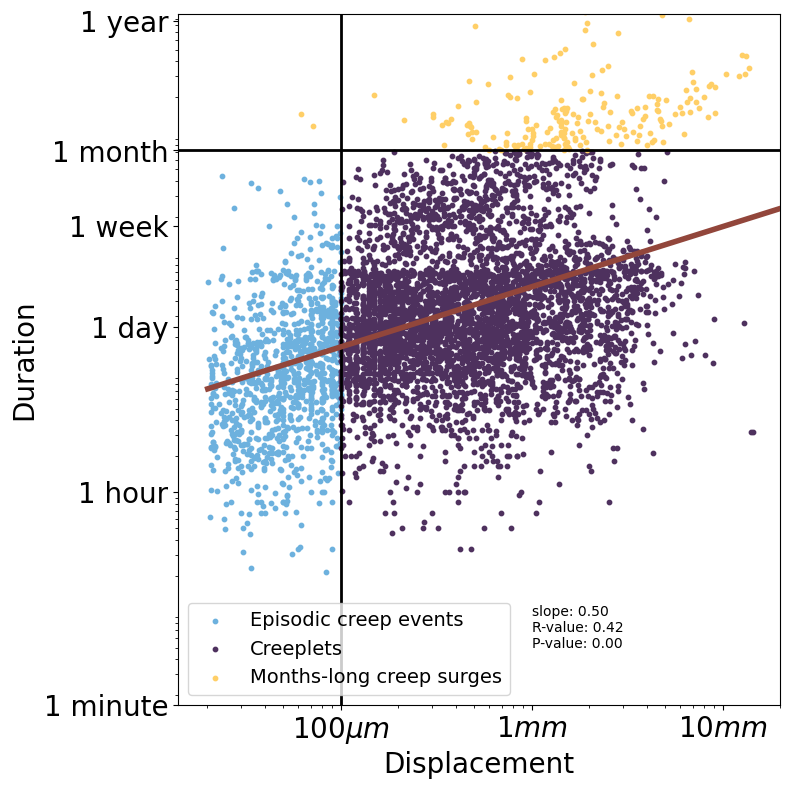

In [13]:
plt.figure(figsize=(8,8))
axis = plt.subplot(1,1,1)
plt.scatter(df_creeplet['Displacement, mm'],df_creeplet['Duration, hrs'],color = rgb2hex(colours[8]),s=10,label='Episodic creep events')


plt.scatter(df_ce['Displacement, mm'],df_ce['Duration, hrs'],color = rgb2hex(colours[5]),s=10,label='Creeplets')


plt.scatter(df_surge['Displacement, mm'],df_surge['Duration, hrs'],color = rgb2hex(colours[0]),s=10,label='Months-long creep surges')
plt.yscale('log')
plt.xscale('log')
plt.xlabel('Displacement',fontsize=20)
plt.ylabel('Duration',fontsize=20) 
axis.set_yticks([1/60, 1, 24, 168,720,8760])
axis.set_xticks([0.01,0.1,1,10])
axis.set_yticklabels(['1 minute','1 hour', '1 day', '1 week','1 month','1 year'],fontsize=20)
axis.set_xticklabels([ r'10$\mu m$', r'100$\mu m$',r'1$mm$',r'10$mm$'],fontsize=20)
plt.vlines(0.1,0,10000,colors='k',linewidth=2)
plt.hlines(720,0,20,colors='k',linewidth=2)
plt.xlim([0,20])
plt.ylim([1/60,10000])
plt.legend(fontsize=14)


y = df_all['Duration, hrs']
x = df_all['Displacement, mm']



# Take log10 of both axes
log_x = np.log10(x)
log_y = np.log10(y)

# Perform linear regression on log-log data
result = linregress(log_x, log_y)
slope = result.slope
intercept = result.intercept

# Best-fit line in log space
log_x_fit = np.linspace(log_x.min(), log_x.max(), 100)
log_y_fit = slope * log_x_fit + intercept

# Convert back to linear space for plotting
x_fit = 10**log_x_fit
y_fit = 10**log_y_fit

plt.plot(x_fit, y_fit, color=colours[3],linewidth=4,zorder=10)
plt.text(1,0.05,f"slope: {slope:.2f}\nR-value: {result.rvalue:.2f}\nP-value: {result.pvalue:.2f}")

plt.tight_layout()
plt.savefig('../../Creep_catalog_stats_figures/New Plots/loglog_scaling_dur_vs_disp.pdf')
plt.show()

In [ ]:
def scatter_points(instrument_dataframe,event_dataframe,axis,cmap,xticks=True,yticks=True):
    axis.set_xscale('log')
    axis.set_yscale('log')
    axis.set_xlim([1/60,10000])
    axis.set_ylim([0,20])
    x = []
    y= []
    total_events = 0
    for i in range(len(instrument_dataframe)):
        abbrv = instrument_dataframe['Creepmeter_abbrv'].iloc[i]
        colours  = cmap(np.linspace(0, 1, len(instrument_dataframe)))
        #print(abbrv)
        try:
            instrument_df = event_dataframe[event_dataframe['Creepmeter abbreviation'] == abbrv]
            total_events = total_events+len(instrument_df)
            print(f'{abbrv} has {len(instrument_df)} events')
            displacement = instrument_df['Displacement, mm']
            duration = instrument_df['Duration, hrs']
            dur_med = np.median(duration)
            dur85 = np.percentile(duration,85)
            dur15 = np.percentile(duration,15)
            disp_med = np.median(displacement)
            disp85 = np.percentile(displacement,85)
            disp15 = np.percentile(displacement,15)
            if abbrv not in ['SU30']:
                y.append(dur_med)
                x.append(disp_med)


            # Asymmetric error bars
            yerr = [[dur_med-dur15], [dur85-dur_med]]
            xerr = [[disp_med-disp15], [disp85-disp_med]]
            #print(xerr,yerr)

            
            axis.errorbar(disp_med,dur_med, xerr=xerr, yerr=yerr, fmt='none', ecolor='k', alpha=0.5, capsize=3)
            if abbrv in ['SU30','XHSW','XRSW','XSH1','DS30']:
                axis.scatter(disp_med,dur_med,s=len(instrument_df),c=rgb2hex(colours[i]),alpha=0.5,edgecolors='k',marker='s')
                axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k',marker='s')
            elif abbrv in ['RR45','CHA1']:
                axis.scatter(disp_med,dur_med,s=len(instrument_df),c=rgb2hex(colours[i]),alpha=0.5,edgecolors='k',marker='^')
                axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k',marker='^')
            elif abbrv in ['SH30','CAN1']:
                axis.scatter(disp_med,dur_med,s=len(instrument_df),c=rgb2hex(colours[i]),alpha=0.5,edgecolors='k',marker='D')
                axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k',marker='D')
            else:
                axis.scatter(disp_med,dur_med,s=len(instrument_df),c=rgb2hex(colours[i]),alpha=0.5,edgecolors='k')
                axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k')
                
            
        

        except IndexError:
            print('no events')

    # Take log10 of both axes
    log_x = np.log10(x)
    log_y = np.log10(y)

    # Perform linear regression on log-log data
    result = linregress(log_x, log_y)
    slope = result.slope
    intercept = result.intercept

    # Best-fit line in log space
    log_x_fit = np.linspace(log_x.min(), log_x.max(), 100)
    log_y_fit = slope * log_x_fit + intercept

    # Convert back to linear space for plotting
    x_fit = 10**log_x_fit
    y_fit = 10**log_y_fit
    #if abbrv not in ['CFW1','CAN1']:
    # Plot the best-fit line
        #plt.plot(x_fit, y_fit, color="k",linewidth=2,zorder=10)
        #plt.text(6,168,f"slope: {slope:.2f}\nR-value: {result.rvalue:.2f}\nP-value: {result.pvalue:.2f}")

    # First legend (Color & Marker Style) - Automatically created by seaborn/matplotlib
    legend1 = plt.legend(title="Instrument", loc="upper left", frameon=True,fontsize=10)

    # Define representative event counts for the size legend
    size_legend_values = [10, 100, 500, 1000]  # Adjust as needed
    size_legend_labels = [f'{val} Events' for val in size_legend_values]


    # Create properly sized legend markers
    size_legend_handles = [
        axis.scatter([], [], s=size, color='gray', label=label, alpha=0.6, edgecolors='k')
        for size, label in zip(size_legend_values, size_legend_labels)]
    if instrument_dataframe['Network'].iloc[0] in ['HAY']:
        legend2 = plt.legend(
            handles=size_legend_handles, title='Number of Events',
            loc='lower left', frameon=True, labelspacing=1.75, borderpad=1.2, scatterpoints=1
        )
        plt.gca().add_artist(legend2)  # Add the second legend

    # Add both legends
    plt.gca().add_artist(legend1)  # Keep the first legend
    
    # Set custom tick positions
    if yticks== True:
        axis.set_yticks([1/60,1, 24, 168,720,8760])
        axis.set_yticklabels(['1 minute','1 hour', '1 day', '1 week','1 month','1 year'])
        axis.set_ylabel('Duration')
    
    else:
        axis.set_yticks([1/60,1, 24, 168,720,8760])
        axis.set_yticklabels(['', '', '','',''])
        
    if xticks == True:
        axis.set_xticks([0.01,0.1,1,10])
        axis.set_xticklabels([ r'10$\mu m$', r'100$\mu m$',r'1$mm$',r'10$mm$'])
        axis.set_xlabel('Displacement')
    else:
        axis.set_xticks([0.01,0.1,1,10])
        axis.set_xticklabels([ '', '','',''],fontsize=20)

    plt.xlim([0,20])
    plt.ylim([1/60,10000])
    plt.text(0.015,168,f'{total_events} events')
    return

/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/2851850919.py:5: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axis.set_ylim([0,20])
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/2851850919.py:48: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k')
/Users/dagi9522/miniconda3/envs/creepmeters/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/dagi9522/miniconda3/envs/creepmeters/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value e

CPP1 has 2 events
CTM1 has 28 events
COZ1 has 168 events
CHP1 has 0 events
no events
CFW1 has 288 events
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
XSH1 has 43 events
SJN1 has 101 events
XSJ2 has 76 events
XSJ3 has 70 events
XHR1 has 23 events
XHR2 has 99 events
XHR3 has 90 events
CWC3 has 70 events
CWN1 has 215 events
FCR1 has 34 events
XMR1 has 302 events
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
XSC1 has 91 events
XMM1 has 1044 events
XMD1 has 449 events
XVA1 has 315 events
XRSW has 37 events
XPK1 has 135 events
XPK2 has 138 events
XTA1 has 203 events
XHSW has 69 events
WKR1 

/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/2851850919.py:117: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  plt.xlim([0,20])
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/2851850919.py:5: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axis.set_ylim([0,20])
/Users/dagi9522/miniconda3/envs/creepmeters/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/dagi9522/miniconda3/envs/creepmeters/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/2851850919.py:48: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its 

INW1 has 91 events
ISW1 has 46 events
CHE1 has 93 events
HAM1 has 52 events
CER1 has 18 events
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
PAN1 has 20 events
PAS1 has 16 events
SIV1 has 112 events
HAT1 has 7 events
ORM1 has 5 events
TAS1 has 4 events
YZE1 has 1 events
GOZ1 has 1 events
YZW1 has 10 events
KAR1 has 0 events
no events
GOK1 has 130 events
BAL1 has 8 events
HAS1 has 8 events
KIR1 has 6 events
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
DS30 has 16 events
CHA1 has 4 events
CAN1 has 6 events
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SS

/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/2851850919.py:117: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  plt.xlim([0,20])
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/2851850919.py:5: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axis.set_ylim([0,20])
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/2851850919.py:48: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k')
/Users/dagi9522/miniconda3/envs/creepmeters/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty sli

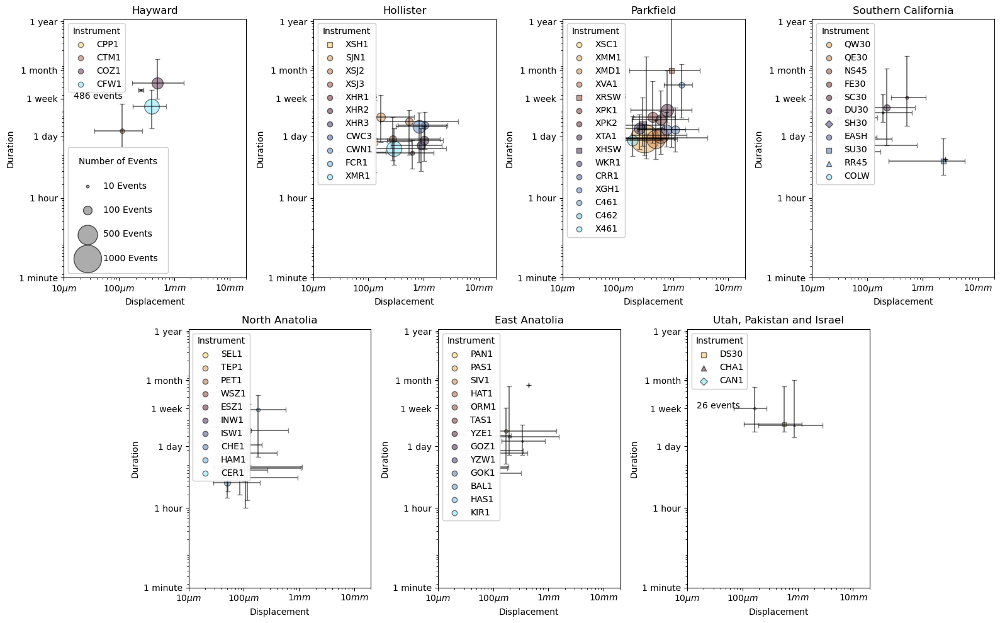

In [15]:
#df_all = pd.read_csv("../../Data/DATA_tidied/Picks/All_picks_29_May_2025.csv",index_col=0)
fig = plt.figure(figsize=(16,10))
axa = plt.subplot2grid((4, 8), (0, 0), colspan=2,rowspan=2)
axa.set_title("Hayward")
scatter_points(HAY,df_all,axa,cmap,xticks=True,yticks=True)
axb = plt.subplot2grid((4, 8), (0, 2), colspan=2, rowspan=2)
axb.set_title("Hollister")
scatter_points(HOL,df_all,axb,cmap,xticks=True,yticks=True)  
axc = plt.subplot2grid((4, 8), (0, 4), colspan=2, rowspan=2) 
axc.set_title("Parkfield")
scatter_points(PARK,df_all,axc,cmap,xticks=True,yticks=True) 
axd = plt.subplot2grid((4, 8), (0, 6), colspan=2, rowspan=2)
axd.set_title("Southern California")
scatter_points(SOCAL,df_all,axd,cmap,xticks=True,yticks=True)
axe = plt.subplot2grid((4, 8), (2, 1), colspan=2, rowspan=2) 
axe.set_title("North Anatolia")  
scatter_points(NAF,df_all,axe,cmap,xticks=True,yticks=True)         
axf = plt.subplot2grid((4, 8), (2, 3), colspan=2, rowspan=2) 
axf.set_title("East Anatolia")
scatter_points(EAF,df_all,axf,cmap,xticks=True,yticks=True) 
axg = plt.subplot2grid((4, 8), (2, 5), colspan=2, rowspan=2)
axg.set_title("Utah, Pakistan and Israel")
others = pd.concat([DSF,CHAF,UTA])
scatter_points(others,df_all,axg,cmap,xticks=True,yticks=True) 
fig.tight_layout()
#plt.savefig('../../Creep_catalog_stats_figures/duration_vs_displacement_regions.pdf')
plt.show()

In [369]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

def scatter_points_bars(instrument_dataframe, event_dataframe, axis, cmap,
                        xticks=True, yticks=True,
                        df_ce=None, df_surge=None, df_creeplet=None):
    axis.set_xscale('log')
    axis.set_yscale('log')
    axis.set_xlim([1/60,10000])
    axis.set_ylim([0,20])
    x = []
    y= []
    total_events = 0
    colours  = cmap(np.linspace(0, 1, len(instrument_dataframe)))

    for i in range(len(instrument_dataframe)):
        abbrv = instrument_dataframe['Creepmeter_abbrv'].iloc[i]
        try:
            instrument_df = event_dataframe[event_dataframe['Creepmeter abbreviation'] == abbrv]
            total_events += len(instrument_df)
            displacement = instrument_df['Displacement, mm']
            duration = instrument_df['Duration, hrs']
            dur_med = np.median(duration)
            dur85 = np.percentile(duration,85)
            dur15 = np.percentile(duration,15)
            disp_med = np.median(displacement)
            disp85 = np.percentile(displacement,85)
            disp15 = np.percentile(displacement,15)
            if abbrv not in ['SU30']:
                y.append(dur_med)
                x.append(disp_med)

            yerr = [[dur_med-dur15], [dur85-dur_med]]
            xerr = [[disp_med-disp15], [disp85-disp_med]]
            '''axis.errorbar(disp_med,dur_med, xerr=xerr, yerr=yerr,
                          fmt='none', ecolor='k', alpha=0.5, capsize=3)'''
            #axis.scatter(displacement,duration,s=50,c=rgb2hex(colours[i]),alpha=0.5,edgecolors='k',label=abbrv)
            

            if abbrv in ['SU30','XHSW','XRSW','XSH1','DS30']:
                axis.scatter(displacement,duration,s=50,
                             c=rgb2hex(colours[i]),alpha=0.5,edgecolors='k',marker='s')
                axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k',marker='s')
            elif abbrv in ['RR45','CHA1']:
                axis.scatter(displacement,duration,s=50,
                             c=rgb2hex(colours[i]),alpha=0.5,edgecolors='k',marker='^')
                axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k',marker='^')
            elif abbrv in ['SH30','CAN1']:
                axis.scatter(displacement,duration,s=50,
                             c=rgb2hex(colours[i]),alpha=0.5,edgecolors='k',marker='D')
                axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k',marker='D')
            else:
                axis.scatter(displacement,duration,s=50,
                             c=rgb2hex(colours[i]),alpha=0.5,edgecolors='k')
                axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k')

        except IndexError:
            print('no events')

    # Legends
    legend1 = plt.legend(title="Instrument", loc="upper left", frameon=True,ncols=2,fontsize=14)
    legend1.get_title().set_fontsize(16)
    size_legend_values = [10, 100, 500, 1000]
    size_legend_labels = [f'{val} Events' for val in size_legend_values]
    size_legend_handles = [
        axis.scatter([], [], s=size, color='gray', label=label, alpha=0.6, edgecolors='k')
        for size, label in zip(size_legend_values, size_legend_labels)
    ]
    '''if instrument_dataframe['Network'].iloc[0] in ['HAY','CAL','HOL','PARK','SOCAL']:
        legend2 = plt.legend(
            handles=size_legend_handles, title='Number of Events',
            loc='lower left', frameon=True, labelspacing=1.75, borderpad=1.2, scatterpoints=1,fontsize=14
        )
        plt.gca().add_artist(legend2)
        legend2.get_title().set_fontsize(16)'''
    plt.gca().add_artist(legend1)

    # Custom ticks
    if yticks:
        axis.set_yticks([1/60,1, 24, 168,720,8760,2*8760,3*8760])
        axis.set_yticklabels(['1 minute','1 hour', '1 day', '1 week','1 month','1 year','2 years','3 years'],fontsize=16)
        axis.set_ylabel('Duration',fontsize=20)
    else:
        axis.set_yticks([1/60,1, 24, 168,720,8760,2*8760])
        axis.set_yticklabels(['', '', '','',''])
        
    if xticks:
        axis.set_xticks([0.01,0.1,1,10,25])
        axis.set_xticklabels([ r'10$\mu m$', r'100$\mu m$',r'1$mm$',r'10$mm$',r'25$mm$'],fontsize=16)
        axis.set_xlabel('Displacement',fontsize=20)
    else:
        axis.set_xticks([0.01,0.1,1,10,25])
        axis.set_xticklabels([ '', '','','',''],fontsize=16)

    plt.xlim([0,30])
    plt.ylim([1/60,32000])

    # === Inset: stacked bar chart of events by type ===
    cmap = cmc.managua
    colors_bar = cmap(np.linspace(0, 1, 3))
    if df_ce is not None and df_surge is not None and df_creeplet is not None:
        ax_inset = inset_axes(axis, width="40%", height="20%", loc='lower right',
                      bbox_to_anchor=(-0.01, 0.07, 1, 1),
                      bbox_transform=axis.transAxes, borderpad=0)

        meters = instrument_dataframe['Creepmeter_abbrv'].tolist()
        ce_counts = [len(df_ce[df_ce['Creepmeter abbreviation'] == m]) for m in meters]
        surge_counts = [len(df_surge[df_surge['Creepmeter abbreviation'] == m]) for m in meters]
        creeplet_counts = [len(df_creeplet[df_creeplet['Creepmeter abbreviation'] == m]) for m in meters]

        ax_inset.bar(meters, ce_counts, label='Creep Events', color=colors_bar[0], edgecolor='black',alpha=0.6)
        ax_inset.bar(meters, surge_counts, bottom=ce_counts, label='Surge Events', color=colors_bar[1], edgecolor='black',alpha=0.6)
        ax_inset.bar(meters, creeplet_counts,
                     bottom=np.array(ce_counts) + np.array(surge_counts),
                     label='Creeplets', color=colors_bar[2], edgecolor='black',alpha=0.6)

        ax_inset.tick_params(axis='x', rotation=90, labelsize=12)
        ax_inset.tick_params(axis='y', labelsize=12)
        ax_inset.set_ylabel('Count', fontsize=12)
        ax_inset.legend(fontsize=11, frameon=True)

    return


In [415]:
len(df_all[df_all['Network']=='HOL']) + len(df_all[df_all['Network']=='HAY']) + \
    len(df_all[df_all['Network']=='PARK']) + len(df_all[df_all['Network']=='SOCAL']) + \
    len(df_all[df_all['Network']=='RID']) + len(df_all[df_all['Network']=='CAL'])

4919

In [416]:
len(df_all[df_all['Network']=='HAY'])

486

/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/711387788.py:9: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axis.set_ylim([0,20])
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/711387788.py:54: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k')
/Users/dagi9522/miniconda3/envs/creepmeters/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/dagi9522/miniconda3/envs/creepmeters/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value enc

no events


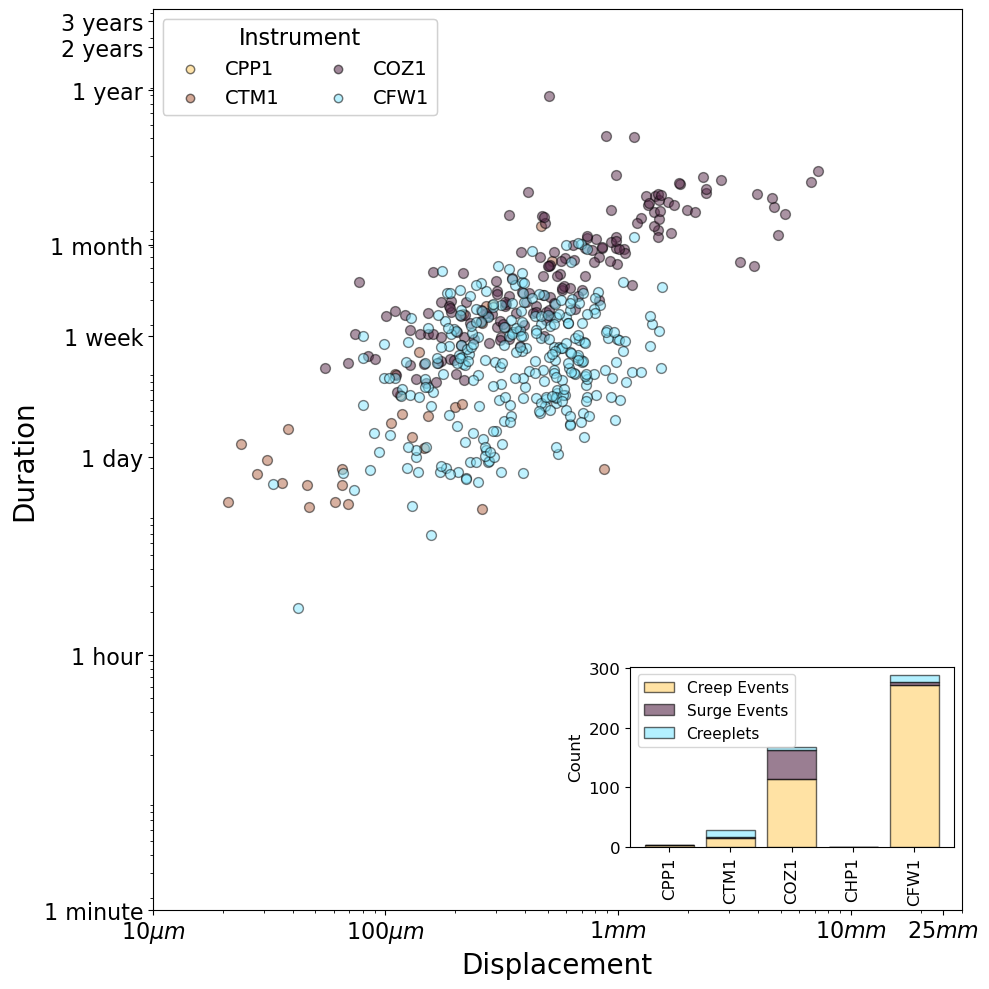

In [384]:
fig = plt.figure(figsize=(10,10))
axa = plt.subplot(1,1,1)
#axa.set_title("Hayward")
scatter_points_bars(HAY,df_all,axa,cmap,xticks=True,yticks=True,df_ce=df_ce, df_surge=df_surge, df_creeplet=df_creeplet)
plt.tight_layout()
plt.savefig('../../Creep_catalog_stats_figures/New Plots/Hayward_duration_vs_displacement_bars.pdf')
plt.show()

/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/711387788.py:9: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axis.set_ylim([0,20])
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/711387788.py:42: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k',marker='s')
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/711387788.py:54: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a

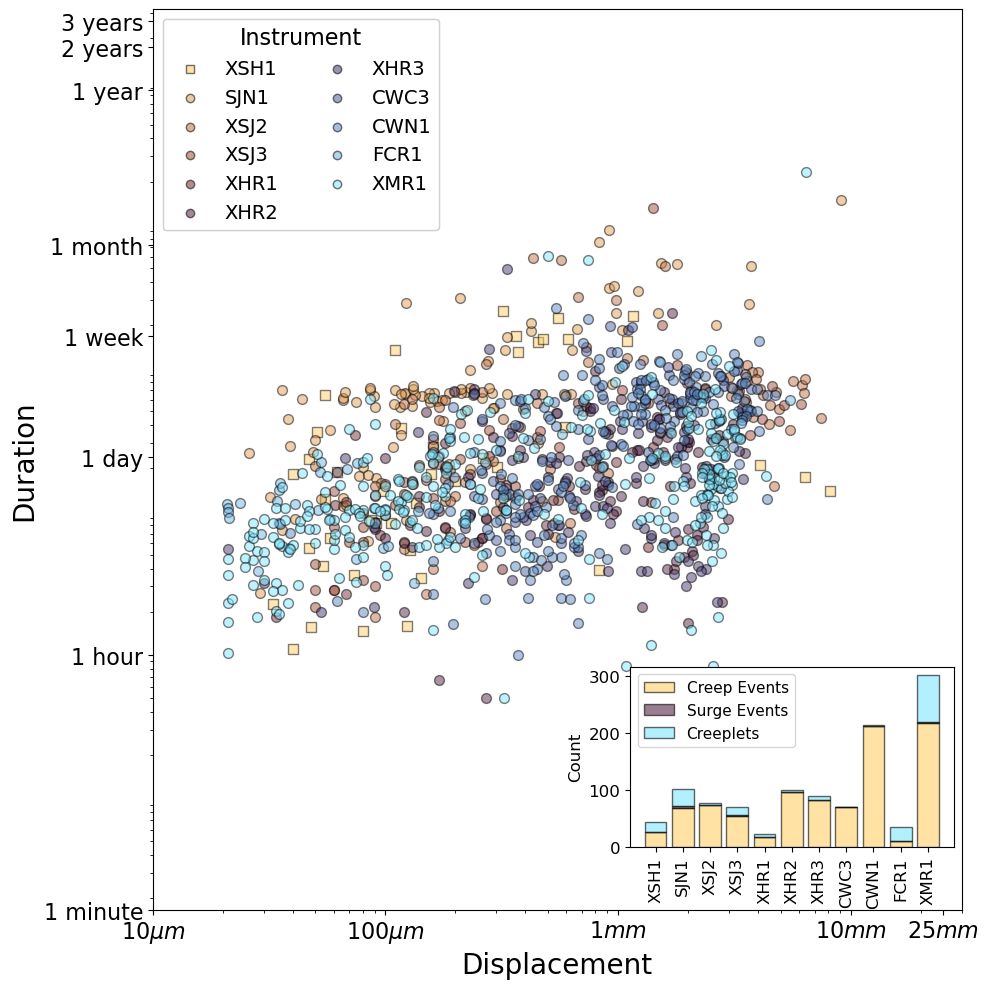

In [383]:
fig = plt.figure(figsize=(10,10))
axa = plt.subplot(1,1,1)
#axa.set_title("Hayward")
scatter_points_bars(HOL,df_all,axa,cmap,xticks=True,yticks=True,df_ce=df_ce, df_surge=df_surge, df_creeplet=df_creeplet)
plt.tight_layout()
plt.savefig('../../Creep_catalog_stats_figures/New Plots/Hollister_duration_vs_displacement_bars.pdf')
plt.show()

In [372]:
np.max(df_all['Displacement, mm'])

26.82999000000001

/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/711387788.py:9: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axis.set_ylim([0,20])
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/711387788.py:54: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k')
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/711387788.py:42: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array w

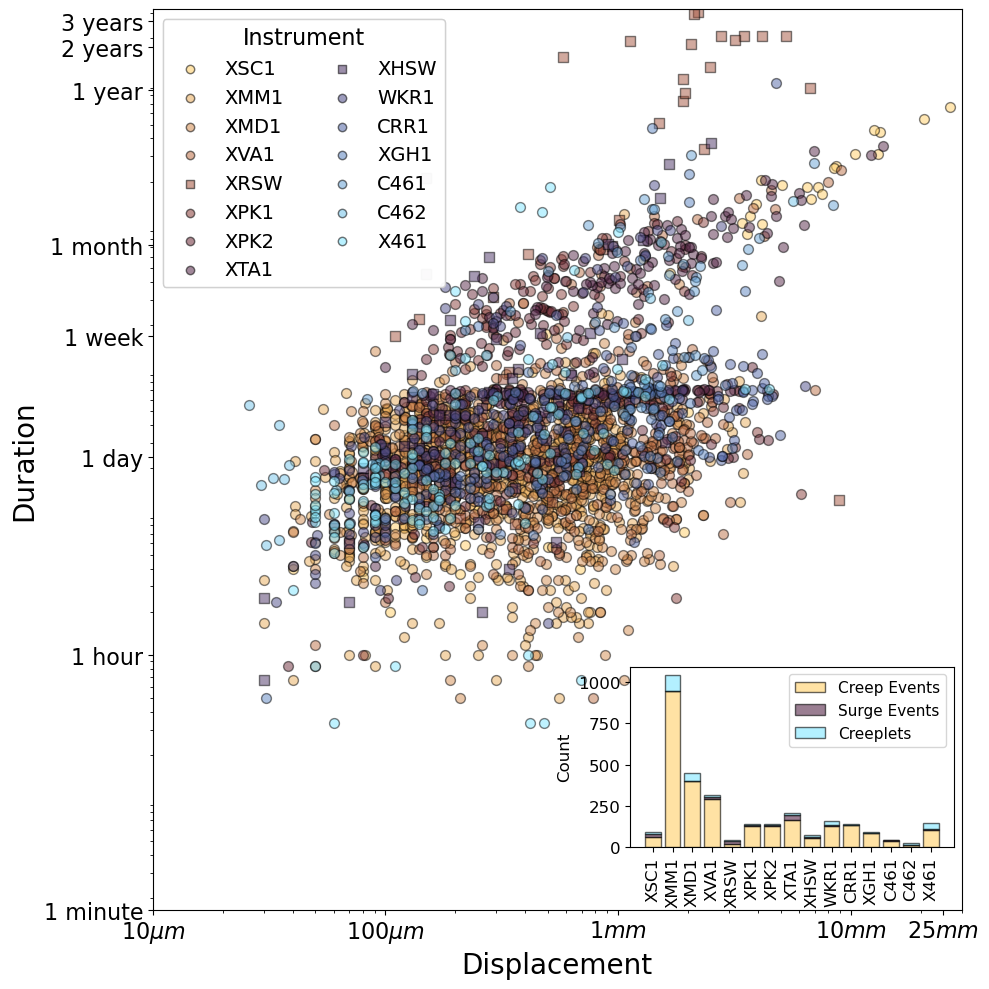

In [385]:
fig = plt.figure(figsize=(10,10))
axa = plt.subplot(1,1,1)
#axa.set_title("Hayward")
scatter_points_bars(PARK,df_all,axa,cmap,xticks=True,yticks=True,df_ce=df_ce, df_surge=df_surge, df_creeplet=df_creeplet)
plt.tight_layout()
plt.savefig('../../Creep_catalog_stats_figures/New Plots/Parkfield_duration_vs_displacement_bars.pdf')
plt.show()

/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/711387788.py:9: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axis.set_ylim([0,20])
/Users/dagi9522/miniconda3/envs/creepmeters/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/dagi9522/miniconda3/envs/creepmeters/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/711387788.py:54: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axis.sc

no events
no events
no events


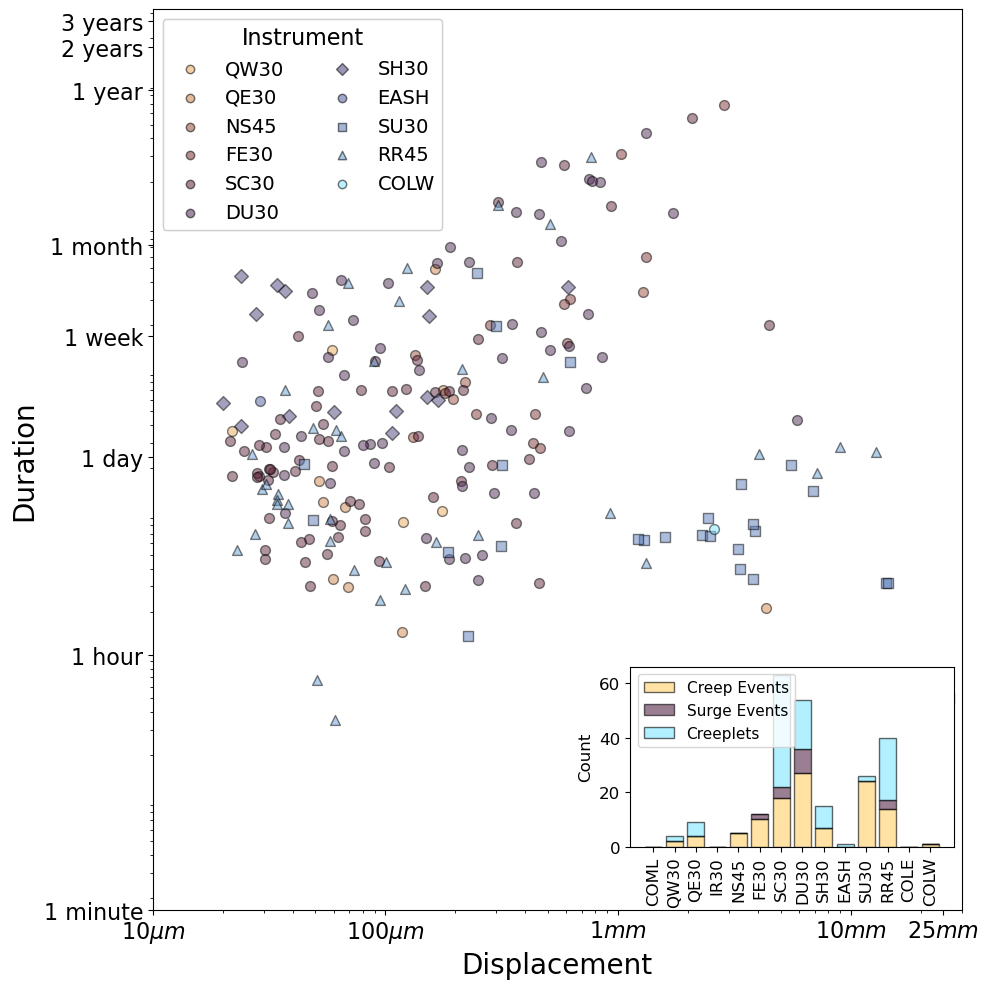

In [386]:
fig = plt.figure(figsize=(10,10))
axa = plt.subplot(1,1,1)
#axa.set_title("Hayward")
scatter_points_bars(SOCAL,df_all,axa,cmap,xticks=True,yticks=True,df_ce=df_ce, df_surge=df_surge, df_creeplet=df_creeplet)
plt.tight_layout()
plt.savefig('../../Creep_catalog_stats_figures/New Plots/SoCal_duration_vs_displacement_bars.pdf')
plt.show()

/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/711387788.py:9: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axis.set_ylim([0,20])
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/711387788.py:54: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k')
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/711387788.py:94: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  plt.xlim([0,30])
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/2166877608.py:5: UserWarning: This figure includes Axes that are not compatib

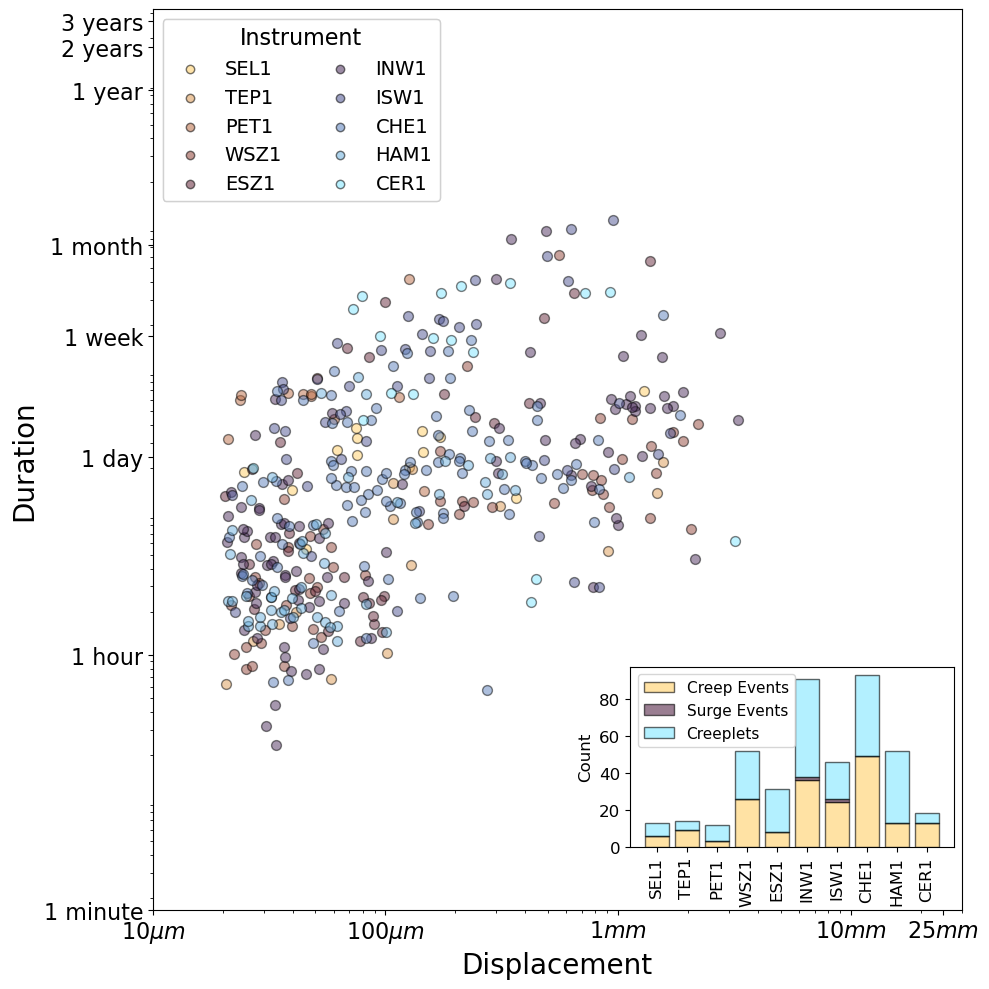

In [391]:
fig = plt.figure(figsize=(10,10))
axa = plt.subplot(1,1,1)
#axa.set_title("Hayward")
scatter_points_bars(NAF,df_all,axa,cmap,xticks=True,yticks=True,df_ce=df_ce, df_surge=df_surge, df_creeplet=df_creeplet)
plt.tight_layout()
plt.savefig('../../Creep_catalog_stats_figures/New Plots/NAF_duration_vs_displacement_bars.pdf')
plt.show()

/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/711387788.py:9: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axis.set_ylim([0,20])
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/711387788.py:54: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k')
/Users/dagi9522/miniconda3/envs/creepmeters/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/dagi9522/miniconda3/envs/creepmeters/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value enc

no events


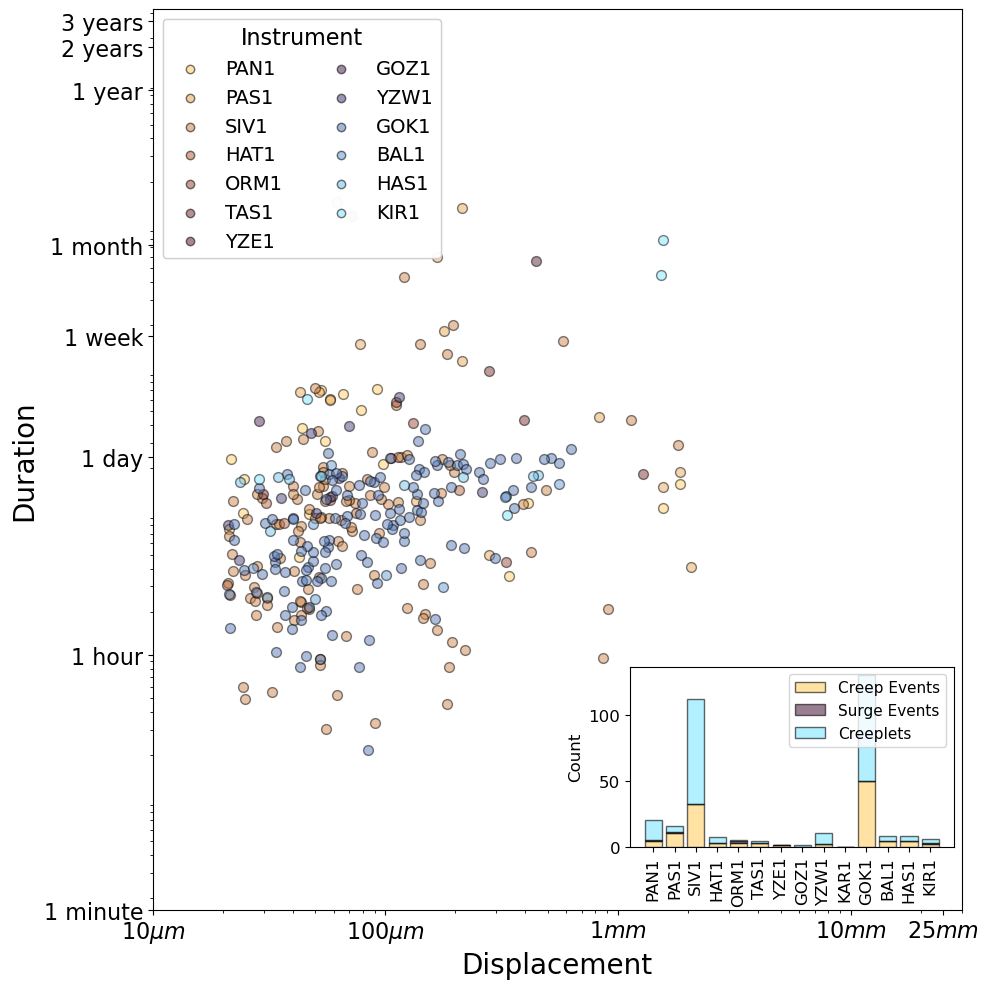

In [392]:
fig = plt.figure(figsize=(10,10))
axa = plt.subplot(1,1,1)
#axa.set_title("Hayward")
scatter_points_bars(EAF,df_all,axa,cmap,xticks=True,yticks=True,df_ce=df_ce, df_surge=df_surge, df_creeplet=df_creeplet)
plt.tight_layout()
plt.savefig('../../Creep_catalog_stats_figures/New Plots/EAF_duration_vs_displacement_bars.pdf')
plt.show()

In [393]:
others = pd.concat([DSF,CHAF,UTA])

/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/711387788.py:9: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axis.set_ylim([0,20])
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/711387788.py:42: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k',marker='s')
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/711387788.py:46: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a

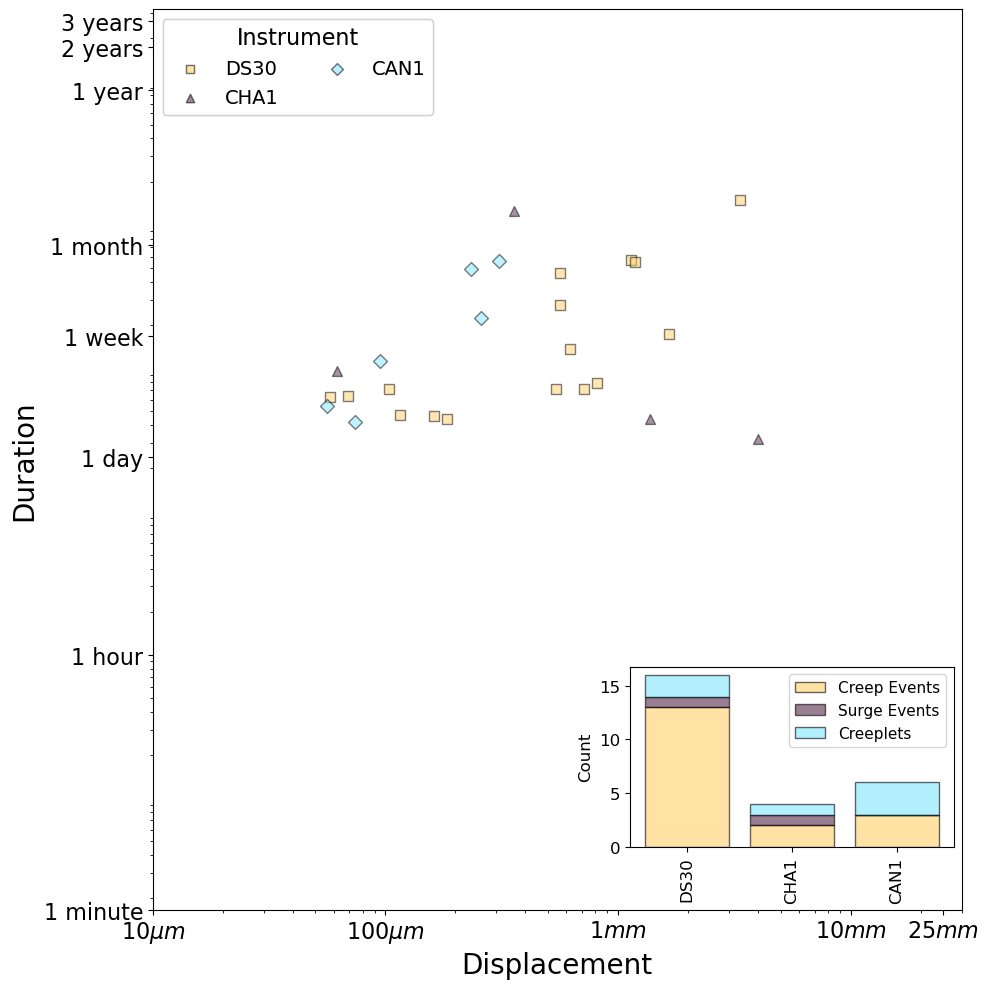

In [394]:
fig = plt.figure(figsize=(10,10))
axa = plt.subplot(1,1,1)
#axa.set_title("Hayward")
scatter_points_bars(others,df_all,axa,cmap,xticks=True,yticks=True,df_ce=df_ce, df_surge=df_surge, df_creeplet=df_creeplet)
plt.tight_layout()
plt.savefig('../../Creep_catalog_stats_figures/New Plots/Utah_Pakistan_Israel_duration_vs_displacement_bars.pdf')
plt.show()

In [342]:
df_all[df_all['Creepmeter abbreviation']=='SU30']

,Network,Creepmeter full name,Creepmeter abbreviation,Latitude,Longitude,"Sampling rate, s",Start Time,End Time,"Displacement, mm","Duration, hrs","Maximum velocity, m/s","Time to next event, days",Event_id
2761,SOCAL,Superstition Hills,SU30,32.9303,-115.7009,600.0,2006-10-03 19:00:00,2006-10-03 22:10:00,14.172333,3.166667,9.649063e-06,First Event,2761_SU30
2762,SOCAL,Superstition Hills,SU30,32.9303,-115.7009,600.0,2006-10-03 22:10:00,2006-10-04 02:10:00,3.344013,4.000000,2.084234e-06,0.13194444444444445,2762_SU30
2763,SOCAL,Superstition Hills,SU30,32.9303,-115.7009,600.0,2006-10-04 02:10:00,2006-10-04 11:10:00,2.445425,9.000000,1.126988e-06,0.16666666666666666,2763_SU30
2764,SOCAL,Superstition Hills,SU30,32.9303,-115.7009,600.0,2006-10-04 11:10:00,2006-10-04 17:50:00,1.593256,6.666667,6.329683e-07,0.375,2764_SU30
2765,SOCAL,Superstition Hills,SU30,32.9303,-115.7009,600.0,2006-10-05 05:50:00,2006-10-05 12:40:00,2.285175,6.833333,1.682764e-06,0.7777777777777778,2765_SU30
2766,SOCAL,Superstition Hills,SU30,32.9303,-115.7009,600.0,2006-10-05 19:10:00,2006-10-06 01:30:00,1.289801,6.333333,6.774243e-07,0.5555555555555556,2766_SU30
2768,SOCAL,Superstition Hills,SU30,32.9303,-115.7009,600.0,2006-10-08 15:50:00,2006-10-09 12:50:00,0.316388,21.000000,3.849002e-08,2.861111111111111,2768_SU30
2769,SOCAL,Superstition Hills,SU30,32.9303,-115.7009,600.0,2006-10-11 23:50:00,2006-10-12 07:10:00,3.890186,7.333333,2.807847e-06,3.3333333333333335,2769_SU30
2774,SOCAL,Superstition Hills,SU30,32.9303,-115.7009,600.0,2006-10-17 08:30:00,2006-10-25 13:10:00,0.299402,196.666667,5.030645e-08,5.361111111111111,2774_SU30
2781,SOCAL,Superstition Hills,SU30,32.9303,-115.7009,600.0,2006-11-12 01:44:16,2006-11-16 16:04:16,0.622474,110.333333,3.859587e-08,25.71824074074074,2781_SU30


In [16]:
def scatter_points_events(instrument_dataframe,event_dataframe,axis,cmap,xticks=True,yticks=True):
    axis.set_xscale('log')
    axis.set_yscale('log')
    axis.set_xlim([1/60,10000])
    axis.set_ylim([0,20])
    x = []
    y= []
    total_events = 0
    for i in range(len(instrument_dataframe)):
        abbrv = instrument_dataframe['Creepmeter_abbrv'].iloc[i]
        colours  = cmap(np.linspace(0, 1, len(instrument_dataframe)))
        #print(abbrv)
        try:
            instrument_df = event_dataframe[event_dataframe['Creepmeter abbreviation'] == abbrv]
            total_events = total_events+len(instrument_df)
            print(f'{abbrv} has {len(instrument_df)} events')
            displacement = instrument_df['Displacement, mm']
            duration = instrument_df['Duration, hrs']

            
            if abbrv in ['SU30','XHSW','XRSW','XSH1','DS30']:
                axis.scatter(displacement,duration,s=5,c=rgb2hex(colours[i]),alpha=0.5,edgecolors='k',marker='s')
                axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k',marker='s')
            elif abbrv in ['RR45','CHA1']:
                axis.scatter(displacement,duration,s=5,c=rgb2hex(colours[i]),alpha=0.5,edgecolors='k',marker='^')
                axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k',marker='^')
            elif abbrv in ['SH30','CAN1']:
                axis.scatter(displacement,duration,s=5,c=rgb2hex(colours[i]),alpha=0.5,edgecolors='k',marker='D')
                axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k',marker='D')
            else:
                axis.scatter(displacement,duration,s=5,c=rgb2hex(colours[i]),alpha=0.5,edgecolors='k')
                axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k')
                
            
        

        except IndexError:
            print('no events')

    

    # First legend (Color & Marker Style) - Automatically created by seaborn/matplotlib
    legend1 = plt.legend(title="Instrument", loc="upper left", frameon=True,fontsize=10)




    # Add both legends
    plt.gca().add_artist(legend1)  # Keep the first legend
    
    # Set custom tick positions
    if yticks== True:
        axis.set_yticks([1/60,1, 24, 168,720,8760])
        axis.set_yticklabels(['1 minute','1 hour', '1 day', '1 week','1 month','1 year'])
        axis.set_ylabel('Duration')
    
    else:
        axis.set_yticks([1/60,1, 24, 168,720,8760])
        axis.set_yticklabels(['', '', '','',''])
        
    if xticks == True:
        axis.set_xticks([0.01,0.1,1,10])
        axis.set_xticklabels([ r'10$\mu m$', r'100$\mu m$',r'1$mm$',r'10$mm$'])
        axis.set_xlabel('Displacement')
    else:
        axis.set_xticks([0.01,0.1,1,10])
        axis.set_xticklabels([ '', '','',''],fontsize=20)

    plt.xlim([0,20])
    plt.ylim([1/60,10000])
    plt.text(0.015,168,f'{total_events} events')
    return

/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/4235053922.py:5: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axis.set_ylim([0,20])
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/4235053922.py:32: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k')
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/4235053922.py:69: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  plt.xlim([0,20])
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/4235053922.py:5: UserWarning: Attempt to set non-positive ylim on a log-sc

CPP1 has 2 events
CTM1 has 28 events
COZ1 has 168 events
CHP1 has 0 events
CFW1 has 288 events
XSH1 has 43 events
SJN1 has 101 events
XSJ2 has 76 events
XSJ3 has 70 events
XHR1 has 23 events
XHR2 has 99 events
XHR3 has 90 events
CWC3 has 70 events
CWN1 has 215 events
FCR1 has 34 events
XMR1 has 302 events
XSC1 has 91 events
XMM1 has 1044 events
XMD1 has 449 events
XVA1 has 315 events
XRSW has 37 events
XPK1 has 135 events
XPK2 has 138 events
XTA1 has 203 events
XHSW has 69 events
WKR1 has 158 events
CRR1 has 139 events
XGH1 has 88 events
C461 has 43 events
C462 has 24 events
X461 has 146 events
COML has 0 events
QW30 has 4 events
QE30 has 9 events
IR30 has 0 events
NS45 has 5 events
FE30 has 12 events
SC30 has 63 events
DU30 has 54 events
SH30 has 15 events
EASH has 1 events
SU30 has 26 events
RR45 has 40 events
COLE has 0 events
COLW has 1 events
SEL1 has 13 events
TEP1 has 14 events
PET1 has 12 events
WSZ1 has 52 events
ESZ1 has 31 events
INW1 has 91 events
ISW1 has 46 events
CHE1 ha

/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/4235053922.py:5: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axis.set_ylim([0,20])
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/4235053922.py:32: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k')
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/4235053922.py:29: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D arra

HAS1 has 8 events
KIR1 has 6 events
DS30 has 16 events
CHA1 has 4 events
CAN1 has 6 events


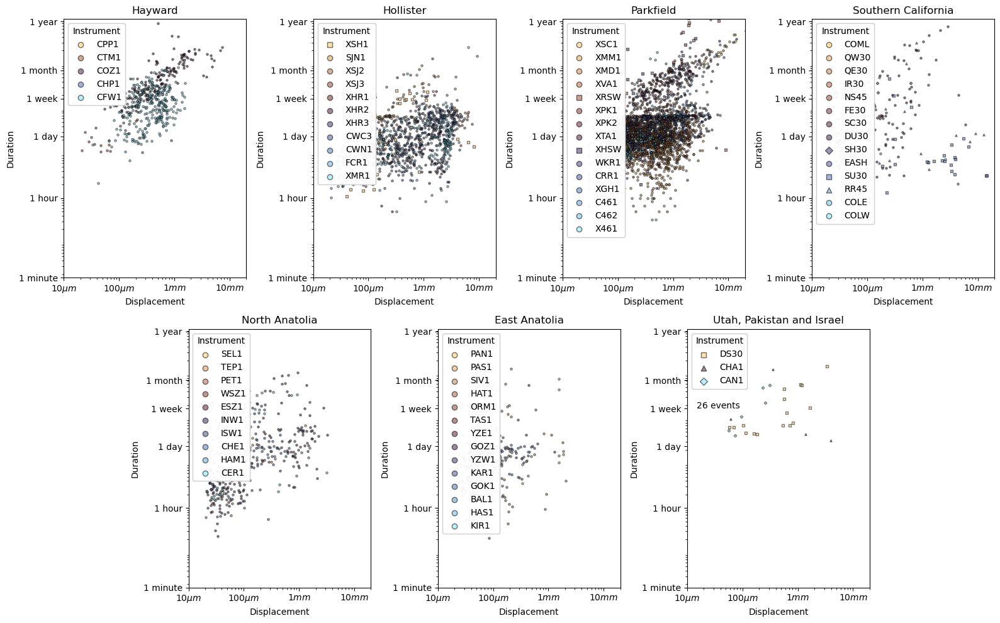

In [17]:
#df_all = pd.read_csv("../../Data/DATA_tidied/Picks/All_picks_12_JUN_2025.csv",index_col=0)
fig = plt.figure(figsize=(16,10))
axa = plt.subplot2grid((4, 8), (0, 0), colspan=2,rowspan=2)
axa.set_title("Hayward")
scatter_points_events(HAY,df_all,axa,cmap,xticks=True,yticks=True)
axb = plt.subplot2grid((4, 8), (0, 2), colspan=2, rowspan=2)
axb.set_title("Hollister")
scatter_points_events(HOL,df_all,axb,cmap,xticks=True,yticks=True)  
axc = plt.subplot2grid((4, 8), (0, 4), colspan=2, rowspan=2) 
axc.set_title("Parkfield")
scatter_points_events(PARK,df_all,axc,cmap,xticks=True,yticks=True) 
axd = plt.subplot2grid((4, 8), (0, 6), colspan=2, rowspan=2)
axd.set_title("Southern California")
scatter_points_events(SOCAL,df_all,axd,cmap,xticks=True,yticks=True)
axe = plt.subplot2grid((4, 8), (2, 1), colspan=2, rowspan=2) 
axe.set_title("North Anatolia")  
scatter_points_events(NAF,df_all,axe,cmap,xticks=True,yticks=True)         
axf = plt.subplot2grid((4, 8), (2, 3), colspan=2, rowspan=2) 
axf.set_title("East Anatolia")
scatter_points_events(EAF,df_all,axf,cmap,xticks=True,yticks=True) 
axg = plt.subplot2grid((4, 8), (2, 5), colspan=2, rowspan=2)
axg.set_title("Utah, Pakistan and Israel")
others = pd.concat([DSF,CHAF,UTA])
scatter_points_events(others,df_all,axg,cmap,xticks=True,yticks=True) 
fig.tight_layout()
#plt.savefig('../../Creep_catalog_stats_figures/duration_vs_displacement_regions.pdf')
plt.show()

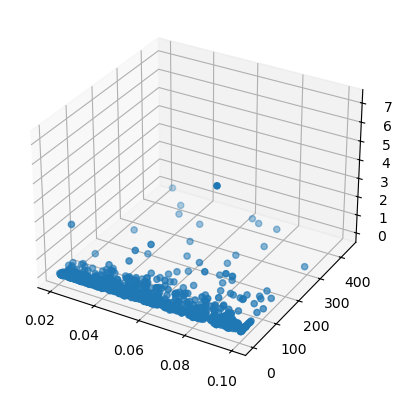

In [21]:

fig=plt.figure()
ax = fig.add_subplot(111,projection='3d')
ax.scatter(df_creeplet['Displacement, mm'],df_creeplet['Duration, hrs'],df_creeplet['Maximum velocity, m/s'])
plt.ion()


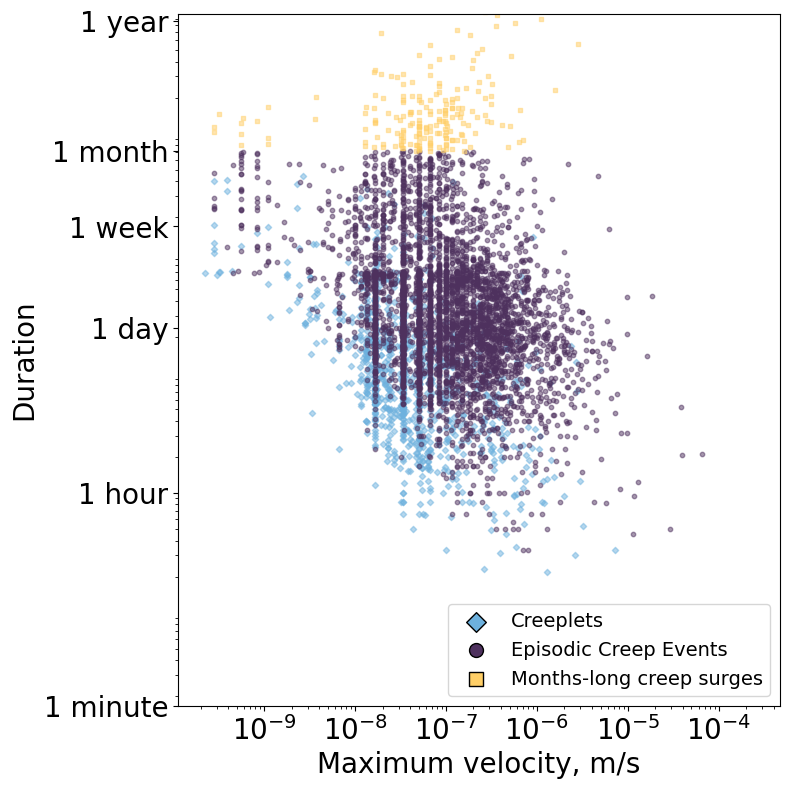

In [18]:
plt.figure(figsize=(8,8))
axis = plt.subplot(1,1,1)
plt.scatter(df_creeplet['Maximum velocity, m/s'],df_creeplet['Duration, hrs'],color = rgb2hex(colours[8]),s=10,alpha=0.5,marker='D')

plt.scatter([],[],color = rgb2hex(colours[8]),label = 'Creeplets',s=100,edgecolors='k',marker='D')

plt.scatter(df_ce['Maximum velocity, m/s'],df_ce['Duration, hrs'],color = rgb2hex(colours[5]),s=10,alpha=0.5,marker='o')

plt.scatter([],[],color = rgb2hex(colours[5]),label = 'Episodic Creep Events',s=100,edgecolors='k',marker='o')

plt.scatter(df_surge['Maximum velocity, m/s'],df_surge['Duration, hrs'],color = rgb2hex(colours[0]),s=10,alpha=0.5,marker='s')

plt.scatter([],[],color = rgb2hex(colours[0]),label = 'Months-long creep surges',s=100,edgecolors='k',marker='s')

plt.yscale('log')
plt.xscale('log')
plt.xlabel('Maximum velocity, m/s',fontsize=20)
plt.ylabel('Duration',fontsize=20) 
axis.set_yticks([1/60, 1, 24, 168,720,8760])
#axis.set_xticks([0.01,0.1,1,10])
axis.set_yticklabels(['1 minute','1 hour', '1 day', '1 week','1 month','1 year'],fontsize=20)
#axis.set_xticklabels([ r'10$\mu m$', r'100$\mu m$',r'1$mm$',r'10$mm$'],fontsize=20)
#plt.xlim([0,20])
plt.ylim([1/60,10000])
plt.xticks(fontsize=20)

plt.legend(fontsize=14,loc='lower right')
plt.tight_layout()


plt.savefig('../../Creep_catalog_stats_figures/New Plots/loglog_transients_vel_vs_dur.pdf')
plt.show()

In [19]:
def linregress_to_plot(x,y):
    # Take log10 of both axes
    log_x = np.log10(x)
    log_y = np.log10(y)

    # Perform linear regression on log-log data
    result = linregress(log_x, log_y)
    slope = result.slope
    intercept = result.intercept

    # Best-fit line in log space
    log_x_fit = np.linspace(log_x.min(), log_x.max(), 100)
    log_y_fit = slope * log_x_fit + intercept

    # Convert back to linear space for plotting
    x_fit = 10**log_x_fit
    y_fit = 10**log_y_fit
    return x_fit, y_fit, slope,intercept

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


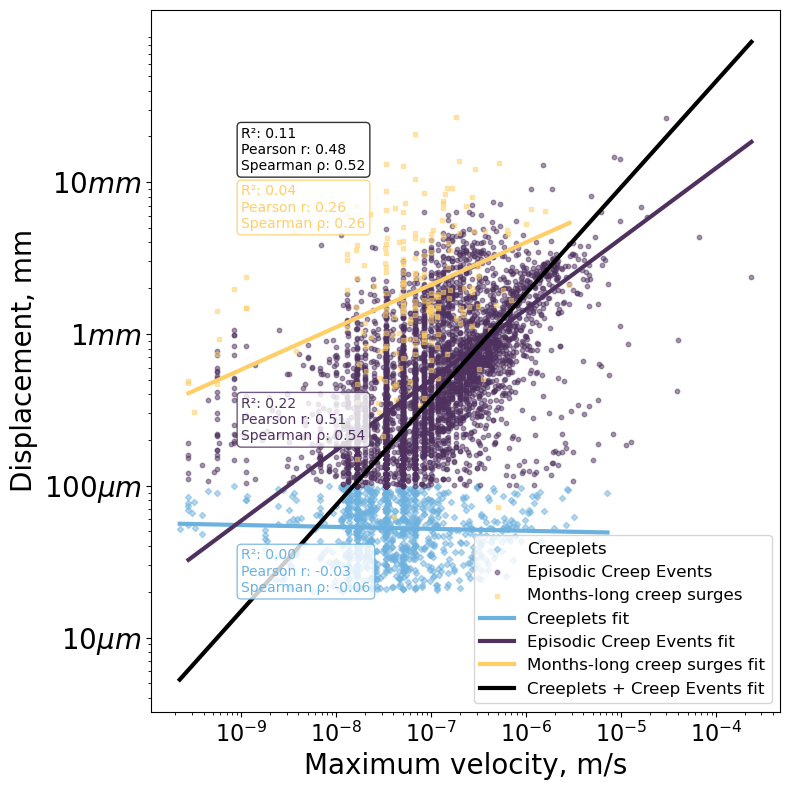

In [20]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.odr import ODR, Model, RealData
from scipy.stats import spearmanr, pearsonr

def odr_powerlaw_fit(x, y):
    def f(B, x):
        return B[0] + B[1] * x

    mask = (x > 0) & (y > 0)
    x = x[mask]
    y = y[mask]

    log_x = np.log10(x)
    log_y = np.log10(y)

    data = RealData(log_x, log_y)
    model = Model(f)
    odr = ODR(data, model, beta0=[0., 1.])
    out = odr.run()
    intercept_odr, slope_odr = out.beta

    log_x_fit = np.linspace(log_x.min(), log_x.max(), 100)
    log_y_fit = intercept_odr + slope_odr * log_x_fit

    x_fit = 10**log_x_fit
    y_fit = 10**log_y_fit

    ss_res = np.sum((log_y - (intercept_odr + slope_odr * log_x))**2)
    ss_tot = np.sum((log_y - np.mean(log_y))**2)
    r_squared = 1 - ss_res / ss_tot

    r_pearson, _ = pearsonr(log_x, log_y)
    r_spearman, _ = spearmanr(log_x, log_y)

    return x_fit, y_fit, slope_odr, intercept_odr, out.res_var, r_squared, r_pearson, r_spearman

def add_stat_text(ax, xpos, ypos, stats, colour):
    textstr = (f"R²: {stats['r2']:.2f}\n"
               f"Pearson r: {stats['pearson']:.2f}\n"
               f"Spearman ρ: {stats['spearman']:.2f}")
    bbox = dict(boxstyle="round,pad=0.3", edgecolor=colour, facecolor="white", alpha=0.8)
    ax.text(xpos, ypos, textstr, fontsize=10, color=colour, bbox=bbox)

# Plotting setup
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xscale('log')
ax.set_yscale('log')

# Scatter points
ax.scatter(df_creeplet['Maximum velocity, m/s'], df_creeplet['Displacement, mm'], 
           color=colours[8], s=10, alpha=0.5, marker='D', label='Creeplets')
ax.scatter(df_ce['Maximum velocity, m/s'], df_ce['Displacement, mm'], 
           color=colours[5], s=10, alpha=0.5, marker='o', label='Episodic Creep Events')
ax.scatter(df_surge['Maximum velocity, m/s'], df_surge['Displacement, mm'], 
           color=colours[0], s=10, alpha=0.5, marker='s', label='Months-long creep surges')

# Combined dataset
df_CE_creeplet = pd.concat([df_creeplet, df_ce])

# Fit lines
datasets = [
    ('Creeplets', df_creeplet, colours[8], 1e-9, 0.02),
    ('Episodic Creep Events', df_ce, colours[5], 1e-9, 0.2),
    ('Months-long creep surges', df_surge, colours[0], 1e-9, 5),
    ('Creeplets + Creep Events', df_CE_creeplet, 'k', 1e-9, 12),
]

for label, df, colour, xpos, ypos in datasets:
    x_fit, y_fit, slope, intercept, res_var, r2, pearson_r, spearman_r = odr_powerlaw_fit(
        df['Maximum velocity, m/s'], df['Displacement, mm'])
    ax.plot(x_fit, y_fit, color=colour, linewidth=3, label=f'{label} fit')
    stats = {
        'slope': slope, 'intercept': intercept, 'r2': r2,
        'pearson': pearson_r, 'spearman': spearman_r
    }
    add_stat_text(ax, xpos, ypos, stats, colour)

# Axes and legend
ax.set_xlabel('Maximum velocity, m/s', fontsize=20)
ax.set_ylabel('Displacement, mm', fontsize=20)
ax.set_yticks([0.01, 0.1, 1, 10])
ax.set_yticklabels([r'10$\mu m$', r'100$\mu m$', r'1$mm$', r'10$mm$'], fontsize=20)
ax.tick_params(axis='x', labelsize=16)
ax.legend(fontsize=12, loc='lower right')
plt.tight_layout()
plt.show()  # Omitted as requested


In [21]:
def odr_powerlaw_fit_with_stats(x, y):
    from scipy.odr import ODR, Model, RealData
    from scipy.stats import spearmanr, pearsonr
    import numpy as np

    def f(B, x):
        return B[0] + B[1] * x  # log10(y) = B[0] + B[1]*log10(x)

    # Clean and log-transform data
    mask = np.isfinite(x) & np.isfinite(y) & (x > 0) & (y > 0)
    x_clean = x[mask]
    y_clean = y[mask]
    log_x = np.log10(x_clean)
    log_y = np.log10(y_clean)

    # Fit model
    data = RealData(log_x, log_y)
    model = Model(f)
    odr = ODR(data, model, beta0=[0., 1.])
    out = odr.run()

    intercept_odr, slope_odr = out.beta
    res_var = out.res_var

    # Generate fitted line in log space
    log_x_fit = np.linspace(log_x.min(), log_x.max(), 100)
    log_y_fit = f([intercept_odr, slope_odr], log_x_fit)
    x_fit = 10**log_x_fit
    y_fit = 10**log_y_fit

    # Calculate statistics
    ss_res = np.sum((log_y - f([intercept_odr, slope_odr], log_x))**2)
    ss_tot = np.sum((log_y - np.mean(log_y))**2)
    r2 = 1 - ss_res / ss_tot
    pearson_r, pearson_p = pearsonr(log_x, log_y)
    spearman_rho, _ = spearmanr(log_x, log_y)

    return {
        "x_fit": x_fit,
        "y_fit": y_fit,
        "slope": slope_odr,
        "intercept": intercept_odr,
        "res_var": res_var,
        "r2": r2,
        "pearson_r": pearson_r,
        "pearson_p": pearson_p,
        "spearman_rho": spearman_rho,
    }

# Compute fits
fit_results = {}

fit_results["Creeplets"] = odr_powerlaw_fit_with_stats(
    df_creeplet["Maximum velocity, m/s"], df_creeplet["Displacement, mm"]
)

fit_results["Creep Events"] = odr_powerlaw_fit_with_stats(
    df_ce["Maximum velocity, m/s"], df_ce["Displacement, mm"]
)

fit_results["Surges"] = odr_powerlaw_fit_with_stats(
    df_surge["Maximum velocity, m/s"], df_surge["Displacement, mm"]
)

# Combined Creeplets + Creep Events + Surges
fit_results["Combined Transients (clts+ce)"] = odr_powerlaw_fit_with_stats(
    pd.concat([
        df_creeplet["Maximum velocity, m/s"],
        df_ce["Maximum velocity, m/s"],
    ]),
    pd.concat([
        df_creeplet["Displacement, mm"],
        df_ce["Displacement, mm"],
    ])
)

fit_results["Combined Transients (all)"] = odr_powerlaw_fit_with_stats(
    pd.concat([
        df_creeplet["Maximum velocity, m/s"],
        df_ce["Maximum velocity, m/s"],
        df_surge["Maximum velocity, m/s"]
    ]),
    pd.concat([
        df_creeplet["Displacement, mm"],
        df_ce["Displacement, mm"],
        df_surge["Displacement, mm"]
    ])
)

# Print results
for label, stats in fit_results.items():
    print(f"\n=== {label} ===")
    print(f"Slope (b):         {stats['slope']:.3f}")
    print(f"Intercept (log a): {stats['intercept']:.3f}")
    print(f"Residual var:      {stats['res_var']:.3e}")
    print(f"R²:                {stats['r2']:.3f}")
    print(f"Pearson r:         {stats['pearson_r']:.3f} (p = {stats['pearson_p']:.3e})")
    print(f"Spearman ρ:        {stats['spearman_rho']:.3f}")


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


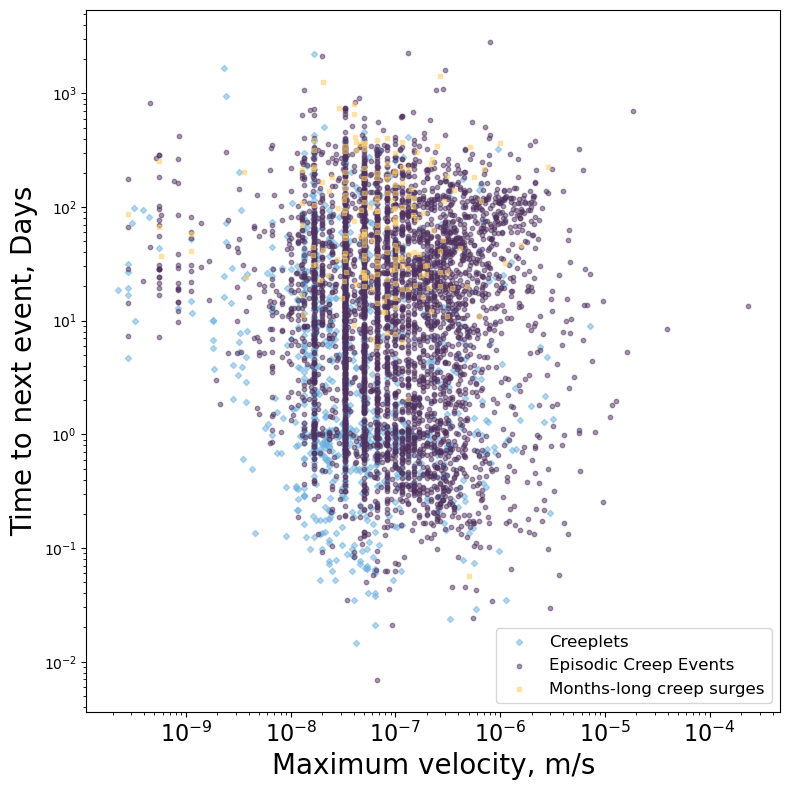

In [22]:


def odr_powerlaw_fit(x, y):
    def f(B, x):
        return B[0] + B[1] * x

    mask = (x > 0) & (y > 0)
    x = x[mask]
    y = y[mask]

    log_x = np.log10(x)
    log_y = np.log10(y)

    data = RealData(log_x, log_y)
    model = Model(f)
    odr = ODR(data, model, beta0=[0., 1.])
    out = odr.run()
    intercept_odr, slope_odr = out.beta

    log_x_fit = np.linspace(log_x.min(), log_x.max(), 100)
    log_y_fit = intercept_odr + slope_odr * log_x_fit

    x_fit = 10**log_x_fit
    y_fit = 10**log_y_fit

    ss_res = np.sum((log_y - (intercept_odr + slope_odr * log_x))**2)
    ss_tot = np.sum((log_y - np.mean(log_y))**2)
    r_squared = 1 - ss_res / ss_tot

    r_pearson, _ = pearsonr(log_x, log_y)
    r_spearman, _ = spearmanr(log_x, log_y)

    return x_fit, y_fit, slope_odr, intercept_odr, out.res_var, r_squared, r_pearson, r_spearman

def add_stat_text(ax, xpos, ypos, stats, colour):
    textstr = (f"R²: {stats['r2']:.2f}\n"
               f"Pearson r: {stats['pearson']:.2f}\n"
               f"Spearman ρ: {stats['spearman']:.2f}")
    bbox = dict(boxstyle="round,pad=0.3", edgecolor=colour, facecolor="white", alpha=0.8)
    ax.text(xpos, ypos, textstr, fontsize=10, color=colour, bbox=bbox)

# Plotting setup
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xscale('log')
ax.set_yscale('log')

creeplets_dropped = df_creeplet.copy(deep=True)
creeplets_dropped.drop(df_creeplet[df_creeplet['Time to next event, days']=='First Event'].index,inplace=True)
creeplets_dropped['Time to next event, days'] = creeplets_dropped['Time to next event, days'].astype('Float64')

ce_dropped = df_ce.drop(df_ce[df_ce['Time to next event, days']=='First Event'].index)
ce_dropped['Time to next event, days'] = ce_dropped['Time to next event, days'].astype('Float64')

surge_dropped = df_surge.copy(deep=True)
surge_dropped = surge_dropped.drop(surge_dropped[surge_dropped['Time to next event, days']=='First Event'].index)
surge_dropped['Time to next event, days'] = surge_dropped['Time to next event, days'].astype('Float64')
# Scatter points
ax.scatter(creeplets_dropped['Maximum velocity, m/s'], creeplets_dropped['Time to next event, days'], color=colours[8], s=10, alpha=0.5, marker='D', label='Creeplets')
ax.scatter(ce_dropped['Maximum velocity, m/s'], ce_dropped['Time to next event, days'], color=colours[5], s=10, alpha=0.5, marker='o', label='Episodic Creep Events')
ax.scatter(surge_dropped['Maximum velocity, m/s'], surge_dropped['Time to next event, days'], color=colours[0], s=10, alpha=0.5, marker='s', label='Months-long creep surges')

# Combined dataset
df_CE_creeplet = pd.concat([df_creeplet, df_ce])

# Fit lines
datasets = [
    ('Creeplets', df_creeplet, colours[8], 1e-9, 0.02),
    ('Episodic Creep Events', df_ce, colours[5], 1e-9, 0.2),
    ('Months-long creep surges', df_surge, colours[0], 1e-9, 5),
    ('Creeplets + Creep Events', df_CE_creeplet, 'k', 1e-9, 12),
]

'''for label, df, colour, xpos, ypos in datasets:
    x_fit, y_fit, slope, intercept, res_var, r2, pearson_r, spearman_r = odr_powerlaw_fit(
        df['Maximum velocity, m/s'], df['Displacement, mm'])
    ax.plot(x_fit, y_fit, color=colour, linewidth=3, label=f'{label} fit')
    stats = {
        'slope': slope, 'intercept': intercept, 'r2': r2,
        'pearson': pearson_r, 'spearman': spearman_r
    }
    add_stat_text(ax, xpos, ypos, stats, colour)'''

# Axes and legend
ax.set_xlabel('Maximum velocity, m/s', fontsize=20)
ax.set_ylabel('Time to next event, Days', fontsize=20)
#ax.set_yticks([0.01, 0.1, 1, 10])
#ax.set_yticklabels([r'10$\mu m$', r'100$\mu m$', r'1$mm$', r'10$mm$'], fontsize=20)
ax.tick_params(axis='x', labelsize=16)
ax.legend(fontsize=12, loc='lower right')
plt.tight_layout()
plt.show()  # Omitted as requested


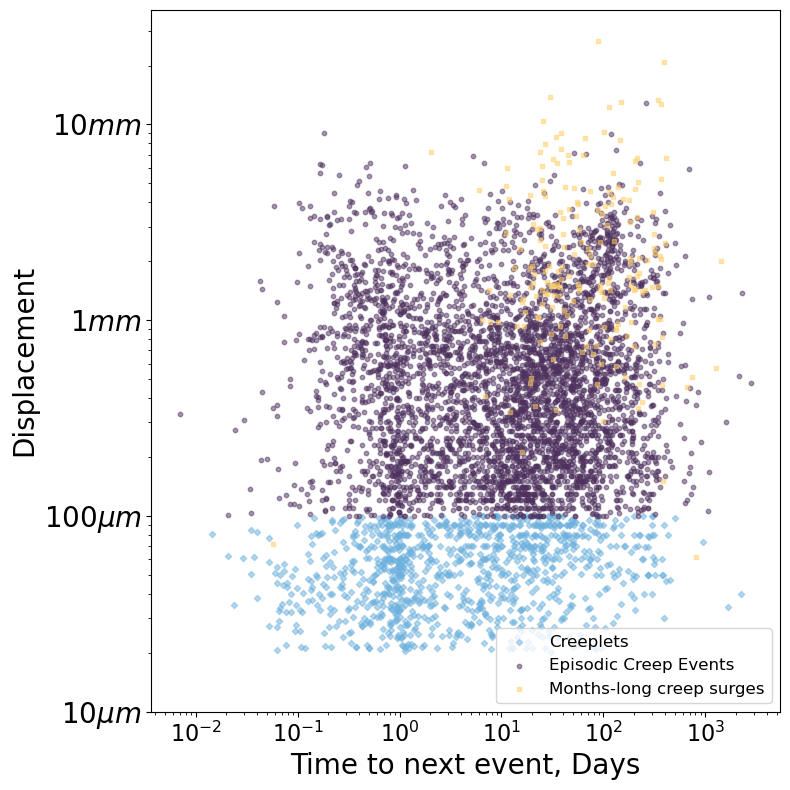

In [23]:


def odr_powerlaw_fit(x, y):
    def f(B, x):
        return B[0] + B[1] * x

    mask = (x > 0) & (y > 0)
    x = x[mask]
    y = y[mask]

    log_x = np.log10(x)
    log_y = np.log10(y)

    data = RealData(log_x, log_y)
    model = Model(f)
    odr = ODR(data, model, beta0=[0., 1.])
    out = odr.run()
    intercept_odr, slope_odr = out.beta

    log_x_fit = np.linspace(log_x.min(), log_x.max(), 100)
    log_y_fit = intercept_odr + slope_odr * log_x_fit

    x_fit = 10**log_x_fit
    y_fit = 10**log_y_fit

    ss_res = np.sum((log_y - (intercept_odr + slope_odr * log_x))**2)
    ss_tot = np.sum((log_y - np.mean(log_y))**2)
    r_squared = 1 - ss_res / ss_tot

    r_pearson, _ = pearsonr(log_x, log_y)
    r_spearman, _ = spearmanr(log_x, log_y)

    return x_fit, y_fit, slope_odr, intercept_odr, out.res_var, r_squared, r_pearson, r_spearman

def add_stat_text(ax, xpos, ypos, stats, colour):
    textstr = (f"R²: {stats['r2']:.2f}\n"
               f"Pearson r: {stats['pearson']:.2f}\n"
               f"Spearman ρ: {stats['spearman']:.2f}")
    bbox = dict(boxstyle="round,pad=0.3", edgecolor=colour, facecolor="white", alpha=0.8)
    ax.text(xpos, ypos, textstr, fontsize=10, color=colour, bbox=bbox)

# Plotting setup
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xscale('log')
ax.set_yscale('log')

creeplets_dropped = df_creeplet.copy(deep=True)
creeplets_dropped.drop(df_creeplet[df_creeplet['Time to next event, days']=='First Event'].index,inplace=True)
creeplets_dropped['Time to next event, days'] = creeplets_dropped['Time to next event, days'].astype('Float64')

ce_dropped = df_ce.drop(df_ce[df_ce['Time to next event, days']=='First Event'].index)
ce_dropped['Time to next event, days'] = ce_dropped['Time to next event, days'].astype('Float64')

surge_dropped = df_surge.copy(deep=True)
surge_dropped = surge_dropped.drop(surge_dropped[surge_dropped['Time to next event, days']=='First Event'].index)
surge_dropped['Time to next event, days'] = surge_dropped['Time to next event, days'].astype('Float64')
# Scatter points
ax.scatter(creeplets_dropped['Time to next event, days'],creeplets_dropped['Displacement, mm'], color=colours[8], s=10, alpha=0.5, marker='D', label='Creeplets')
ax.scatter( ce_dropped['Time to next event, days'],ce_dropped['Displacement, mm'], color=colours[5], s=10, alpha=0.5, marker='o', label='Episodic Creep Events')
ax.scatter( surge_dropped['Time to next event, days'], surge_dropped['Displacement, mm'],color=colours[0], s=10, alpha=0.5, marker='s', label='Months-long creep surges')

# Combined dataset
df_CE_creeplet = pd.concat([df_creeplet, df_ce])

# Fit lines
datasets = [
    ('Creeplets', df_creeplet, colours[8], 1e-9, 0.02),
    ('Episodic Creep Events', df_ce, colours[5], 1e-9, 0.2),
    ('Months-long creep surges', df_surge, colours[0], 1e-9, 5),
    ('Creeplets + Creep Events', df_CE_creeplet, 'k', 1e-9, 12),
]

'''for label, df, colour, xpos, ypos in datasets:
    x_fit, y_fit, slope, intercept, res_var, r2, pearson_r, spearman_r = odr_powerlaw_fit(
        df['Maximum velocity, m/s'], df['Displacement, mm'])
    ax.plot(x_fit, y_fit, color=colour, linewidth=3, label=f'{label} fit')
    stats = {
        'slope': slope, 'intercept': intercept, 'r2': r2,
        'pearson': pearson_r, 'spearman': spearman_r
    }
    add_stat_text(ax, xpos, ypos, stats, colour)'''

# Axes and legend
ax.set_ylabel('Displacement', fontsize=20)
ax.set_xlabel('Time to next event, Days', fontsize=20)
ax.set_yticks([0.01, 0.1, 1, 10])
ax.set_yticklabels([r'10$\mu m$', r'100$\mu m$', r'1$mm$', r'10$mm$'], fontsize=20)
ax.tick_params(axis='x', labelsize=16)
ax.legend(fontsize=12, loc='lower right')
plt.tight_layout()
plt.show()  # Omitted as requested


In [24]:
def scatter_points_events_recurance(instrument_dataframe,event_dataframe,axis,cmap,xticks=True,yticks=True):
    axis.set_xscale('log')
    axis.set_yscale('log')
    axis.set_xlim([1/60,10000])
    axis.set_ylim([0,20])

    for i in range(len(instrument_dataframe)):
        abbrv = instrument_dataframe['Creepmeter_abbrv'].iloc[i]
        colours  = cmap(np.linspace(0, 1, len(instrument_dataframe)))
        #print(abbrv)
        try:
            instrument_df = event_dataframe[event_dataframe['Creepmeter abbreviation'] == abbrv]
            print(f'{abbrv} has {len(instrument_df)} events')
            displacement = instrument_df['Displacement, mm']
            #duration = instrument_df['Duration, hrs']
            start_times = pd.to_datetime(instrument_df['Start Time'])
            time_deltas = start_times.diff().iloc[1:]  # Skip the first NaT

            # Convert timedelta to float days
            days_as_floats = time_deltas.dt.total_seconds() / (24 * 60 * 60)

            # Convert to list
            days_list = days_as_floats.tolist()
            print(days_list)

            print(len(days_list),len(displacement[1:]))

            
            if abbrv in ['SU30','XHSW','XRSW','XSH1','DS30']:
                axis.scatter(days_list,displacement[1:],s=5,c=rgb2hex(colours[i]),alpha=0.5,edgecolors='k',marker='s')
                axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k',marker='s')
            elif abbrv in ['RR45','CHA1']:
                axis.scatter(days_list,displacement[1:],s=5,c=rgb2hex(colours[i]),alpha=0.5,edgecolors='k',marker='^')
                axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k',marker='^')
            elif abbrv in ['SH30','CAN1']:
                axis.scatter(days_list,displacement[1:],s=5,c=rgb2hex(colours[i]),alpha=0.5,edgecolors='k',marker='D')
                axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k',marker='D')
            else:
                axis.scatter(days_list,displacement[1:],s=5,c=rgb2hex(colours[i]),alpha=0.5,edgecolors='k')
                axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k')
                
            
        

        except IndexError:
            print('no events')

    

    # First legend (Color & Marker Style) - Automatically created by seaborn/matplotlib
    #legend1 = plt.legend(title="Instrument", loc="upper left", frameon=True,fontsize=10)




    # Add both legends
    #plt.gca().add_artist(legend1)  # Keep the first legend
    
    # Set custom tick positions
    if xticks== True:
        axis.set_xticks([1/60,1, 24, 168,720,8760])
        axis.set_xticklabels(['1 minute','1 hour', '1 day', '1 week','1 month','1 year'],rotation=90)
        axis.set_xlabel('Time to next event')
    
    else:
        axis.set_xticks([1/60,1, 24, 168,720,8760])
        axis.set_xticklabels(['', '', '','',''])
        
    if yticks == True:
        axis.set_yticks([0.01,0.1,1,10])
        axis.set_yticklabels([ r'10$\mu m$', r'100$\mu m$',r'1$mm$',r'10$mm$'])
        axis.set_ylabel('Displacement')
    else:
        axis.set_yticks([0.01,0.1,1,10])
        axis.set_yticklabels([ '', '','',''],fontsize=20)

    return

/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/3110005986.py:5: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axis.set_ylim([0,20])
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/3110005986.py:40: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k')
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/3110005986.py:40: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D arra

CPP1 has 2 events
[160.82292824074074]
1 1
CTM1 has 28 events
[3485.940972222222, 638.8194328703704, 275.6076388888889, 89.04167824074074, 306.3611111111111, 2119.4166666666665, 31.20138888888889, 2.548611111111111, 108.29165509259259, 46.048611111111114, 295.49306712962965, 304.9791666666667, 5.340266203703703, 18.15277777777778, 322.97431712962964, 197.93472222222223, 184.68055555555554, 9.299293981481481, 256.11528935185186, 0.5465277777777777, 54.04375, 16.16875, 1.1409722222222223, 453.7242939814815, 1.21875, 26.903483796296296, 1.0659722222222223]
27 27
COZ1 has 168 events
[96.70832175925926, 12.083344907407408, 16.916655092592592, 7.208344907407407, 19.375, 4.708333333333333, 7.33332175925926, 21.66667824074074, 26.75, 55.5, 14.541666666666666, 70.08333333333333, 14.45832175925926, 77.375, 19.29167824074074, 84.58332175925926, 31.458344907407408, 19.291655092592592, 43.5, 9.66667824074074, 14.5, 21.541666666666668, 285.0416550925926, 29.04167824074074, 19.0, 24.041666666666668, 

/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/3110005986.py:5: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  axis.set_ylim([0,20])
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/3110005986.py:40: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k')
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/3110005986.py:40: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D arra

PAN1 has 20 events
[5.007638888888889, 289.5469675925926, 504.050474537037, 2.232638888888889, 9.580092592592592, 325.4056018518518, 1.8368055555555556, 0.4722222222222222, 0.9680555555555556, 1.0972222222222223, 1.0868055555555556, 10.848611111111111, 15.553472222222222, 81.45208333333333, 277.76618055555554, 412.32430555555555, 82.09173611111112, 10.022222222222222, 72.90625]
19 19
PAS1 has 16 events
[5.007638888888889, 122.14962962962963, 167.37847222222223, 108.26, 15.743055555555555, 173.05555555555554, 101.65252314814815, 33.87853009259259, 71.42719907407407, 2.420138888888889, 0.9930555555555556, 283.0219560185185, 50.828472222222224, 0.17222222222222222, 1.6590277777777778]
15 15
SIV1 has 112 events
[1.8197916666666667, 35.24166666666667, 4.321527777777778, 0.45208333333333334, 1.052314814814815, 15.038657407407408, 28.152083333333334, 1.0895833333333333, 123.24582175925926, 0.5027777777777778, 1.3020833333333333, 1.3381944444444445, 0.02361111111111111, 0.32256944444444446, 1.

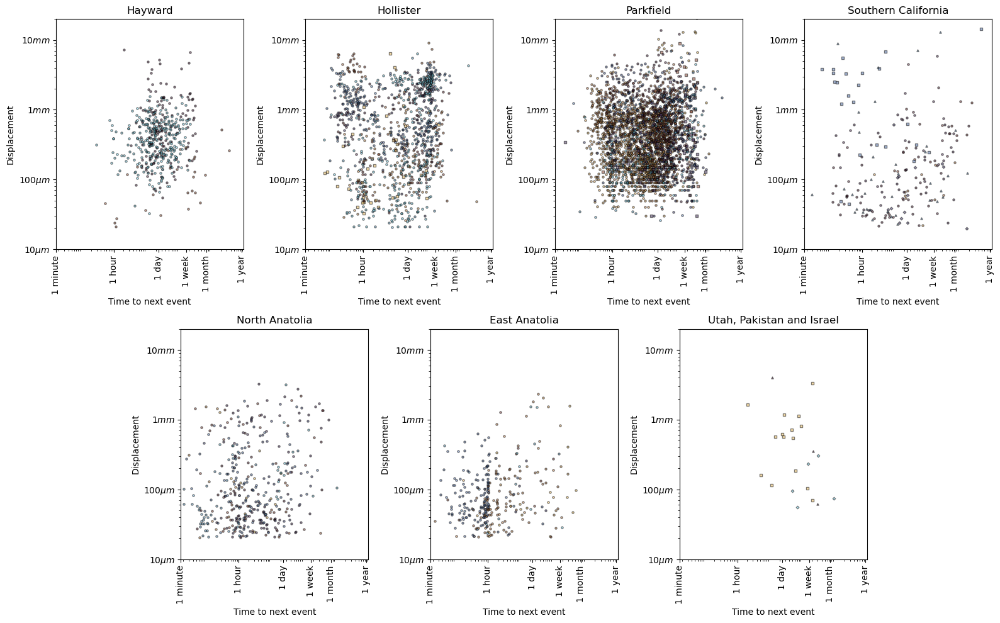

In [25]:
fig = plt.figure(figsize=(16,10))
axa = plt.subplot2grid((4, 8), (0, 0), colspan=2,rowspan=2)
axa.set_title("Hayward")
scatter_points_events_recurance(HAY,df_all,axa,cmap,xticks=True,yticks=True)
axb = plt.subplot2grid((4, 8), (0, 2), colspan=2, rowspan=2)
axb.set_title("Hollister")
scatter_points_events_recurance(HOL,df_all,axb,cmap,xticks=True,yticks=True)  
axc = plt.subplot2grid((4, 8), (0, 4), colspan=2, rowspan=2) 
axc.set_title("Parkfield")
scatter_points_events_recurance(PARK,df_all,axc,cmap,xticks=True,yticks=True) 
axd = plt.subplot2grid((4, 8), (0, 6), colspan=2, rowspan=2)
axd.set_title("Southern California")
scatter_points_events_recurance(SOCAL,df_all,axd,cmap,xticks=True,yticks=True)
axe = plt.subplot2grid((4, 8), (2, 1), colspan=2, rowspan=2) 
axe.set_title("North Anatolia")  
scatter_points_events_recurance(NAF,df_all,axe,cmap,xticks=True,yticks=True)         
axf = plt.subplot2grid((4, 8), (2, 3), colspan=2, rowspan=2) 
axf.set_title("East Anatolia")
scatter_points_events_recurance(EAF,df_all,axf,cmap,xticks=True,yticks=True) 
axg = plt.subplot2grid((4, 8), (2, 5), colspan=2, rowspan=2)
axg.set_title("Utah, Pakistan and Israel")
others = pd.concat([DSF,CHAF,UTA])
scatter_points_events_recurance(others,df_all,axg,cmap,xticks=True,yticks=True) 
fig.tight_layout()
#plt.savefig('../../Creep_catalog_stats_figures/duration_vs_displacement_regions.pdf')
plt.show()

In [26]:
def scatter_points_events_recurance_dur(instrument_dataframe,event_dataframe,axis,cmap,xticks=True,yticks=True):
    axis.set_xscale('log')
    axis.set_yscale('log')
    axis.set_xlim([1/60,10000])
    axis.set_ylim([1/60,10000])

    for i in range(len(instrument_dataframe)):
        abbrv = instrument_dataframe['Creepmeter_abbrv'].iloc[i]
        colours  = cmap(np.linspace(0, 1, len(instrument_dataframe)))
        #print(abbrv)
        try:
            instrument_df = event_dataframe[event_dataframe['Creepmeter abbreviation'] == abbrv]
            start = np.min(pd.to_datetime(instrument_df['Start Time']))
            end = np.max(pd.to_datetime(instrument_df['Start Time']))
            print(f'{abbrv} has {len(instrument_df)} events between {start} - {end}')
            #displacement = instrument_df['Displacement, mm']
            duration = instrument_df['Duration, hrs']
            start_times = pd.to_datetime(instrument_df['Start Time'])
            time_deltas = start_times.diff().iloc[1:]  # Skip the first NaT

            # Convert timedelta to float days
            days_as_floats = time_deltas.dt.total_seconds() / (24 * 60 * 60)

            # Convert to list
            days_list = days_as_floats.tolist()
            

            
            if abbrv in ['SU30','XHSW','XRSW','XSH1','DS30']:
                axis.scatter(days_list,duration[1:],s=5,c=rgb2hex(colours[i]),alpha=0.5,edgecolors='k',marker='s')
                axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k',marker='s')
            elif abbrv in ['RR45','CHA1']:
                axis.scatter(days_list,duration[1:],s=5,c=rgb2hex(colours[i]),alpha=0.5,edgecolors='k',marker='^')
                axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k',marker='^')
            elif abbrv in ['SH30','CAN1']:
                axis.scatter(days_list,duration[1:],s=5,c=rgb2hex(colours[i]),alpha=0.5,edgecolors='k',marker='D')
                axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k',marker='D')
            else:
                axis.scatter(days_list,duration[1:],s=5,c=rgb2hex(colours[i]),alpha=0.5,edgecolors='k')
                axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k')
                
            
        

        except IndexError:
            print('no events')

    

    # First legend (Color & Marker Style) - Automatically created by seaborn/matplotlib
    #legend1 = plt.legend(title="Instrument", loc="upper left", frameon=True,fontsize=10)




    # Add both legends
    #plt.gca().add_artist(legend1)  # Keep the first legend
    
    # Set custom tick positions
    if xticks== True:
        axis.set_xticks([1/60,1, 24, 168,720,8760])
        axis.set_xticklabels(['1 minute','1 hour', '1 day', '1 week','1 month','1 year'],rotation=90)
        axis.set_xlabel('Time to next event')
    
    else:
        axis.set_xticks([1/60,1, 24, 168,720,8760])
        axis.set_xticklabels(['', '', '','',''])
        
    if yticks == True:
        axis.set_yticks([1/60,1, 24, 168,720,8760])
        axis.set_yticklabels(['1 minute','1 hour', '1 day', '1 week','1 month','1 year'],rotation=90)
        axis.set_ylabel('Duration')
    
    else:
        axis.set_yticks([1/60,1, 24, 168,720,8760])
        axis.set_yticklabels(['', '', '','',''])

    return

CPP1 has 2 events between 2020-05-05 00:47:59 - 2020-10-12 20:33:00
CTM1 has 28 events between 1998-01-02 13:00:00 - 2023-05-04 14:26:00
COZ1 has 168 events between 1997-02-14 15:00:00 - 2023-12-09 04:56:00
CHP1 has 0 events between NaT - NaT
CFW1 has 288 events between 1993-12-19 01:00:00 - 2023-08-28 00:22:59
XSH1 has 43 events between 2020-10-27 04:12:00 - 2023-01-06 21:33:59
SJN1 has 101 events between 2004-03-17 03:00:00 - 2023-03-23 15:38:00
XSJ2 has 76 events between 1991-03-08 13:09:59 - 2006-02-06 15:29:59
XSJ3 has 70 events between 2007-07-18 18:09:59 - 2016-06-16 11:39:59
XHR1 has 23 events between 1982-05-17 19:50:00 - 1986-07-07 07:50:00
XHR2 has 99 events between 1992-01-19 13:00:00 - 2005-04-01 06:29:59
XHR3 has 90 events between 2009-08-27 09:49:59 - 2023-02-27 15:09:59
CWC3 has 70 events between 1992-01-07 06:00:00 - 2000-12-02 14:19:59
CWN1 has 215 events between 1992-01-06 22:50:00 - 2023-10-19 15:51:59
FCR1 has 34 events between 2022-06-15 02:59:00 - 2023-10-30 18:0

/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/2931289890.py:40: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k')
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/2931289890.py:40: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k')
/var/folders/56/47k8q3q1449cq8

ISW1 has 46 events between 2020-01-05 00:07:00 - 2023-06-09 23:20:00
CHE1 has 93 events between 2017-06-05 18:15:00 - 2020-03-23 16:12:09
HAM1 has 52 events between 2019-09-23 08:38:42 - 2020-01-18 00:13:00
CER1 has 18 events between 2018-12-19 01:45:41 - 2023-07-21 13:21:29
PAN1 has 20 events between 2017-11-17 04:38:44 - 2023-08-22 10:37:51
PAS1 has 16 events between 2017-11-17 04:38:44 - 2020-12-28 20:11:06
SIV1 has 112 events between 2020-02-05 11:50:31 - 2023-09-28 22:12:00
HAT1 has 7 events between 2023-04-23 09:14:00 - 2023-07-19 12:35:00
ORM1 has 5 events between 2023-05-04 11:30:00 - 2023-07-20 13:54:00
TAS1 has 4 events between 2023-08-17 22:24:00 - 2023-12-08 23:45:03
YZE1 has 1 events between 2023-11-20 07:33:21 - 2023-11-20 07:33:21
GOZ1 has 1 events between 2023-04-01 12:26:00 - 2023-04-01 12:26:00
YZW1 has 10 events between 2023-08-28 17:37:05 - 2023-12-05 10:16:09
KAR1 has 0 events between NaT - NaT
GOK1 has 130 events between 2023-04-06 07:05:00 - 2023-10-14 01:37:58
B

/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/2931289890.py:40: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k')
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/2931289890.py:40: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv,edgecolors='k')
/var/folders/56/47k8q3q1449cq8

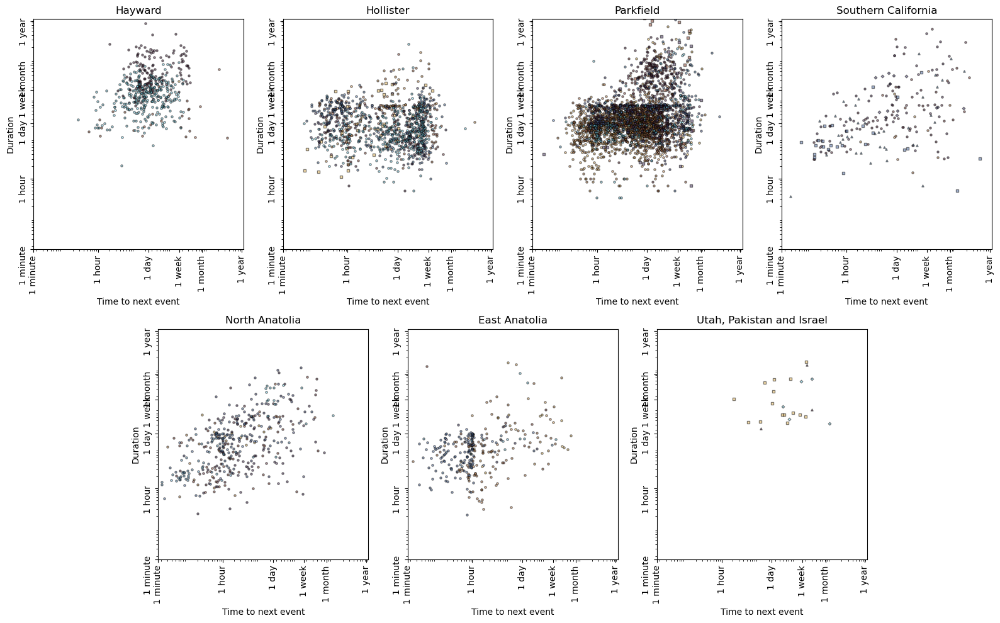

In [27]:
fig = plt.figure(figsize=(16,10))
axa = plt.subplot2grid((4, 8), (0, 0), colspan=2,rowspan=2)
axa.set_title("Hayward")
scatter_points_events_recurance_dur(HAY,df_all,axa,cmap,xticks=True,yticks=True)
axb = plt.subplot2grid((4, 8), (0, 2), colspan=2, rowspan=2)
axb.set_title("Hollister")
scatter_points_events_recurance_dur(HOL,df_all,axb,cmap,xticks=True,yticks=True)  
axc = plt.subplot2grid((4, 8), (0, 4), colspan=2, rowspan=2) 
axc.set_title("Parkfield")
scatter_points_events_recurance_dur(PARK,df_all,axc,cmap,xticks=True,yticks=True) 
axd = plt.subplot2grid((4, 8), (0, 6), colspan=2, rowspan=2)
axd.set_title("Southern California")
scatter_points_events_recurance_dur(SOCAL,df_all,axd,cmap,xticks=True,yticks=True)
axe = plt.subplot2grid((4, 8), (2, 1), colspan=2, rowspan=2) 
axe.set_title("North Anatolia")  
scatter_points_events_recurance_dur(NAF,df_all,axe,cmap,xticks=True,yticks=True)         
axf = plt.subplot2grid((4, 8), (2, 3), colspan=2, rowspan=2) 
axf.set_title("East Anatolia")
scatter_points_events_recurance_dur(EAF,df_all,axf,cmap,xticks=True,yticks=True) 
axg = plt.subplot2grid((4, 8), (2, 5), colspan=2, rowspan=2)
axg.set_title("Utah, Pakistan and Israel")
others = pd.concat([DSF,CHAF,UTA])
scatter_points_events_recurance_dur(others,df_all,axg,cmap,xticks=True,yticks=True) 
fig.tight_layout()
#plt.savefig('../../Creep_catalog_stats_figures/duration_vs_displacement_regions.pdf')
plt.show()

In [28]:
def scatter_points_all(instrument_dataframe,event_dataframe,axis,cmap):
    axis.set_xlabel('Duration')
    axis.set_ylabel('Displacement')
    axis.set_xscale('log')
    axis.set_yscale('log')
    no_networks = np.unique(instrument_dataframe['Network'])

    for i in range(len(no_networks)):
        network = no_networks[i]
        colours  = cmap(np.linspace(0, 1, len(no_networks)))
        #print(abbrv)
        try:
            instrument_df = event_dataframe[event_dataframe['Network'] == network]
            print(f'{network} has {len(instrument_df)} events')

            #print(len(instrument_df))
            displacement = instrument_df['Displacement, mm']
            duration = instrument_df['Duration, hrs']
            dur_med = np.median(duration)
            dur85 = np.percentile(duration,85)
            dur15 = np.percentile(duration,15)
            disp_med = np.median(displacement)
            disp85 = np.percentile(displacement,85)
            disp15 = np.percentile(displacement,15)


            # Asymmetric error bars
            xerr = [[dur_med-dur15], [dur85-dur_med]]
            yerr = [[disp_med-disp15], [disp85-disp_med]]
            
            axis.errorbar(dur_med, disp_med, xerr=xerr, yerr=yerr, fmt='none', ecolor=rgb2hex(colours[i]), alpha=0.5, capsize=3)
            axis.scatter(dur_med,disp_med,s=len(instrument_df),c=rgb2hex(colours[i]),alpha=0.5)
            axis.scatter([],[],c=colours[i],alpha=0.5,label=network)
        

        except IndexError:
            print('no events')


    # First legend (Color & Marker Style) - Automatically created by seaborn/matplotlib
    legend1 = plt.legend(title="Region", loc="upper left", frameon=True)

    # Define representative event counts for the size legend
    size_legend_values = [10, 100, 500, 1000]  # Adjust as needed
    size_legend_labels = [f'{val} Events' for val in size_legend_values]


    # Create properly sized legend markers
    size_legend_handles = [
        axis.scatter([], [], s=size, color='gray', label=label, alpha=0.6, edgecolors='k')
        for size, label in zip(size_legend_values, size_legend_labels)]

    legend2 = plt.legend(
            handles=size_legend_handles, title='Number of Events',
            loc='lower right', frameon=True, labelspacing=1.75, borderpad=1.2, scatterpoints=1
        )
    plt.gca().add_artist(legend2)  # Add the second legend

    # Add both legends
    plt.gca().add_artist(legend1)  # Keep the first legend
    
    # Set custom tick positions
    axis.set_xticks([ 1, 24, 168,720,8760])
    axis.set_yticks([0.01,0.1,1,10])
    axis.set_xticklabels(['1 hour', '1 day', '1 week','1 month','1 year'],fontsize=20,rotation=90)
    axis.set_yticklabels([ r'10$\mu m$', r'100$\mu m$',r'1$mm$',r'10$mm$'],fontsize=20)
    return

CAL has 43 events
CHAF has 4 events
DSF has 16 events
EAF has 328 events
HAY has 486 events
HOL has 1080 events
NAF has 422 events
PARK has 3079 events
RID has 1 events
SOCAL has 230 events
UTA has 6 events


/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/2358877068.py:33: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axis.scatter([],[],c=colours[i],alpha=0.5,label=network)


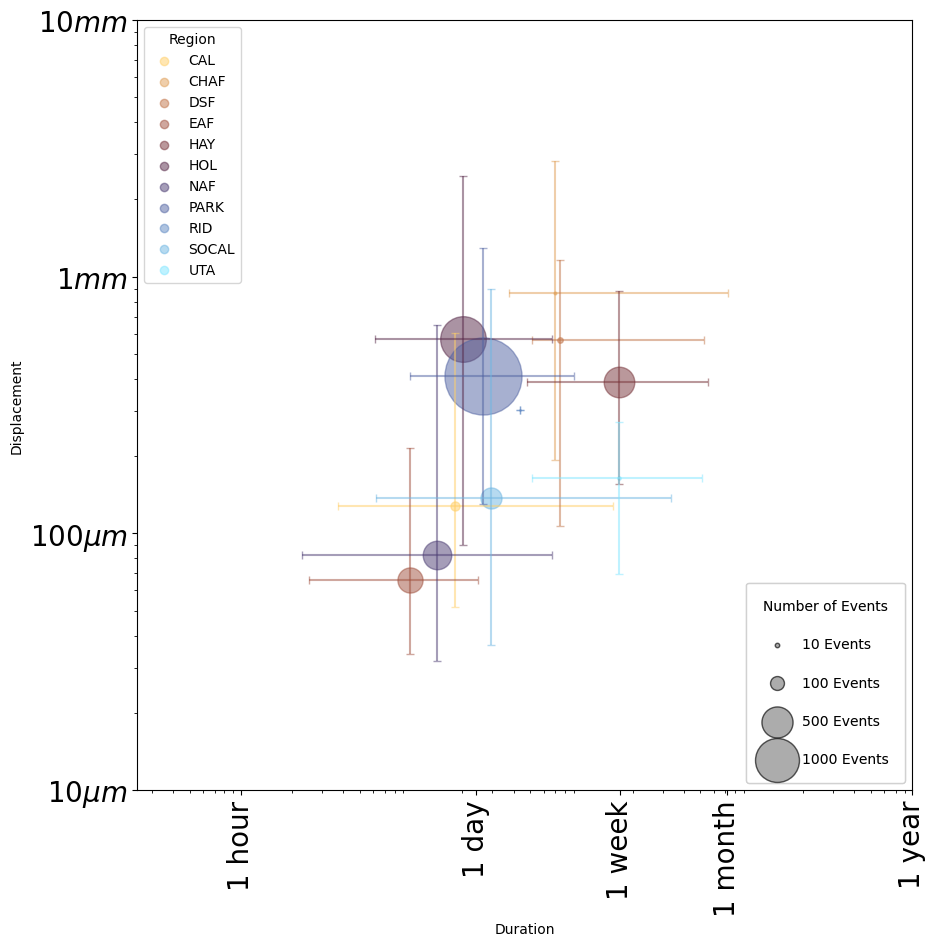

In [29]:
plt.figure(figsize=(10,10))
axa = plt.subplot(1,1,1)
scatter_points_all(creepmeters,df_all,axa,cmap)
plt.show()

In [30]:
HOL

,Unnamed: 0,Network,Creepmeter_abbrv,File_code,Start Time,End Time,"Sampling rate, Hz","Sampling rate, mins",Latitude,Longitude,Length,Depth,Obliquity,Creepmeter_full_name,Fault
0,122,CAL,XSH1,XSH1_1T,2020-10-15T17:01:59.000000Z,2024-10-09T18:37:59.000000Z,0.016667,1T,36.9430,-121.44500,14 m,NaN,41.5,Shore Rd #1,Calaveras Fault
1,91,HOL,SJN1,SJN1_1T,2020-11-25T00:00:59.000000Z,2024-09-17T22:14:59.000000Z,0.016667,1T,36.8546,-121.54673,15 m,NaN,30.0,"San Juan Bautista, Nyland",San Andreas Fault - Hollister
2,123,HOL,XSJ2,XSJ2_10T,1991-02-15T00:00:00.000000Z,2006-07-05T01:30:00.000000Z,0.001667,10T,36.8360,-121.52100,20 m,1 m,30.0,San Juan Bautista #2,San Andreas Fault - Hollister
3,124,HOL,XSJ3,XSJ3_10T,2007-02-15T20:19:59.000000Z,2016-12-08T18:09:59.000000Z,0.001667,10T,36.8360,-121.52100,20 m,NaN,30.0,San Juan Bautista #3,San Andreas Fault - Hollister
4,108,HOL,XHR1,XHR1_10T,1981-09-15T00:00:00.000000Z,1986-12-05T23:50:00.000000Z,0.001667,10T,36.7720,-121.42200,30 m,NaN,22.0,Harris Ranch,San Andreas Fault - Hollister
5,109,HOL,XHR2,XHR2_10T,1991-11-24T00:00:00.000000Z,2005-06-27T04:50:00.000000Z,0.001667,10T,36.7720,-121.42200,30 m,NaN,22.0,Harris Ranch,San Andreas Fault - Hollister
6,110,HOL,XHR3,XHR3_1T,2024-02-28T23:21:00.000000Z,2024-10-09T19:27:00.000000Z,0.016667,1T,36.7720,-121.42200,30 m,NaN,22.0,Harris Ranch,San Andreas Fault - Hollister
7,24,HOL,CWC3,CWC3_10T,1991-11-24T00:00:00.000000Z,2000-12-11T00:00:00.000000Z,0.001667,10T,36.7500,-121.38500,15 cm,NaN,0.0,Cienega Winery Central,San Andreas Fault - Hollister
8,25,HOL,CWN1,CWN1_1T,2020-09-22T13:52:00.000000Z,2023-12-15T13:00:00.000000Z,0.016667,1T,36.7500,-121.38500,15 cm,NaN,0.0,Cienega Winery North,San Andreas Fault - Hollister
9,35,HOL,FCR1,FCR1_1T,2022-06-06T00:01:00.000000Z,2024-03-03T20:03:00.000000Z,0.016667,1T,36.6925,-121.30610,9.1 m,NaN,30.0,Fox Creek,San Andreas Fault - Hollister


Propagation

In [31]:
def directional_distance(point1, point2):
    """
    Returns:
    - total distance (km) using Haversine
    - lat_diff (positive if point2 is north of point1)
    - lon_diff (positive if point2 is east of point1)
    """
    lat1, lon1 = point1
    lat2, lon2 = point2

    # Total great-circle distance
    distance = haversine(point1, point2, unit=Unit.KILOMETERS)

    # Directional components
    lat_diff = lat2 - lat1  # > 0 if point2 is north
    lon_diff = lon2 - lon1  # > 0 if point2 is east
    north_south_distance = distance * (1 if lat_diff > 0 else -1)

    return north_south_distance

In [32]:
#def scatter_points_events_recurance_dur(instrument_dataframe,event_dataframe,axis,cmap,xticks=True,yticks=True):
#scatter_points_events_recurance_dur(HOL,df_all,axb,cmap,xticks=True,yticks=True) 

def propagation_plot(instrument_array, events, network,selected_station):

    NSAF = instrument_array.drop(instrument_array[instrument_array['Network']!=network].index)

    NSAF.drop(NSAF[NSAF['Creepmeter_abbrv']=='CWC3'].index,inplace=True)
    NSAF.reset_index(inplace=True,drop=True)
    #selected_station = 'CWN1'

    index_location = np.where(NSAF['Creepmeter_abbrv']==selected_station)[0][0]
    station_full_name = NSAF['Creepmeter_full_name'].iloc[index_location]


    HOL_events = events.drop(events[events['Network']!=network].index)
    HOL_events = HOL_events.drop(HOL_events[pd.to_datetime(HOL_events['Start Time'])<dt.datetime(1992,1,1)].index)
    HOL_events = HOL_events.drop(HOL_events[pd.to_datetime(HOL_events['Start Time'])>dt.datetime(2024,1,1)].index)
    HOL_events.reset_index(inplace=True,drop=True)
    station_events = HOL_events.drop(HOL_events[HOL_events['Latitude']!=NSAF['Latitude'].iloc[index_location]].index)
    HOL_events = HOL_events.drop(HOL_events[HOL_events['Latitude']==NSAF['Latitude'].iloc[index_location]].index)
    distances=[]
    locs = np.unique(HOL_events['Latitude'])
    station_lat = NSAF['Latitude'].iloc[index_location]
    station_long = NSAF['Longitude'].iloc[index_location]

    plt.figure(figsize=(10,20))
    ax1 = plt.subplot(1,1,1)
    plt.axhline(0, color='gray', linestyle='--')  # zero line
    plt.axvline(0, color='gray', linestyle='--')  # zero line
    plt.xlabel(f'Distance from {station_full_name}, km')
    plt.ylabel(f'Time to closest {station_full_name} event, days')
    
    markers = [
    'o',  # circle
    's',  # square
    '^',  # triangle_up
    'v',  # triangle_down
    '<',  # triangle_left
    '>',  # triangle_right
    'D',  # diamond
    'p',  # pentagon
    '*',  # star
    'h',  # hexagon1
    'X',  # x-filled
    '+',  # plus
]
    


    if network=='PARK':
        station_names = [
                            'Slacks Canyon',
                            'Middle Mtn',
                            'Middle Ridge',
                            'Varian',
                            'Roberson, SW trace',
                            'Parkfield',
                            'Taylor Ranch',
                            'Hearst, SW trace',
                            'Work Ranch',
                            'Carr Ranch',
                            'Gold Hill',
                            'Highway 46, C',
                            'Highway 46, X',
                        ]
    elif network =='HOL':
        station_names = ['Melendy Ranch','Fox Creek','Harris Ranch','San Juan Bautista','Nyland Ranch']






    for i in range(len(locs)):
        event_select = HOL_events.drop(HOL_events[HOL_events['Latitude']!=locs[i]].index)
        lat = np.unique(event_select['Latitude'])
        long = np.unique(event_select['Longitude'])
        distance_km = directional_distance((lat[0],long[0]),(station_lat,station_long))
        distances.append(distance_km)
        A_times = pd.to_datetime(station_events['Start Time']).sort_values().reset_index(drop=True)
        B_times = pd.to_datetime(event_select['Start Time']).sort_values().reset_index(drop=True)

        closest_deltas = []

        for time in A_times:
            deltas = B_times - time  # signed timedeltas
            closest_delta = deltas.iloc[deltas.abs().argmin()]  # closest event signed delta
            days = closest_delta.total_seconds() / (24*60 * 60)  # convert to days (can be negative)
            closest_deltas.append(days)
        plt.scatter([distance_km]*len(closest_deltas),closest_deltas,color='grey',alpha=0.5,marker = markers[i])
        
    distances.append(0)
    distances.sort()

    # Make sure distances is a NumPy array
    distances = np.array(distances)

    # Now filtering and calculations will work
    min_neg = np.floor(np.min(distances[distances < 0]))
    max_pos = np.ceil(np.max(distances[distances > 0]))


    plt.xlim([min_neg, max_pos])



    velocities = [0.25,0.5,1,2,3,4,5,10,20]

    colours  = cmc.batlow_r(np.linspace(0, 1, len(velocities)))
    linestyles = [
        '-',        # solid
        '--',       # dashed
        '-.',       # dash-dot
        ':',        # dotted
        (0, (1, 1)),      # densely dotted
        (0, (5, 1)),      # long dash
        (0, (3, 5, 1, 5)),  # dash-dot-dot
        (0, (5, 10)),     # spaced dash
        (0, (1, 10))      # spaced dot
    ]
    x = np.linspace(np.min(distances),np.max(distances),500)
    for j, v in enumerate(velocities):
        y = x / v
        plt.plot(x, y, label=f'{v} km/h', color=rgb2hex(colours[j]),linestyle=linestyles[j])
        y = x / -v
        plt.plot(x, y, color=rgb2hex(colours[j]),linestyle=linestyles[j])
    plt.ylim([-30,30])


    legend1 = plt.legend(title="Propagation velocity", loc="upper left", frameon=True)

    
    #plt.scatter([],[],color='grey',alpha=0.5,marker = markers[i],label=f'{station_names[i]}')
    plt.show()



    # Create properly sized legend markers
    station_legend_handles = [
        ax1.scatter([], [], color='gray', alpha=0.5, marker=markers[i], label=station_names[i])
        for i in range(len(station_names))
    ]

    legend_stations = ax1.legend(
        handles=station_legend_handles,
        title='Stations',
        loc='lower left',  # change to your preferred location
        frameon=True,
        labelspacing=1.2,
        borderpad=1.0,
        scatterpoints=1
    )
    ax1.add_artist(legend_stations)  # Add the second legend

    # Add both legends
    ax1.add_artist(legend1)  # Keep the first legend
    return





In [33]:
def propagation_plot(instrument_array, events, network, selected_station,velocities,start,end):
    NSAF = instrument_array[instrument_array['Network'] == network].copy()
    NSAF = NSAF[NSAF['Creepmeter_abbrv'] != 'CWC3'].reset_index(drop=True)

    index_location = np.where(NSAF['Creepmeter_abbrv'] == selected_station)[0][0]
    station_full_name = NSAF['Creepmeter_full_name'].iloc[index_location]
    station_lat = NSAF['Latitude'].iloc[index_location]
    station_long = NSAF['Longitude'].iloc[index_location]

    HOL_events = events[events['Network'] == network].copy()
    HOL_events = HOL_events[(pd.to_datetime(HOL_events['Start Time']) >= dt.datetime(start, 1, 1)) &
                            (pd.to_datetime(HOL_events['Start Time']) <= dt.datetime(end, 1, 1))].reset_index(drop=True)

    station_events = HOL_events[HOL_events['Latitude'] == station_lat]
    HOL_events = HOL_events[HOL_events['Latitude'] != station_lat]

    distances = []
    locs = np.unique(HOL_events['Latitude'])

    fig, ax1 = plt.subplots(figsize=(10, 20))

    ax1.axhline(0, color='gray', linestyle='--')
    ax1.axvline(0, color='gray', linestyle='--')
    ax1.set_xlabel(f'Distance from {station_full_name}, km')
    ax1.set_ylabel(f'Time to closest {station_full_name} event, days')

    markers = ['o', 's', '^', 'v', '<', '>', 'D', 'p', '*', 'h', 'X', '+']

    if network == 'PARK':
        station_names = ['Highway 46, X', 'Highway 46, C', 'Gold Hill', 'Carr Ranch',
                            'Work Ranch', 'Hearst, SW trace', 'Taylor Ranch', 'Parkfield',
                            'Roberson, SW trace', 'Varian', 'Middle Ridge', 'Slacks Canyon']
    elif network == 'HOL':
        station_names = ['Melendy Ranch', 'Fox Creek', 'Harris Ranch', 'San Juan Bautista', 'Nyland Ranch']
    elif network == 'HAY':
        station_names = ['Fremont Winery','Hayward Palisades St #2','Oakland Zoo','Temescal',
                        'Pt Pinole']

    for i, lat in enumerate(locs):
        if i >= len(markers):  # prevent index error if more latitudes than markers
            break

        event_select = HOL_events[HOL_events['Latitude'] == lat]
        long = np.unique(event_select['Longitude'])[0]
        distance_km = directional_distance((lat, long), (station_lat, station_long))
        distances.append(distance_km)

        A_times = pd.to_datetime(station_events['Start Time']).sort_values().reset_index(drop=True)
        B_times = pd.to_datetime(event_select['Start Time']).sort_values().reset_index(drop=True)

        closest_deltas = []
        for time in A_times:
            deltas = B_times - time
            closest_delta = deltas.iloc[deltas.abs().argmin()]
            days = closest_delta.total_seconds() / (24 * 60 * 60)
            closest_deltas.append(days)

        ax1.scatter([distance_km] * len(closest_deltas), closest_deltas, color='grey',
                    alpha=0.5, marker=markers[i])
    distances.append(0)
    distances = np.array(distances)
    min_neg = np.floor(np.min(distances[distances < 0]))
    try:
        max_pos = np.ceil(np.max(distances[distances > 0]))
    except ValueError:
        max_pos=1
    ax1.set_xlim([min_neg, max_pos])
    ax1.set_ylim([-30, 30])

    colours = cmc.batlow_r(np.linspace(0, 1, len(velocities)))
    linestyles = ['-', '--', '-.', ':', (0, (1, 1)), (0, (5, 1)),
                  (0, (3, 5, 1, 5)), (0, (5, 10)), (0, (1, 10))]

    x = np.linspace(min_neg, max_pos, 500)
    for j, v in enumerate(velocities):
        y = x / v
        ax1.plot(x, y, label=f'{v} km/h', color=mcolors.to_hex(colours[j]), linestyle=linestyles[j])
        ax1.plot(x, -y, color=mcolors.to_hex(colours[j]), linestyle=linestyles[j])

    # Legends
    # Velocity lines legend
    legend_velocity = ax1.legend(title="Propagation velocity", loc="upper left", frameon=True)

    # Station marker legend (empty scatter for legend only)
    station_handles = [
        ax1.scatter([], [], color='gray', alpha=0.5, marker=markers[i], label=station_names[i])
        for i in range(min(len(station_names), len(markers)))
    ]
    legend_stations = ax1.legend(
        handles=station_handles,
        ncols=5,
        title='Stations',
        loc='lower left',
        frameon=True,
        labelspacing=1.2,
        borderpad=1.0,
        scatterpoints=1
    )
    ax1.add_artist(legend_velocity)
    ax1.add_artist(legend_stations)

    plt.tight_layout()
    plt.show()


In [34]:
velocities = [0.25, 0.5, 1, 2, 3, 4, 5, 10, 20]


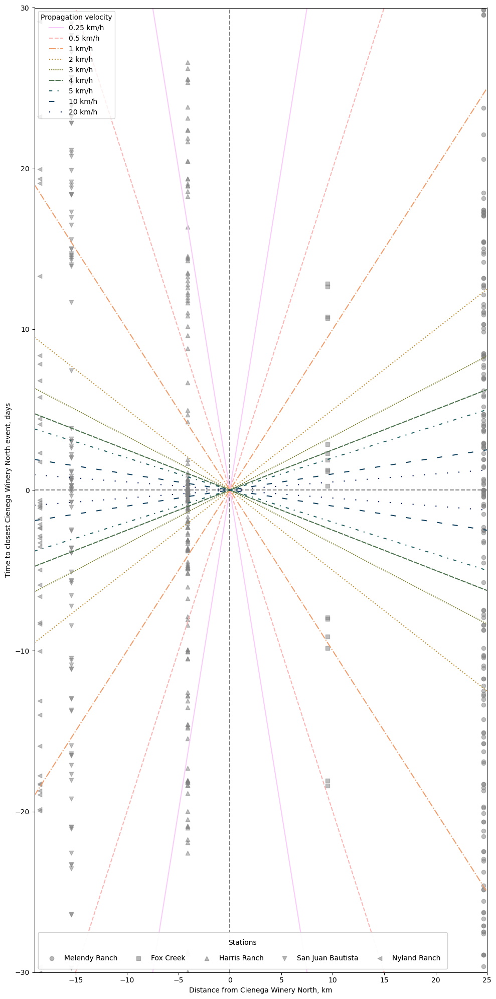

In [35]:
propagation_plot(HOL, df_all, 'HOL','CWN1',velocities,1992,2024)

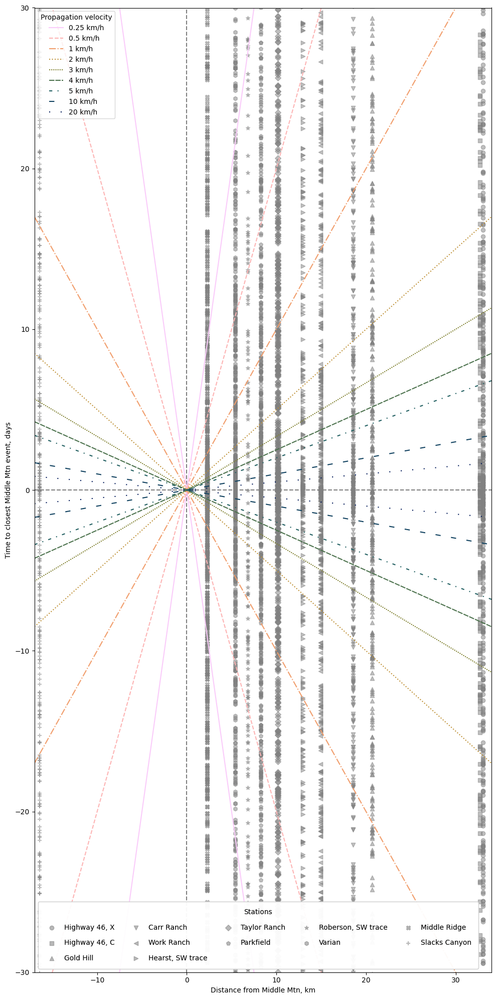

In [36]:
propagation_plot(PARK, df_all, 'PARK','XMM1',velocities,1980,2024)

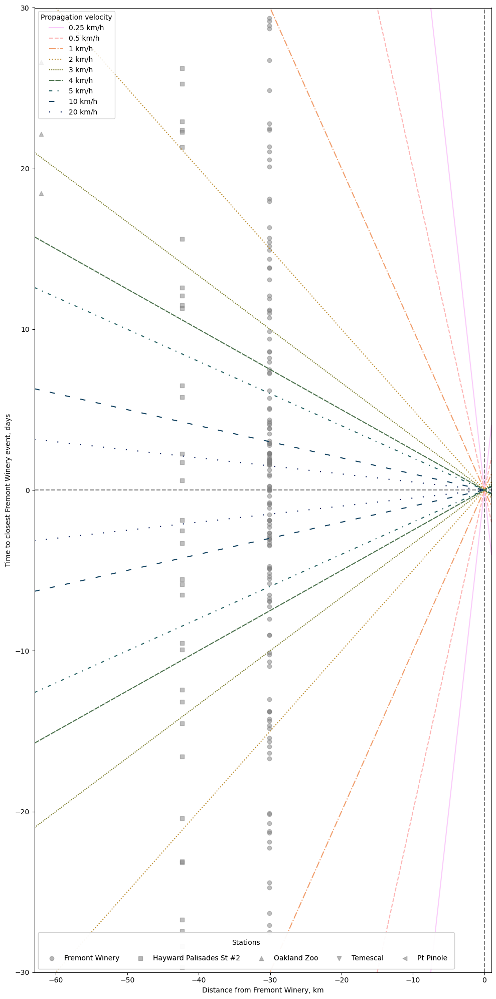

In [37]:
propagation_plot(HAY, df_all, 'HAY','CFW1',velocities,1993,2024)

In [38]:
'Slacks Canyon','Middle Mtn'
2           Middle Ridge
3                 Varian
4     Roberson, SW trace
5           Parkfield #1
7           Taylor Ranch
8       Hearst, SW trace
9             Work Ranch
10            Carr Ranch
11             Gold Hill
12            Highway 46
13            Highway 46
14            Highway 46

SyntaxError: invalid syntax (471043924.py, line 2)

In [39]:
station_names = [
    'Slacks Canyon',
    'Middle Mtn',
    'Middle Ridge',
    'Varian',
    'Roberson, SW trace',
    'Parkfield',
    'Taylor Ranch',
    'Hearst, SW trace',
    'Work Ranch',
    'Carr Ranch',
    'Gold Hill',
    'Highway 46, C',
    'Highway 46, X',
]


Maps

In [395]:
def utm_from_lon(lon):
    """
    utm_from_lon - UTM zone for a longitude

    Not right for some polar regions (Norway, Svalbard, Antartica)

    :param float lon: longitude
    :return: UTM zone number
    :rtype: int
    """
    return floor( ( lon + 180 ) / 6) + 1

def scale_bar(ax, proj, length, location=(0.2, 0.05), linewidth=3,
              units='km', m_per_unit=1000):
    """

    http://stackoverflow.com/a/35705477/1072212
    ax is the axes to draw the scalebar on.
    proj is the projection the axes are in
    location is center of the scalebar in axis coordinates ie. 0.5 is the middle of the plot
    length is the length of the scalebar in km.
    linewidth is the thickness of the scalebar.
    units is the name of the unit
    m_per_unit is the number of meters in a unit
    """
    # find lat/lon center to find best UTM zone
    x0, x1, y0, y1 = ax.get_extent(proj.as_geodetic())
    # Projection in metres
    utm = ccrs.UTM(utm_from_lon((x0+x1)/2))
    # Get the extent of the plotted area in coordinates in metres
    x0, x1, y0, y1 = ax.get_extent(utm)
    # Turn the specified scalebar location into coordinates in metres
    sbcx, sbcy = x0 + (x1 - x0) * location[0], y0 + (y1 - y0) * location[1]
    # Generate the x coordinate for the ends of the scalebar
    bar_xs = [sbcx - length * m_per_unit/2, sbcx + length * m_per_unit/2]
    # buffer for scalebar
    buffer = [pe.withStroke(linewidth=5, foreground="w")]
    # Plot the scalebar with buffer
    ax.plot(bar_xs, [sbcy, sbcy], transform=utm, color='k',
        linewidth=linewidth, path_effects=buffer)
    # buffer for text
    buffer = [pe.withStroke(linewidth=3, foreground="w")]
    # Plot the scalebar label
    t0 = ax.text(sbcx, sbcy, str(length) + ' ' + units, transform=utm,
        horizontalalignment='center', verticalalignment='bottom',
        path_effects=buffer, zorder=2)
    left = x0+(x1-x0)*0.05
    # Plot the N arrow
    t1 = ax.text(left, sbcy, u'\u25B2\nN', transform=utm,
        horizontalalignment='center', verticalalignment='bottom',
        path_effects=buffer, zorder=2)
    # Plot the scalebar without buffer, in case covered by text buffer
    ax.plot(bar_xs, [sbcy, sbcy], transform=utm, color='k',
        linewidth=linewidth, zorder=3)


def cm_plotter(ax,creepmeters_list,gdf,extent,color,shift,scale,show_labels=True):
    ax.set_extent(extent, crs=ccrs.PlateCarree())
    # Add Fault geometries
    ax.add_geometries(gdf.geometry, crs=ccrs.PlateCarree(), edgecolor='black', facecolor="none")
    # Add gridlines with specific label font sizes
    gl = ax.gridlines(draw_labels=show_labels, linewidth=1, color='gray', alpha=0.5, linestyle='--')

    if show_labels:
        gl.xlabel_style = {'size': 20}
        gl.ylabel_style = {'size': 20}

        gl.xformatter = mticker.FormatStrFormatter('%.1f')
        gl.yformatter = mticker.FormatStrFormatter('%.1f')



        # Get the rounded extent values for longitude (x) and latitude (y)
        lon_min, lon_max = np.round(extent[0], 1), np.round(extent[1], 1)
        lat_min, lat_max = np.round(extent[2], 1), np.round(extent[3], 1)

        # Determine a reasonable interval for longitude (x-axis)
        lon_range = abs(lon_max - lon_min)
        if lon_range < 0.5:
            lon_step = 0.1
        elif lon_range <= 1:
            lon_step = 0.2
        elif lon_range <=2:
            lon_step = 0.5
        else:
            lon_step = 1.0

        # Determine a reasonable interval for latitude (y-axis)
        lat_range = abs(lat_max - lat_min)
        if lat_range < 0.5:
            lat_step = 0.1
        elif lat_range <= 1:
            lat_step = 0.2
        elif lat_range <=2:
            lat_step = 0.5
        else:
            lat_step = 1.0

        # Apply MultipleLocator to both axes
        gl.xlocator = mticker.MultipleLocator(lon_step)
        gl.ylocator = mticker.MultipleLocator(lat_step)

    else:
        gl.xlabels_top = False
        gl.xlabels_bottom = False
        gl.ylabels_left = False
        gl.ylabels_right = False

    # Add annotation with an arrow and transform
    for i in range(len(creepmeters_list)):
        abbrv = creepmeters_list['Creepmeter_abbrv'].iloc[i]
        lat = creepmeters_list['Latitude'].iloc[i]
        long = creepmeters_list['Longitude'].iloc[i]
        face_color = rgb2hex(color[i])
        # Default xytext offset
        if shift == 'horizontal':
            # Adjust xytext for specific creepmeter abbreviations
            if abbrv in ['XRSW', 'XTA1','XHSW', 'C461','CWN1','CRR1','XMM1','XSJ3','XHR2','QE30','NS45','DU30','RA','GS','XMR1','CFW1']:
                xytext_lon = long - 0.1  # Subtract 0.1 for these specific abbreviations
            else:
                xytext_lon = long + 0.1
            if abbrv in ['CPP1','CWC3','CWN1','XSJ2']:
                xytext_lat = lat-0.01
            elif abbrv in ['X461','XPK2']:
                xytext_lat = lat-0.02
            elif abbrv in ['XRSW']:
                xytext_lat = lat+0.01

            else:
                xytext_lat = lat
        if shift == 'vertical':
            if abbrv in ['NS45','COLW']:
                xytext_lon = long 
                xytext_lat = lat + 0.2
            elif abbrv in ['SH30']:
                xytext_lon = long + 0.2
                xytext_lat = lat
            elif abbrv in ['EASH']:
                xytext_lon = long + 0.3
                xytext_lat = lat - 0.2
            elif abbrv in ['DU30']:
                xytext_lon = long + 0.3
                xytext_lat = lat + 0.2
            elif abbrv in ['QW30']:
                xytext_lon = long - 0.1
                xytext_lat = lat + 0.2
            elif abbrv in ['QE30']:
                xytext_lon = long - 0.1
                xytext_lat = lat - 0.2
            elif abbrv in ['SC30']:
                xytext_lon = long + 0.1
                xytext_lat = lat + 0.2
            else:
                xytext_lon = long 
                xytext_lat = lat - 0.2
        
        
        
        ax.annotate(
            creepmeters_list['Creepmeter_abbrv'].iloc[i], 
            xy=(creepmeters_list['Longitude'].iloc[i], creepmeters_list['Latitude'].iloc[i]),
            xytext=(xytext_lon, xytext_lat), 
            arrowprops=dict(facecolor=face_color, edgecolor = face_color, arrowstyle='->', lw=3),
            bbox=dict(boxstyle='round,pad=0.3', edgecolor=face_color, facecolor='lightgrey'),
            fontsize=14, ha='center', va='center',
            transform=ccrs.PlateCarree()  # Make sure coordinates are correct
        )
        # Scatter points for creepmeters
        ax.scatter(
            creepmeters_list['Longitude'].iloc[i], 
            creepmeters_list['Latitude'].iloc[i], 
            color=face_color, 
            edgecolor='black', 
            s=100, 
            zorder=100, 
            transform=ccrs.Geodetic()
        )
        scale_bar(ax, ccrs.PlateCarree(), scale)
    return





def ymd_to_ydec(ST):
    y = int(ST.strftime("%Y"))
    dt_starter = dt.datetime(y,1,1,0,0,0)
    diff = (ST.replace(tzinfo=None)-dt_starter)/dt.timedelta(days=1)
    isleapyear = calendar.isleap(y)
    if isleapyear == True:
        diff_dec = diff/366
    else:
        diff_dec = diff/365
    date_dec = y+diff_dec
    return date_dec


    

In [396]:
def mapsubplot(axis,extent,cmap,instrument_dataframe,faults,scale,shift):
    colours  = cmap(np.linspace(0, 1, len(instrument_dataframe)))
    # Initialize OpenStreetMap tiles
    osm = img_tiles.OSM()
    # Add OpenStreetMap tiles to the plot
    axis.add_image(osm, 10)  # Zoom level of 8  
    # Add natural earth features for oceans and lakes
    ocean = cfeature.NaturalEarthFeature('physical', 'ocean', '50m',
                                            edgecolor='face', facecolor='lightblue')
    lakes = cfeature.NaturalEarthFeature('physical', 'lakes', '50m',
                                            edgecolor='face', facecolor='lightblue')
    # Add the land with pale sage green color
    pale_sage_green = '#D0E8D0'  # Very pale sage green color
    land = cfeature.NaturalEarthFeature('physical', 'land', '50m',
                                        edgecolor='face', facecolor=pale_sage_green)

    # Add the features to the map
    axis.add_feature(ocean, zorder=0)  # Add oceans first
    axis.add_feature(lakes, zorder=1)  # Add lakes
    axis.add_feature(land, zorder=0)   # Add land with pale sage green

    # Add coastlines and other features if desired
    axis.coastlines(resolution='50m')
    cm_plotter(axis,instrument_dataframe,faults,extent,colours,shift,scale)
    return

In [397]:
import warnings

# Suppress specific warning
warnings.filterwarnings("ignore", message="Approximating coordinate system")

hollister_extent = [-121.65,-121.15,36.5,37.0]
hayward_extent = [-122.42,-121.92,37.5,38]
parkfield_extent = [-120.65,-120.1,35.55,36.1]
salton_sea_extent = [-117.25,-115.25,32.2,34.2]
RID_extent = [-117.8,-117.2, 35.2,35.8]




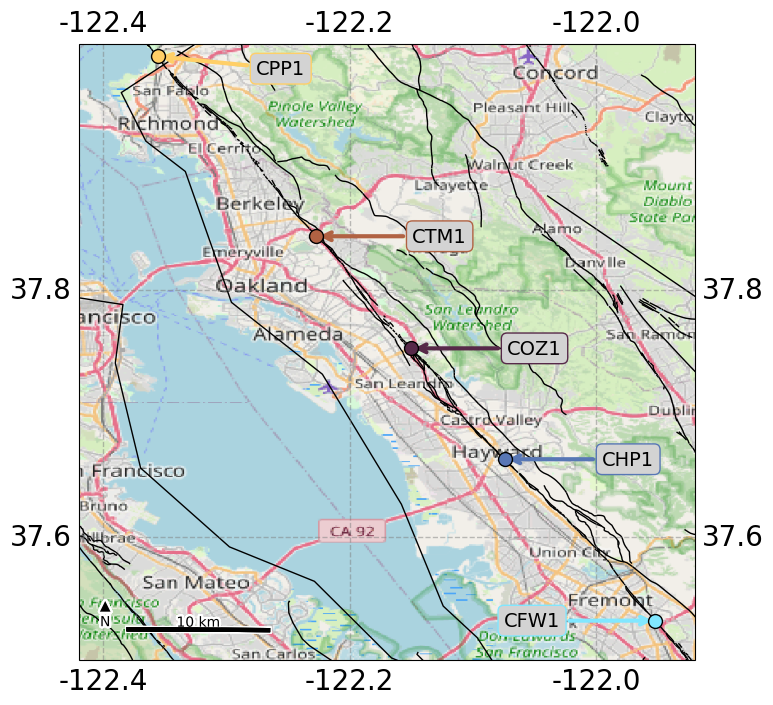

In [120]:
fig = plt.figure(figsize=(20,8))
axa = plt.subplot(1,1,1,projection=ccrs.PlateCarree())
mapsubplot(axa,hayward_extent,cmap,HAY,gdf_Cali,10,'horizontal')
plt.savefig('../../Creep_catalog_stats_figures/New Plots/Hayward_map.pdf')
plt.show()

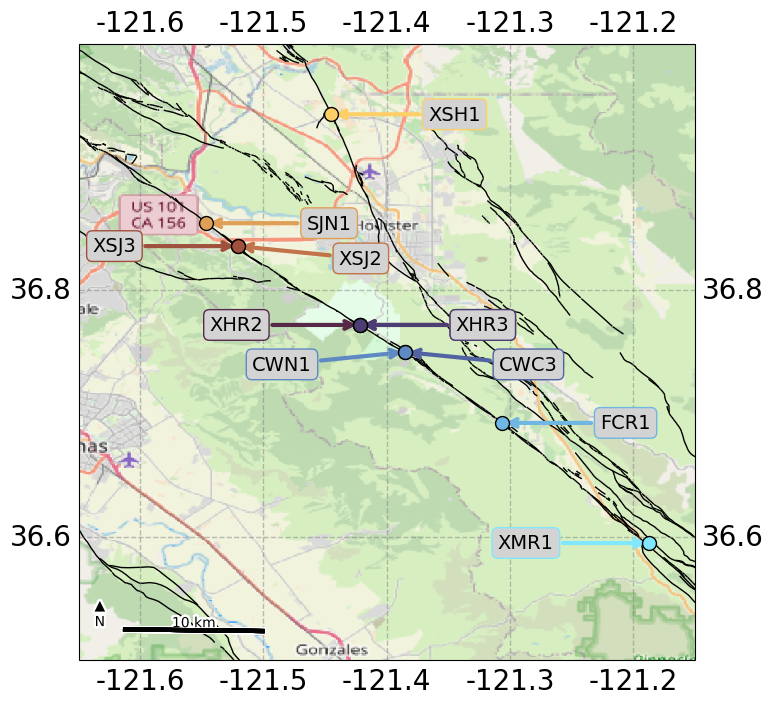

In [121]:
fig = plt.figure(figsize=(20,8))
axb = plt.subplot(1,1,1,projection=ccrs.PlateCarree())
mapsubplot(axb,hollister_extent,cmap,HOL,gdf_Cali,10,'horizontal')
plt.savefig('../../Creep_catalog_stats_figures/New Plots/Hollister_map.pdf')
plt.show()



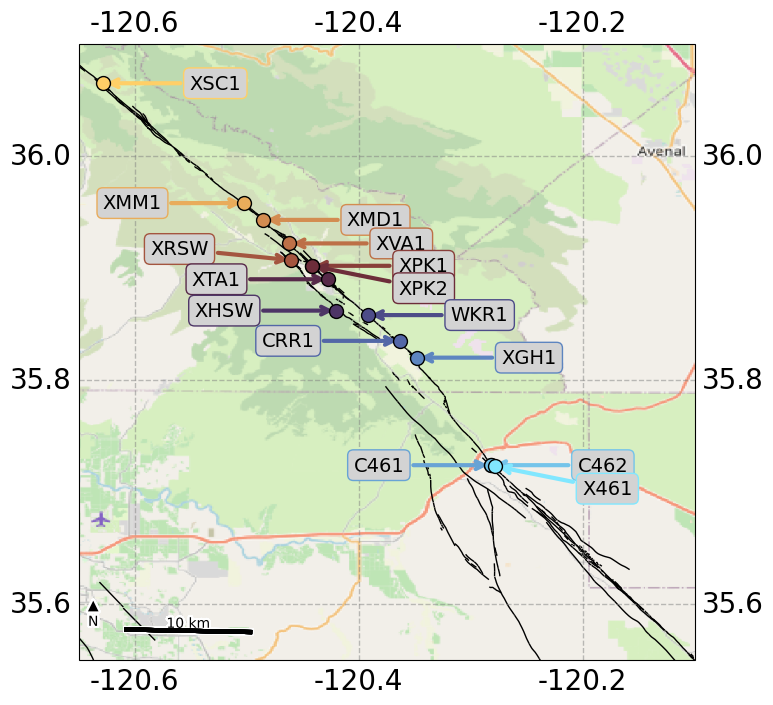

In [126]:
fig = plt.figure(figsize=(20,8))
axc = plt.subplot(1,1,1,projection=ccrs.PlateCarree())
mapsubplot(axc,parkfield_extent,cmap,PARK,gdf_Cali,10,'horizontal')
plt.savefig('../../Creep_catalog_stats_figures/New Plots/Parkfield_map.pdf')
plt.show()


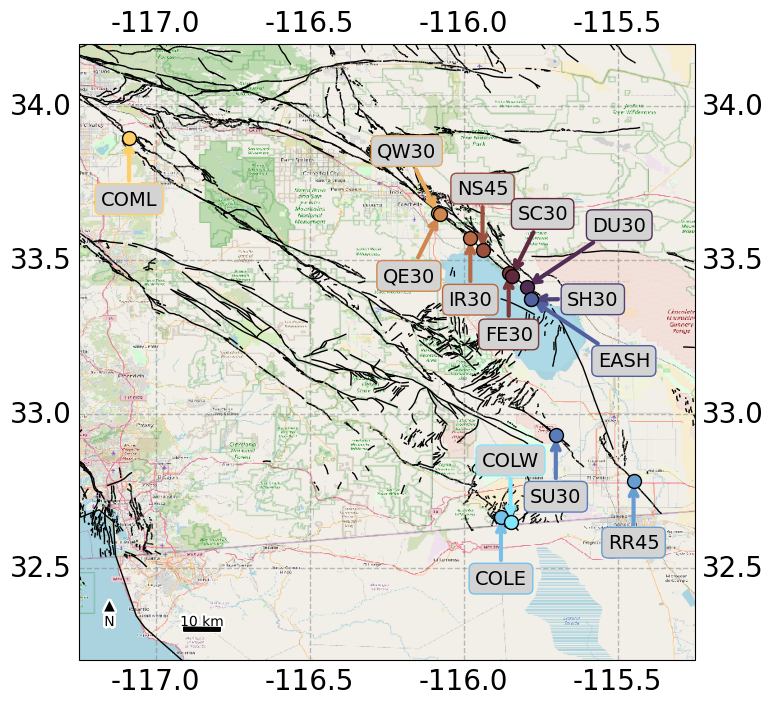

In [145]:
fig = plt.figure(figsize=(20,8))
axd = plt.subplot(1,1,1,projection=ccrs.PlateCarree())
mapsubplot(axd,salton_sea_extent,cmap,SOCAL,gdf_Cali,10,'vertical')
plt.savefig('../../Creep_catalog_stats_figures/New Plots/SOCAL_map.pdf')
plt.show()

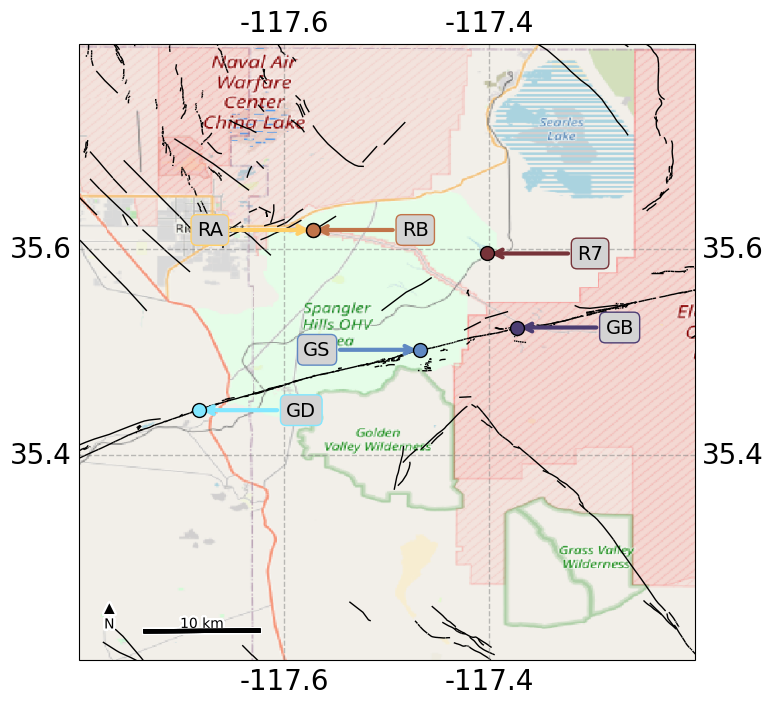

In [146]:
fig = plt.figure(figsize=(20,8))
axe = plt.subplot(1,1,1,projection=ccrs.PlateCarree())
mapsubplot(axe,RID_extent,cmap,RID,gdf_Cali,10,'horizontal')
plt.savefig('../../Creep_catalog_stats_figures/New Plots/Ridgecrest_map.pdf')
plt.show()

In [398]:
def NAF_map(axa,NAF_extent,gdf_Asia,NAF,cmap,show_labels=True):
    osm = img_tiles.OSM()
    axa.add_image(osm, 8)  # Zoom level of 8 
    ocean = cfeature.NaturalEarthFeature('physical', 'ocean', '50m',
                                            edgecolor='face', facecolor='lightblue')
    lakes = cfeature.NaturalEarthFeature('physical', 'lakes', '50m',
                                            edgecolor='face', facecolor='lightblue')
    # Add the land with pale sage green color
    pale_sage_green = '#D0E8D0'  # Very pale sage green color
    land = cfeature.NaturalEarthFeature('physical', 'land', '50m',
                                        edgecolor='face', facecolor=pale_sage_green)

    # Add the features to the map
    axa.add_feature(ocean, zorder=0)  # Add oceans first
    axa.add_feature(lakes, zorder=1)  # Add lakes
    axa.add_feature(land, zorder=0)   # Add land with pale sage green

    # Add coastlines and other features if desired
    axa.coastlines(resolution='50m')
    axa.set_extent(NAF_extent, crs=ccrs.PlateCarree())
    axa.add_geometries(gdf_Asia.geometry, crs=ccrs.PlateCarree(), edgecolor='black', facecolor="none")
    gl = axa.gridlines(draw_labels=show_labels, linewidth=1, color='gray', alpha=0.5, linestyle='--')

    if show_labels:
        gl.xlabel_style = {'size': 20}
        gl.ylabel_style = {'size': 20}

        gl.xformatter = mticker.FormatStrFormatter('%.1f')
        gl.yformatter = mticker.FormatStrFormatter('%.1f')

        # Get the rounded extent values for longitude (x) and latitude (y)
        lon_min, lon_max = np.round(NAF_extent[0], 1), np.round(NAF_extent[1], 1)
        lat_min, lat_max = np.round(NAF_extent[2], 1), np.round(NAF_extent[3], 1)

        # Determine a reasonable interval for longitude (x-axis)
        lon_range = abs(lon_max - lon_min)
        if lon_range <= 0.5:
            lon_step = 0.1
        elif lon_range <= 1:
            lon_step = 0.2
        elif lon_range <=2:
            lon_step = 0.5
        else:
            lon_step = 1.0

        # Determine a reasonable interval for latitude (y-axis)
        lat_range = abs(lat_max - lat_min)
        if lat_range <= 0.5:
            lat_step = 0.1
        elif lat_range <= 1:
            lat_step = 0.2
        elif lat_range <=2:
            lat_step = 0.5
        else:
            lat_step = 1.0

        # Apply MultipleLocator to both axes
        gl.xlocator = mticker.MultipleLocator(lon_step)
        gl.ylocator = mticker.MultipleLocator(lat_step)

    else:
        gl.xlabels_top = False
        gl.xlabels_bottom = False
        gl.ylabels_left = False
        gl.ylabels_right = False

    
    shift='vertical'
    colours  = cmap(np.linspace(0, 1, len(NAF)))

    for i in range(len(NAF)):
        face_color = rgb2hex(colours[i])
        # Default xytext offset
        if shift == 'vertical':
            xytext_lon = NAF['Longitude'].iloc[i] 
            xytext_lat = NAF['Latitude'].iloc[i]+0.1
            if NAF['Creepmeter_abbrv'].iloc[i] in ['TEP1']:
                xytext_lon = NAF['Longitude'].iloc[i]
                xytext_lat = NAF['Latitude'].iloc[i]-0.1
            if NAF['Creepmeter_abbrv'].iloc[i] in ['CER1']:
                xytext_lon = NAF['Longitude'].iloc[i]+0.15
                xytext_lat = NAF['Latitude'].iloc[i]
            if NAF['Creepmeter_abbrv'].iloc[i] in ['HAM1']:
                xytext_lon = NAF['Longitude'].iloc[i]+0.3
                xytext_lat = NAF['Latitude'].iloc[i]+0.1
            if NAF['Creepmeter_abbrv'].iloc[i] in ['CHE1']:
                xytext_lon = NAF['Longitude'].iloc[i]+0.15
                xytext_lat = NAF['Latitude'].iloc[i]+0.1
            if NAF['Creepmeter_abbrv'].iloc[i] in ['PET1']:
                xytext_lon = NAF['Longitude'].iloc[i]-0.3
                xytext_lat = NAF['Latitude'].iloc[i]+0.1
            if NAF['Creepmeter_abbrv'].iloc[i] in ['WSZ1']:
                xytext_lon = NAF['Longitude'].iloc[i]-0.1
                xytext_lat = NAF['Latitude'].iloc[i]-0.1
            if NAF['Creepmeter_abbrv'].iloc[i] in ['ISW1']:
                xytext_lon = NAF['Longitude'].iloc[i]+0.1
                xytext_lat = NAF['Latitude'].iloc[i]-0.1
            if NAF['Creepmeter_abbrv'].iloc[i] in ['ESZ1']:
                xytext_lon = NAF['Longitude'].iloc[i]-0.15
                xytext_lat = NAF['Latitude'].iloc[i]+0.1
            if NAF['Creepmeter_abbrv'].iloc[i] in ['INW1']:
                xytext_lon = NAF['Longitude'].iloc[i]
                xytext_lat = NAF['Latitude'].iloc[i]+0.1
            
        
        axa.annotate(
            NAF['Creepmeter_abbrv'].iloc[i], 
            xy=(NAF['Longitude'].iloc[i], NAF['Latitude'].iloc[i]),
            xytext=(xytext_lon, xytext_lat), 
            arrowprops=dict(facecolor=face_color, edgecolor = face_color, arrowstyle='->', lw=3),
            bbox=dict(boxstyle='round,pad=0.3', edgecolor=face_color, facecolor='lightgrey'),
            fontsize=14, ha='center', va='center',
            transform=ccrs.PlateCarree()  # Make sure coordinates are correct
        )
        # Scatter points for creepmeters
        axa.scatter(
            NAF['Longitude'].iloc[i], 
            NAF['Latitude'].iloc[i], 
            color=face_color, 
            edgecolor='black', 
            s=100, 
            zorder=100, 
            transform=ccrs.Geodetic()
        )
    scale_bar(axa, ccrs.PlateCarree(), 10)
    return

In [399]:
def EAF_map(axa,EAF_extent,gdf_Asia,EAF,cmap,show_labels=True):
    # Initialize OpenStreetMap tiles
    osm = img_tiles.OSM()

    # Add OpenStreetMap tiles to the plot
    axa.add_image(osm, 10)  # Zoom level of 8 

    osm = img_tiles.OSM()
    axa.add_image(osm, 8)  # Zoom level of 8 
    ocean = cfeature.NaturalEarthFeature('physical', 'ocean', '50m',
                                            edgecolor='face', facecolor='lightblue')
    lakes = cfeature.NaturalEarthFeature('physical', 'lakes', '50m',
                                            edgecolor='face', facecolor='lightblue')
    # Add the land with pale sage green color
    pale_sage_green = '#D0E8D0'  # Very pale sage green color
    land = cfeature.NaturalEarthFeature('physical', 'land', '50m',
                                        edgecolor='face', facecolor=pale_sage_green)

    # Add the features to the map
    axa.add_feature(ocean, zorder=0)  # Add oceans first
    axa.add_feature(lakes, zorder=1)  # Add lakes
    axa.add_feature(land, zorder=0)   # Add land with pale sage green

    # Add coastlines and other features if desired
    axa.coastlines(resolution='50m')

    axa.set_extent(EAF_extent, crs=ccrs.PlateCarree())
    axa.add_geometries(gdf_Asia.geometry, crs=ccrs.PlateCarree(), edgecolor='black', facecolor="none")
    gl = axa.gridlines(draw_labels=show_labels, linewidth=1, color='gray', alpha=0.5, linestyle='--')

    if show_labels:
        gl.xlabel_style = {'size': 20}
        gl.ylabel_style = {'size': 20}

        gl.xformatter = mticker.FormatStrFormatter('%.1f')
        gl.yformatter = mticker.FormatStrFormatter('%.1f')

        # Get the rounded extent values for longitude (x) and latitude (y)
        lon_min, lon_max = np.round(EAF_extent[0], 1), np.round(EAF_extent[1], 1)
        lat_min, lat_max = np.round(EAF_extent[2], 1), np.round(EAF_extent[3], 1)

        # Determine a reasonable interval for longitude (x-axis)
        lon_range = abs(lon_max - lon_min)
        if lon_range <= 0.5:
            lon_step = 0.1
        elif lon_range <= 1:
            lon_step = 0.2
        elif lon_range <=2:
            lon_step = 0.5
        else:
            lon_step = 1.0

        # Determine a reasonable interval for latitude (y-axis)
        lat_range = abs(lat_max - lat_min)
        if lat_range <= 0.5:
            lat_step = 0.1
        elif lat_range <= 1:
            lat_step = 0.2
        elif lat_range <=2:
            lat_step = 0.5
        else:
            lat_step = 1.0

        # Apply MultipleLocator to both axes
        gl.xlocator = mticker.MultipleLocator(lon_step)
        gl.ylocator = mticker.MultipleLocator(lat_step)

    else:
        gl.xlabels_top = False
        gl.xlabels_bottom = False
        gl.ylabels_left = False
        gl.ylabels_right = False


    shift='vertical'
    colours  = cmap(np.linspace(0, 1, len(EAF)))


    for i in range(len(EAF)):
        face_color = rgb2hex(colours[i])
        # Default xytext offset
        if shift == 'horizontal':
            # Adjust xytext for specific creepmeter abbreviations
            if EAF['Creepmeter_abbrv'].iloc[i] in ['XRSW', 'XTA1','XHSW', 'C461','CWN1/CWC3','CRR1','XMM1','QW30','SC30/72/TE']:
                xytext_lon = EAF['Longitude'].iloc[i] - 0.1  # Subtract 0.1 for these specific abbreviations
            else:
                xytext_lon = EAF['Longitude'].iloc[i] + 0.1
            xytext_lat = EAF['Latitude'].iloc[i]
        if shift == 'vertical':
            xytext_lon = EAF['Longitude'].iloc[i] 
            xytext_lat = EAF['Latitude'].iloc[i] + 0.2
            if EAF['Creepmeter_abbrv'].iloc[i] in ['TAS1']:
                xytext_lon = EAF['Longitude'].iloc[i]+0.3
                xytext_lat = EAF['Latitude'].iloc[i]
            if EAF['Creepmeter_abbrv'].iloc[i] in ['YZW1','BAL1']:
                xytext_lon = EAF['Longitude'].iloc[i]
                xytext_lat = EAF['Latitude'].iloc[i]-0.3
            if EAF['Creepmeter_abbrv'].iloc[i] in ['YZE1']:
                xytext_lon = EAF['Longitude'].iloc[i]+0.2
                xytext_lat = EAF['Latitude'].iloc[i]-0.2
            if EAF['Creepmeter_abbrv'].iloc[i] in ['PAS1']:
                xytext_lon = EAF['Longitude'].iloc[i] 
                xytext_lat = EAF['Latitude'].iloc[i] - 0.2
        
        
        axa.annotate(
            EAF['Creepmeter_abbrv'].iloc[i], 
            xy=(EAF['Longitude'].iloc[i], EAF['Latitude'].iloc[i]),
            xytext=(xytext_lon, xytext_lat), 
            arrowprops=dict(facecolor=face_color, edgecolor = face_color, arrowstyle='->', lw=3),
            bbox=dict(boxstyle='round,pad=0.3', edgecolor=face_color, facecolor='lightgrey'),
            fontsize=14, ha='center', va='center',
            transform=ccrs.PlateCarree()  # Make sure coordinates are correct
        )
        # Scatter points for creepmeters
        axa.scatter(
            EAF['Longitude'].iloc[i], 
            EAF['Latitude'].iloc[i], 
            color=face_color, 
            edgecolor='black', 
            s=100, 
            zorder=100, 
            transform=ccrs.Geodetic()
        )
    scale_bar(axa, ccrs.PlateCarree(), 10)
    return

In [400]:
def NAF_map_Zoom(axa,NAF_extent,gdf_Asia,NAF,cmap,show_labels=True):
    osm = img_tiles.OSM()
    axa.add_image(osm, 8)  # Zoom level of 8 
    ocean = cfeature.NaturalEarthFeature('physical', 'ocean', '50m',
                                            edgecolor='face', facecolor='lightblue')
    lakes = cfeature.NaturalEarthFeature('physical', 'lakes', '50m',
                                            edgecolor='face', facecolor='lightblue')
    # Add the land with pale sage green color
    pale_sage_green = '#D0E8D0'  # Very pale sage green color
    land = cfeature.NaturalEarthFeature('physical', 'land', '50m',
                                        edgecolor='face', facecolor=pale_sage_green)

    # Add the features to the map
    axa.add_feature(ocean, zorder=0)  # Add oceans first
    axa.add_feature(lakes, zorder=1)  # Add lakes
    axa.add_feature(land, zorder=0)   # Add land with pale sage green

    # Add coastlines and other features if desired
    axa.coastlines(resolution='50m')
    axa.set_extent(NAF_extent, crs=ccrs.PlateCarree())
    axa.add_geometries(gdf_Asia.geometry, crs=ccrs.PlateCarree(), edgecolor='black', facecolor="none")
    gl = axa.gridlines(draw_labels=show_labels, linewidth=1, color='gray', alpha=0.5, linestyle='--')

    if show_labels:
        gl.xlabel_style = {'size': 20}
        gl.ylabel_style = {'size': 20}

        gl.xformatter = mticker.FormatStrFormatter('%.1f')
        gl.yformatter = mticker.FormatStrFormatter('%.1f')

        # Get the rounded extent values for longitude (x) and latitude (y)
        lon_min, lon_max = np.round(NAF_extent[0], 1), np.round(NAF_extent[1], 1)
        lat_min, lat_max = np.round(NAF_extent[2], 1), np.round(NAF_extent[3], 1)

        # Determine a reasonable interval for longitude (x-axis)
        lon_range = abs(lon_max - lon_min)
        if lon_range <= 0.5:
            lon_step = 0.1
        elif lon_range <= 1:
            lon_step = 0.2
        elif lon_range <=2:
            lon_step = 0.5
        else:
            lon_step = 1.0

        # Determine a reasonable interval for latitude (y-axis)
        lat_range = abs(lat_max - lat_min)
        if lat_range <= 0.5:
            lat_step = 0.1
        elif lat_range <= 1:
            lat_step = 0.2
        elif lat_range <=2:
            lat_step = 0.5
        else:
            lat_step = 1.0

        # Apply MultipleLocator to both axes
        gl.xlocator = mticker.MultipleLocator(lon_step)
        gl.ylocator = mticker.MultipleLocator(lat_step)

    else:
        gl.xlabels_top = False
        gl.xlabels_bottom = False
        gl.ylabels_left = False
        gl.ylabels_right = False

    
    shift='vertical'
    colours  = cmap(np.linspace(0, 1, len(NAF)+2))

    for i in range(len(NAF)):
        face_color = rgb2hex(colours[i+2])
        # Default xytext offset
        if shift == 'vertical':
            xytext_lon = NAF['Longitude'].iloc[i] 
            xytext_lat = NAF['Latitude'].iloc[i]+0.1
            if NAF['Creepmeter_abbrv'].iloc[i] in ['TEP1']:
                xytext_lon = NAF['Longitude'].iloc[i]
                xytext_lat = NAF['Latitude'].iloc[i]-0.1
            if NAF['Creepmeter_abbrv'].iloc[i] in ['CER1']:
                xytext_lon = NAF['Longitude'].iloc[i]+0.15
                xytext_lat = NAF['Latitude'].iloc[i]
            if NAF['Creepmeter_abbrv'].iloc[i] in ['HAM1']:
                xytext_lon = NAF['Longitude'].iloc[i]+0.3
                xytext_lat = NAF['Latitude'].iloc[i]+0.1
            if NAF['Creepmeter_abbrv'].iloc[i] in ['CHE1']:
                xytext_lon = NAF['Longitude'].iloc[i]+0.15
                xytext_lat = NAF['Latitude'].iloc[i]+0.1
            if NAF['Creepmeter_abbrv'].iloc[i] in ['PET1']:
                xytext_lon = NAF['Longitude'].iloc[i]-0.3
                xytext_lat = NAF['Latitude'].iloc[i]+0.1
            if NAF['Creepmeter_abbrv'].iloc[i] in ['WSZ1']:
                xytext_lon = NAF['Longitude'].iloc[i]-0.1
                xytext_lat = NAF['Latitude'].iloc[i]-0.1
            if NAF['Creepmeter_abbrv'].iloc[i] in ['ISW1']:
                xytext_lon = NAF['Longitude'].iloc[i]+0.1
                xytext_lat = NAF['Latitude'].iloc[i]-0.1
            if NAF['Creepmeter_abbrv'].iloc[i] in ['ESZ1']:
                xytext_lon = NAF['Longitude'].iloc[i]-0.15
                xytext_lat = NAF['Latitude'].iloc[i]+0.1
            if NAF['Creepmeter_abbrv'].iloc[i] in ['INW1']:
                xytext_lon = NAF['Longitude'].iloc[i]
                xytext_lat = NAF['Latitude'].iloc[i]+0.1
            
        
        axa.annotate(
            NAF['Creepmeter_abbrv'].iloc[i], 
            xy=(NAF['Longitude'].iloc[i], NAF['Latitude'].iloc[i]),
            xytext=(xytext_lon, xytext_lat), 
            arrowprops=dict(facecolor=face_color, edgecolor = face_color, arrowstyle='->', lw=3),
            bbox=dict(boxstyle='round,pad=0.3', edgecolor=face_color, facecolor='lightgrey'),
            fontsize=14, ha='center', va='center',
            transform=ccrs.PlateCarree()  # Make sure coordinates are correct
        )
        # Scatter points for creepmeters
        axa.scatter(
            NAF['Longitude'].iloc[i], 
            NAF['Latitude'].iloc[i], 
            color=face_color, 
            edgecolor='black', 
            s=100, 
            zorder=100, 
            transform=ccrs.Geodetic()
        )
    scale_bar(axa, ccrs.PlateCarree(), 10)
    return

In [401]:
pakistan_extent = [61, 78, 23, 38]
EAF_extent = [36.0, 40.25, 36.0, 39]
NAF_extent = [29.5,33.1,40.4,41.1]
UTA_extent = [-114.2,-108.5, 36.8,42.2]
turkey_extent = [26.0, 45.0, 36.0, 42.0]
NAF_zoom_extent = [31.9,33.1,40.5,41.1]

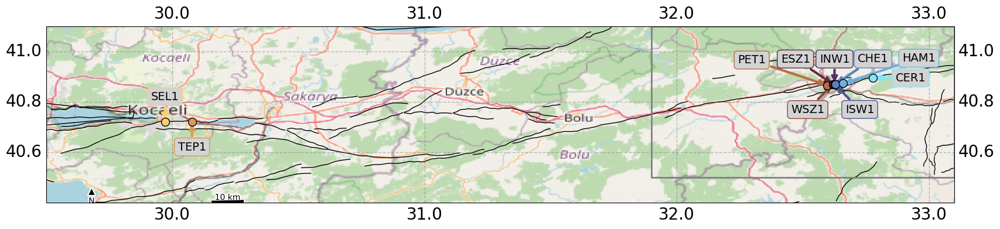

In [402]:
plt.figure(figsize=(20,8))
axa = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
NAF_map(axa,NAF_extent,gdf_Asia,NAF,cmap)
bbox = box(NAF_zoom_extent[0], NAF_zoom_extent[2], NAF_zoom_extent[1], NAF_zoom_extent[3])
axa.add_geometries([bbox], ccrs.PlateCarree(), edgecolor='grey', facecolor='none', linestyle='-', linewidth=2)
plt.savefig('../../Creep_catalog_stats_figures/New Plots/NAF_map.pdf')
plt.show()

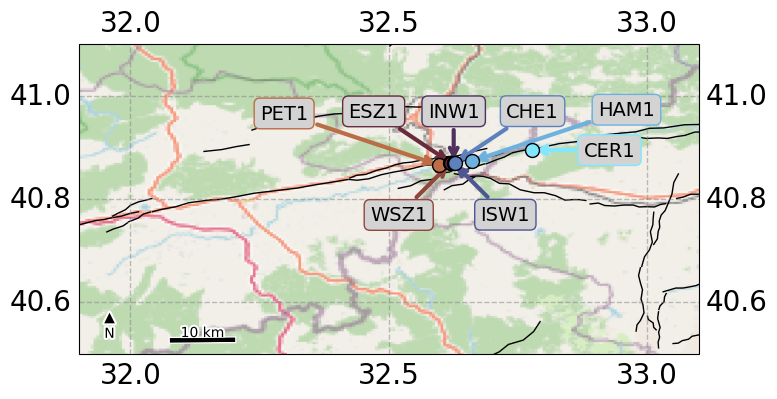

In [403]:

NAF_ZOOM = NAF.copy(deep=True)
NAF_ZOOM.drop(NAF_ZOOM[NAF_ZOOM['Creepmeter_abbrv']=='SEL1'].index,inplace=True)
NAF_ZOOM.drop(NAF_ZOOM[NAF_ZOOM['Creepmeter_abbrv']=='TEP1'].index,inplace=True)
NAF_ZOOM.reset_index(inplace=True,drop=True)
plt.figure(figsize=(8,8))
axa = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
NAF_map_Zoom(axa,NAF_zoom_extent,gdf_Asia,NAF_ZOOM,cmap)
plt.savefig('../../Creep_catalog_stats_figures/New Plots/NAF_zoom_map.pdf')
plt.show()

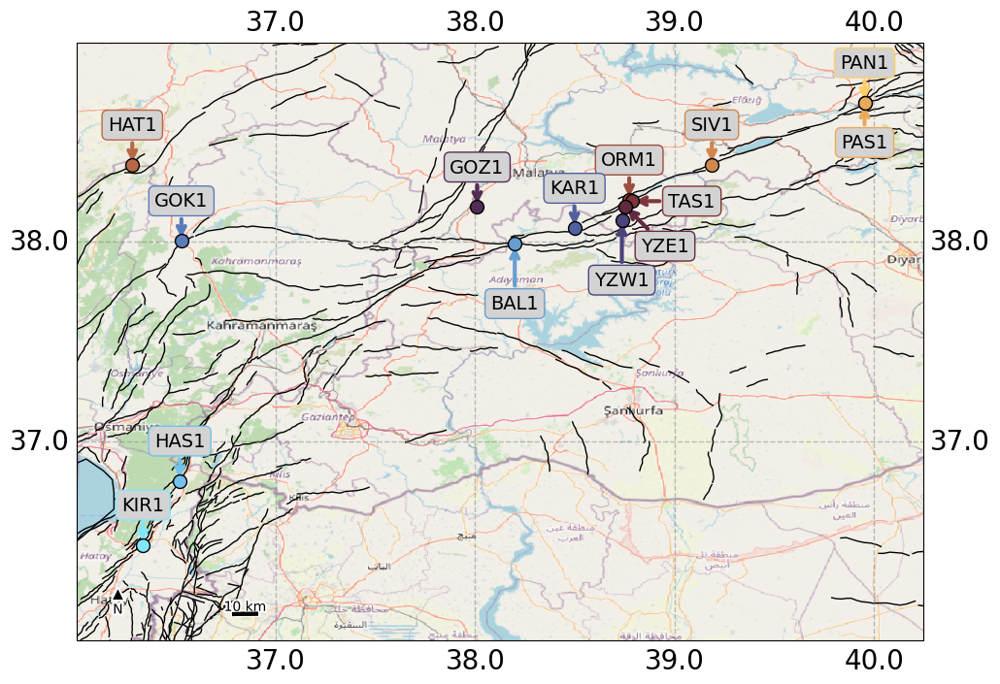

In [404]:
plt.figure(figsize=(20,8))
axa = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
EAF_map(axa,EAF_extent,gdf_Asia,EAF,cmap)
plt.savefig('../../Creep_catalog_stats_figures/New Plots/EAF_map.pdf')
plt.show()




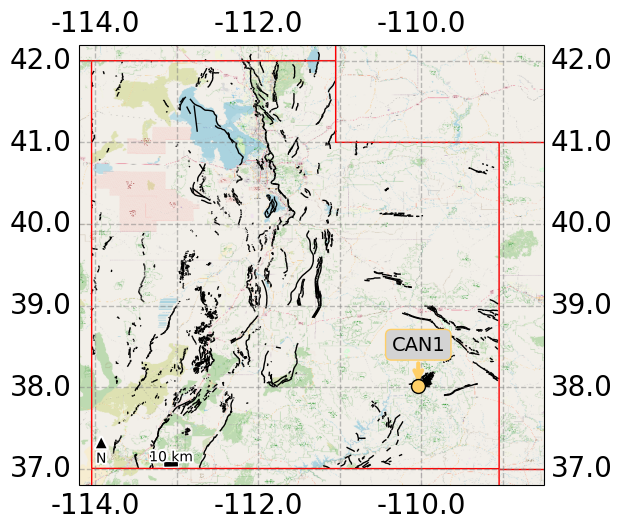

In [410]:
fig = plt.figure(figsize=(6, 6))

axa= plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())
# Initialize OpenStreetMap tiles
osm = img_tiles.OSM()

# Add OpenStreetMap tiles to the plot
axa.add_image(osm, 10)  # Zoom level of 8 
axa.set_extent(UTA_extent, crs=ccrs.PlateCarree())
axa.add_geometries(gdf_Utah.geometry, crs=ccrs.PlateCarree(), edgecolor='black', facecolor="none")
show_labels=True
gl = axa.gridlines(draw_labels=show_labels, linewidth=1, color='gray', alpha=0.5, linestyle='--')

if show_labels:
    gl.xlabel_style = {'size': 20}
    gl.ylabel_style = {'size': 20}

    # Get the rounded extent values for longitude (x) and latitude (y)
    lon_min, lon_max = np.round(EAF_extent[0], 1), np.round(EAF_extent[1], 1)
    lat_min, lat_max = np.round(EAF_extent[2], 1), np.round(EAF_extent[3], 1)

    # Determine a reasonable interval for longitude (x-axis)
    lon_range = abs(lon_max - lon_min)
    if lon_range <= 0.5:
        lon_step = 0.1
    elif lon_range <= 1:
        lon_step = 0.2
    elif lon_range <=2:
        lon_step = 0.5
    else:
        lon_step = 1.0

    # Determine a reasonable interval for latitude (y-axis)
    lat_range = abs(lat_max - lat_min)
    if lat_range <= 0.5:
        lat_step = 0.1
    elif lat_range <= 1:
        lat_step = 0.2
    elif lat_range <=2:
        lat_step = 0.5
    else:
        lat_step = 1.0

    # Apply MultipleLocator to both axes
    gl.xformatter = mticker.FormatStrFormatter('%.1f')
    gl.yformatter = mticker.FormatStrFormatter('%.1f')

else:
    gl.xlabels_top = False
    gl.xlabels_bottom = False
    gl.ylabels_left = False
    gl.ylabels_right = False
shift='vertical'

# Add state boundaries
states_provinces = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_1_states_provinces_lines',
    scale='50m',
    facecolor='none')

axa.add_feature(states_provinces, edgecolor='red',linewidth=1)
colours  = cmap(np.linspace(0, 1, 3))
for i in range(len(UTA)):
    
    face_color = rgb2hex(colours[0])
    # Default xytext offset
    if shift == 'horizontal':
        # Adjust xytext for specific creepmeter abbreviations
        xytext_lon = UTA['Longitude'].iloc[i] + 0.2
        xytext_lat = UTA['Latitude'].iloc[i]
    if shift == 'vertical':
        xytext_lon = UTA['Longitude'].iloc[i] 
        xytext_lat = UTA['Latitude'].iloc[i]+0.5
        if RID['Creepmeter_abbrv'].iloc[i] in ['WSZ1']:
            xytext_lon = UTA['Longitude'].iloc[i]
            xytext_lat = UTA['Latitude'].iloc[i]-0.05
        
        
    
    axa.annotate(
        UTA['Creepmeter_abbrv'].iloc[i], 
        xy=(UTA['Longitude'].iloc[i], UTA['Latitude'].iloc[i]),
        xytext=(xytext_lon, xytext_lat), 
        arrowprops=dict(facecolor=face_color, edgecolor = face_color, arrowstyle='->', lw=3),
        bbox=dict(boxstyle='round,pad=0.3', edgecolor=face_color, facecolor='lightgrey'),
        fontsize=14, ha='center', va='center',
        transform=ccrs.PlateCarree()  # Make sure coordinates are correct
    )
    # Scatter points for creepmeters
    axa.scatter(
        UTA['Longitude'].iloc[i], 
        UTA['Latitude'].iloc[i], 
        color=face_color, 
        edgecolor='black', 
        s=100, 
        zorder=100, 
        transform=ccrs.Geodetic()
    )
scale_bar(axa, ccrs.PlateCarree(), 10)
plt.savefig('../../Creep_catalog_stats_figures/New Plots/Utah_map.pdf')
plt.show()

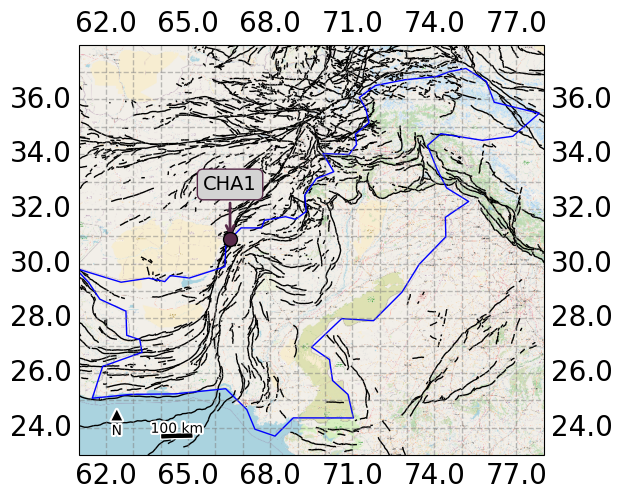

In [406]:
fig = plt.figure(figsize=(6, 6))

axa= plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())
# Initialize OpenStreetMap tiles
osm = img_tiles.OSM()

# Add OpenStreetMap tiles to the plot
axa.add_image(osm, 8)  # Zoom level of 8 
axa.set_extent(pakistan_extent, crs=ccrs.PlateCarree())
axa.add_geometries(gdf_Asia.geometry, crs=ccrs.PlateCarree(), edgecolor='black', facecolor="none")
shapefile_countries = natural_earth(resolution='110m', category='cultural', name='admin_0_countries')
for country in Reader(shapefile_countries).records():
    country_name = country.attributes['NAME']
    if country_name == 'Pakistan':
        axa.add_geometries([country.geometry], ccrs.PlateCarree(), edgecolor='blue', facecolor='none', linewidth=1)



show_labels=True
gl = axa.gridlines(draw_labels=show_labels, linewidth=1, color='gray', alpha=0.5, linestyle='--')

if show_labels:
    gl.xlabel_style = {'size': 20}
    gl.ylabel_style = {'size': 20}

    gl.xformatter = mticker.FormatStrFormatter('%.1f')
    gl.yformatter = mticker.FormatStrFormatter('%.1f')

    # Get the rounded extent values for longitude (x) and latitude (y)
    lon_min, lon_max = np.round(EAF_extent[0], 1), np.round(EAF_extent[1], 1)
    lat_min, lat_max = np.round(EAF_extent[2], 1), np.round(EAF_extent[3], 1)

    # Determine a reasonable interval for longitude (x-axis)
    lon_range = abs(lon_max - lon_min)
    if lon_range <= 0.5:
        lon_step = 0.1
    elif lon_range <= 1:
        lon_step = 0.2
    elif lon_range <=2:
        lon_step = 0.5
    else:
        lon_step = 1.0

    # Determine a reasonable interval for latitude (y-axis)
    lat_range = abs(lat_max - lat_min)
    if lat_range <= 0.5:
        lat_step = 0.1
    elif lat_range <= 1:
        lat_step = 0.2
    elif lat_range <=2:
        lat_step = 0.5
    else:
        lat_step = 1.0

    # Apply MultipleLocator to both axes
    gl.xlocator = mticker.MultipleLocator(lon_step)
    gl.ylocator = mticker.MultipleLocator(lat_step)

else:
    gl.xlabels_top = False
    gl.xlabels_bottom = False
    gl.ylabels_left = False
    gl.ylabels_right = False
shift='vertical'

for i in range(len(CHAF)):
    face_color = rgb2hex(colours[1])
    # Default xytext offset
    if shift == 'horizontal':
        # Adjust xytext for specific creepmeter abbreviations
        xytext_lon = CHAF['Longitude'].iloc[i] + 0.5
        xytext_lat = CHAF['Latitude'].iloc[i]
    if shift == 'vertical':
        xytext_lon = CHAF['Longitude'].iloc[i] 
        xytext_lat = CHAF['Latitude'].iloc[i]+2
        if RID['Creepmeter_abbrv'].iloc[i] in ['WSZ1']:
            xytext_lon = CHAF['Longitude'].iloc[i]
            xytext_lat = CHAF['Latitude'].iloc[i]-0.05
        
        
    
    axa.annotate(
        CHAF['Creepmeter_abbrv'].iloc[i], 
        xy=(CHAF['Longitude'].iloc[i], CHAF['Latitude'].iloc[i]),
        xytext=(xytext_lon, xytext_lat), 
        arrowprops=dict(facecolor=face_color, edgecolor = face_color, arrowstyle='->', lw=2),
        bbox=dict(boxstyle='round,pad=0.3', edgecolor=face_color, facecolor='lightgrey'),
        fontsize=14, ha='center', va='center',
        transform=ccrs.PlateCarree()  # Make sure coordinates are correct
    )
    # Scatter points for creepmeters
    axa.scatter(
        CHAF['Longitude'].iloc[i], 
        CHAF['Latitude'].iloc[i], 
        color=face_color, 
        edgecolor='black', 
        s=100, 
        zorder=100, 
        transform=ccrs.Geodetic()
    )
scale_bar(axa, ccrs.PlateCarree(), 100)
plt.savefig('../../Creep_catalog_stats_figures/New Plots/Pakistan_map.pdf')
plt.show()

In [407]:
pakistan_extent = [61, 78, 23, 38]


In [408]:
Israel_extent = [34.2, 35.9, 29.4, 33.3]

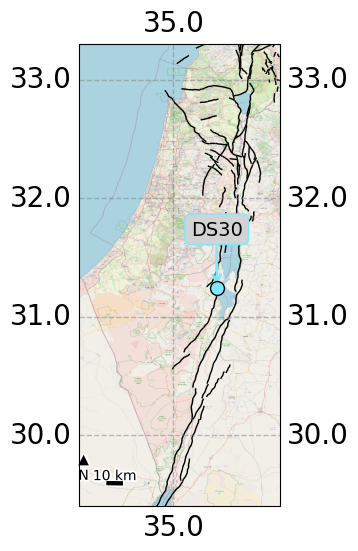

In [409]:
fig = plt.figure(figsize=(6, 6))

axa= plt.subplot(1, 1, 1, projection=ccrs.PlateCarree())
# Initialize OpenStreetMap tiles
osm = img_tiles.OSM()

# Add OpenStreetMap tiles to the plot
axa.add_image(osm, 10)  # Zoom level of 8 
axa.set_extent(Israel_extent, crs=ccrs.PlateCarree())
axa.add_geometries(gdf_Asia.geometry, crs=ccrs.PlateCarree(), edgecolor='black', facecolor="none")
shapefile_countries = natural_earth(resolution='110m', category='cultural', name='admin_0_countries')
'''for country in Reader(shapefile_countries).records():
    country_name = country.attributes['NAME']
    if country_name == 'Israel':
        axa.add_geometries([country.geometry], ccrs.PlateCarree(), edgecolor='blue', facecolor='none', linewidth=1)'''



show_labels=True
gl = axa.gridlines(draw_labels=show_labels, linewidth=1, color='gray', alpha=0.5, linestyle='--')

if show_labels:
    gl.xlabel_style = {'size': 20}
    gl.ylabel_style = {'size': 20}
    
    gl.xformatter = mticker.FormatStrFormatter('%.1f')
    gl.yformatter = mticker.FormatStrFormatter('%.1f')
    # Get the rounded extent values for longitude (x) and latitude (y)
    lon_min, lon_max = np.round(EAF_extent[0], 1), np.round(EAF_extent[1], 1)
    lat_min, lat_max = np.round(EAF_extent[2], 1), np.round(EAF_extent[3], 1)

    # Determine a reasonable interval for longitude (x-axis)
    lon_range = abs(lon_max - lon_min)
    if lon_range <= 0.5:
        lon_step = 0.1
    elif lon_range <= 1:
        lon_step = 0.2
    elif lon_range <=2:
        lon_step = 0.5
    else:
        lon_step = 1.0

    # Determine a reasonable interval for latitude (y-axis)
    lat_range = abs(lat_max - lat_min)
    if lat_range <= 0.5:
        lat_step = 0.1
    elif lat_range <= 1:
        lat_step = 0.2
    elif lat_range <=2:
        lat_step = 0.5
    else:
        lat_step = 1.0

    # Apply MultipleLocator to both axes
    gl.xlocator = mticker.MultipleLocator(lon_step)
    gl.ylocator = mticker.MultipleLocator(lat_step)

else:
    gl.xlabels_top = False
    gl.xlabels_bottom = False
    gl.ylabels_left = False
    gl.ylabels_right = False
shift='vertical'

for i in range(len(DSF)):
    face_color = rgb2hex(colours[2])
    # Default xytext offset
    if shift == 'horizontal':
        # Adjust xytext for specific creepmeter abbreviations
        xytext_lon = DSF['Longitude'].iloc[i] + 0.5
        xytext_lat = DSF['Latitude'].iloc[i]
    if shift == 'vertical':
        xytext_lon = DSF['Longitude'].iloc[i] 
        xytext_lat = DSF['Latitude'].iloc[i]+0.5
        if RID['Creepmeter_abbrv'].iloc[i] in ['WSZ1']:
            xytext_lon = DSF['Longitude'].iloc[i]
            xytext_lat = DSF['Latitude'].iloc[i]-0.05
        
        
    
    axa.annotate(
        DSF['Creepmeter_abbrv'].iloc[i], 
        xy=(DSF['Longitude'].iloc[i], DSF['Latitude'].iloc[i]),
        xytext=(xytext_lon, xytext_lat), 
        arrowprops=dict(facecolor=face_color, edgecolor = face_color, arrowstyle='->', lw=2),
        bbox=dict(boxstyle='round,pad=0.3', edgecolor=face_color, facecolor='lightgrey'),
        fontsize=14, ha='center', va='center',
        transform=ccrs.PlateCarree()  # Make sure coordinates are correct
    )
    # Scatter points for creepmeters
    axa.scatter(
        DSF['Longitude'].iloc[i], 
        DSF['Latitude'].iloc[i], 
        color=face_color, 
        edgecolor='black', 
        s=100, 
        zorder=100, 
        transform=ccrs.Geodetic()
    )
scale_bar(axa, ccrs.PlateCarree(), 10)
plt.savefig('../../Creep_catalog_stats_figures/New Plots/Israel_map.pdf')
plt.show()

/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/1587368848.py:37: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axis.scatter(dur_med,disp_med,s=len(instrument_df),c=colours[i],alpha=0.5)
/var/folders/56/47k8q3q1449cq8kwzkz5r8ch0000gr/T/ipykernel_72429/1587368848.py:38: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv)


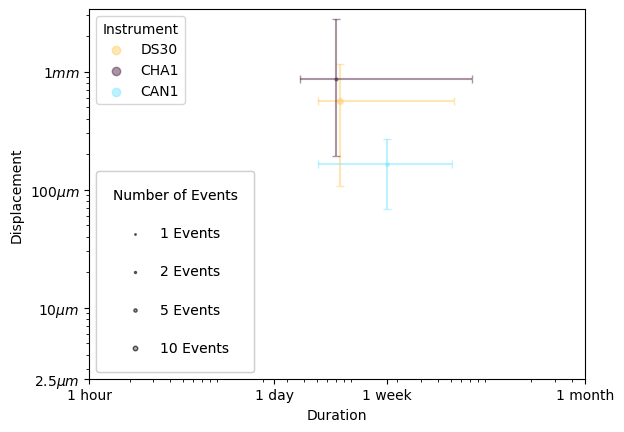

In [113]:
plt.figure()
axis = plt.subplot(1,1,1)


axis.set_xlabel('Duration')
axis.set_ylabel('Displacement')
axis.set_xscale('log')
axis.set_yscale('log')

instrument_dataframe = pd.concat([DSF,CHAF,UTA])



colours  = cmap(np.linspace(0, 1, len(instrument_dataframe)))
for i in range(len(instrument_dataframe)):
    abbrv = instrument_dataframe['Creepmeter_abbrv'].iloc[i]
    colours  = cmap(np.linspace(0, 1, len(instrument_dataframe)))
    #print(abbrv)
    try:
        instrument_df = df_all[df_all['Creepmeter abbreviation'] == abbrv]
        #print(len(instrument_df))
        displacement = instrument_df['Displacement, mm']
        duration = instrument_df['Duration, hrs']
        dur_med = np.median(duration)
        dur85 = np.percentile(duration,85)
        dur15 = np.percentile(duration,15)
        disp_med = np.median(displacement)
        disp85 = np.percentile(displacement,85)
        disp15 = np.percentile(displacement,15)


        # Asymmetric error bars
        xerr = [[dur_med-dur15], [dur85-dur_med]]
        yerr = [[disp_med-disp15], [disp85-disp_med]]
        
        axis.errorbar(dur_med, disp_med, xerr=xerr, yerr=yerr, fmt='none', ecolor=colours[i], alpha=0.5, capsize=3)
        axis.scatter(dur_med,disp_med,s=len(instrument_df),c=colours[i],alpha=0.5)
        axis.scatter([],[],c=colours[i],alpha=0.5,label=abbrv)
    

    except IndexError:
        print('no events')


# First legend (Color & Marker Style) - Automatically created by seaborn/matplotlib
legend1 = plt.legend(title="Instrument", loc="upper left", frameon=True)

# Define representative event counts for the size legend
size_legend_values = [1, 2, 5, 10]  # Adjust as needed
size_legend_labels = [f'{val} Events' for val in size_legend_values]


# Create properly sized legend markers
size_legend_handles = [
    axis.scatter([], [], s=size, color='gray', label=label, alpha=0.6, edgecolors='k')
    for size, label in zip(size_legend_values, size_legend_labels)]
if instrument_dataframe['Network'].iloc[0] in ['HAY', 'NAF','DSF']:
    # Second legend (Event Sizes)
    if instrument_dataframe['Network'].iloc[0] =='HAY':
        loc = 'lower left'
    else:
        loc = 'lower right'
    legend2 = plt.legend(
        handles=size_legend_handles, title='Number of Events',
        loc='lower left', frameon=True, labelspacing=1.75, borderpad=1.2, scatterpoints=1
    )
    plt.gca().add_artist(legend2)  # Add the second legend

# Add both legends
plt.gca().add_artist(legend1)  # Keep the first legend

# Set custom tick positions
axis.set_xticks([1, 24, 168,5040])
axis.set_yticks([0.0025,0.01,0.1,1])
# Set custom labels
axis.set_xticklabels(['1 hour', '1 day', '1 week','1 month'])
axis.set_yticklabels([r'2.5$\mu m$', r'10$\mu m$', r'100$\mu m$',r'1$mm$'])
plt.show()

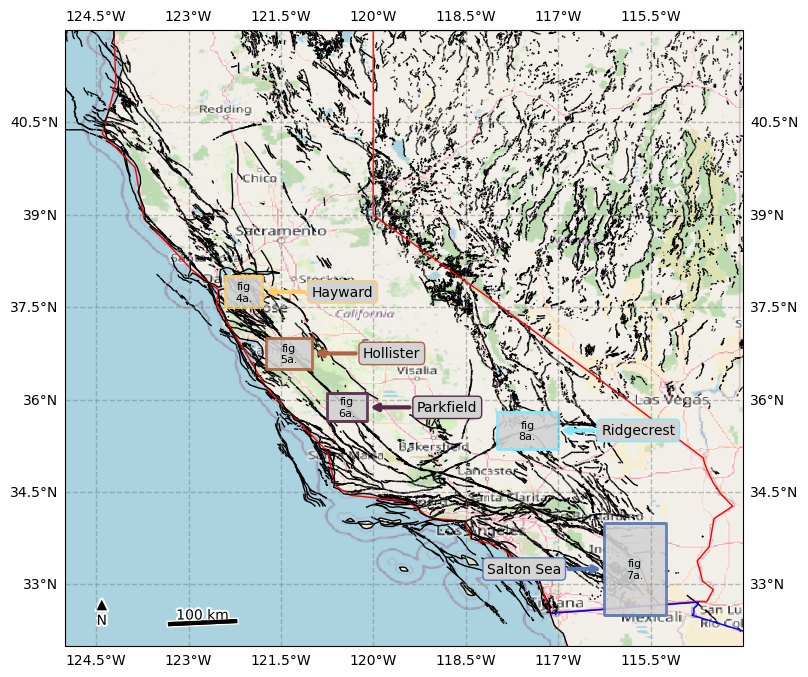

In [115]:
Cali_extent = [-125.0, -114.0, 32.0, 42.0]
fig = plt.figure(figsize=(20,8))
axa = plt.subplot(1,1,1,projection=ccrs.PlateCarree())
osm = img_tiles.OSM()

# Add OpenStreetMap tiles to the plot
axa.add_image(osm, 6)  # Zoom level of 8 
axa.set_extent(Cali_extent, crs=ccrs.PlateCarree())
axa.add_geometries(gdf_USA.geometry, crs=ccrs.PlateCarree(), edgecolor='black', facecolor="none")

shapefile_states = natural_earth(resolution='110m', category='cultural', name='admin_1_states_provinces')
# Fill California with beige
for state in Reader(shapefile_states).records():
    state_name = state.attributes['name']
    country_code = state.attributes['adm0_a3']
    if state_name == 'California' and country_code == 'USA':
        axa.add_geometries([state.geometry], ccrs.PlateCarree(), edgecolor='red', facecolor='none', linewidth=1)


axa.coastlines(resolution='50m')
axa.add_feature(cfeature.BORDERS, edgecolor='blue', linewidth=1)
# Add Fault geometries
colours  = cmap(np.linspace(0, 1, 5))
# Define colors and labels for regions
regions = {
    'Hayward': {'coords': dict(left=-122.4, bottom=37.5, right=-121.8, top=38), 'color': colours[0], 'label': 'fig\n4a.'},
    'Hollister': {'coords': dict(left=-121.75, bottom=36.5, right=-121.0, top=37.0), 'color': colours[1], 'label': 'fig\n5a.'},
    'Parkfield': {'coords': dict(left=-120.75, bottom=35.65, right=-120.1, top=36.1), 'color': colours[2], 'label': 'fig\n6a.'},
    'Salton Sea': {'coords': dict(left=-116.25, bottom=32.5, right=-115.25, top=34), 'color': colours[3], 'label': 'fig\n7a.'},
    'Ridgecrest': {'coords': dict(left=-118, bottom=35.2, right=-117, top=35.8), 'color': colours[4], 'label': 'fig\n8a.'}
}


label_distance = 1.3  # Distance from the box for text labels
text_box_color = 'lightgrey'
alpha_inner = 0.9  # Alpha for the inner box

# Loop through each region to create bounding boxes and annotations
for region, props in regions.items():
    coords = props['coords']
    color = props['color']
    label = props['label']

    # Create and add bounding box
    bbox = box(coords['left'], coords['bottom'], coords['right'], coords['top'])
    axa.add_geometries([bbox], ccrs.PlateCarree(), edgecolor=color, facecolor='lightgrey', linestyle='-', linewidth=2, alpha=alpha_inner)

    # Calculate label position
    label_y = (coords['top'] + coords['bottom']) / 2
    label_x = coords['right'] + label_distance if region != 'Salton Sea' else coords['left'] - label_distance

    # Add annotation
    axa.annotate(region, 
                      xy=(coords['right'] if region != 'Salton Sea' else coords['left'], label_y),
                      xytext=(label_x, label_y),
                      arrowprops=dict(facecolor=color,edgecolor=color, arrowstyle='->', lw=3),
                      bbox=dict(boxstyle='round,pad=0.3', edgecolor=color, facecolor=text_box_color),
                      fontsize=10, ha='center', va='center')

    # Add text inside the bounding box
    box_x_center = (coords['left'] + coords['right']) / 2
    axa.text(box_x_center, label_y, label, fontsize=8, ha='center', va='center', color='black')

scale_bar(axa, ccrs.PlateCarree(), 100)
axa.gridlines(draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--')
plt.show()

#ffcf67 #c17449 #773339 #4c3d73 #5f89c3 #81e7ff
<urlopen error [Errno 8] nodename nor servname provided, or not known>
<urlopen error [Errno 8] nodename nor servname provided, or not known>
<urlopen error [Errno 8] nodename nor servname provided, or not known>
<urlopen error [Errno 8] nodename nor servname provided, or not known>


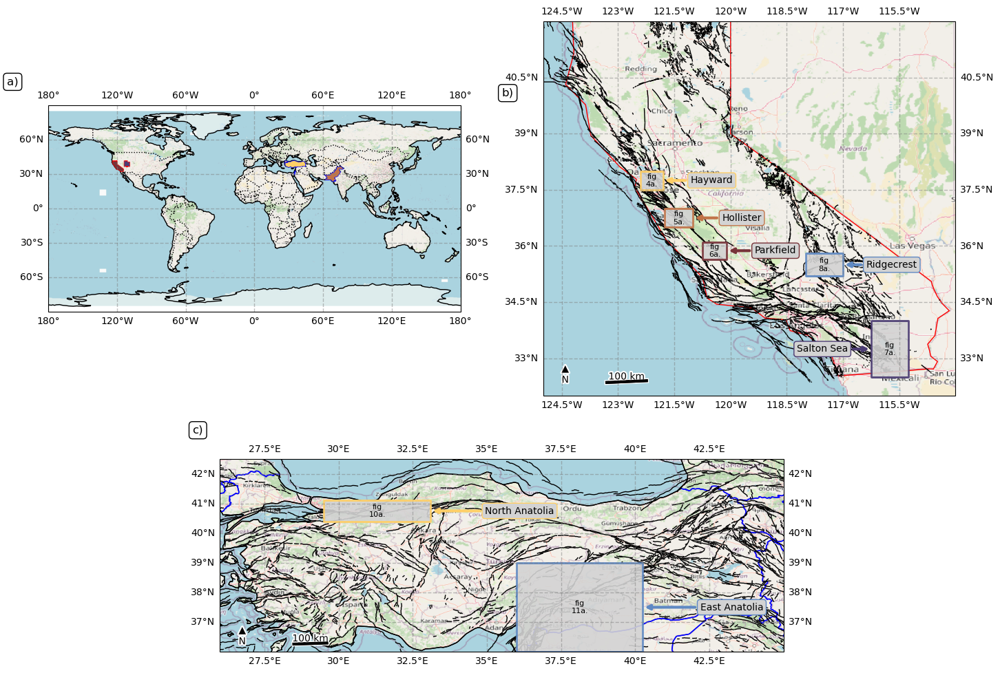

In [116]:
fig = plt.figure(figsize=(12, 10))
gs = gridspec.GridSpec(2, 2, height_ratios=[1, 0.5])  # Set height ratios as needed

# First row: two side-by-side plots
ax_left = fig.add_subplot(gs[0, 0], projection=ccrs.PlateCarree())
ax_right = fig.add_subplot(gs[0, 1], projection=ccrs.PlateCarree())

# Second row: single centered plot
ax1 = fig.add_subplot(gs[1, :], projection=ccrs.PlateCarree())


# Adjust space between subplots
plt.subplots_adjust(wspace=0.2)

# Load the Natural Earth data for country boundaries
shapefile_countries = natural_earth(resolution='110m', category='cultural', name='admin_0_countries')
shapefile_states = natural_earth(resolution='110m', category='cultural', name='admin_1_states_provinces')

# Add labels to the subplots
fig.text(-0.1, 1.1, 'a)', transform=ax_left.transAxes, fontsize=12,
             bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))
ax_right.text(-0.1, 0.8, 'b)', transform=ax_right.transAxes, fontsize=12,
              bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))
fig.text(-0.85, -0.1, 'c)', transform=ax_right.transAxes, fontsize=12,
              bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

# --------------------------- Left Panel (World Map) --------------------------- #
osm = img_tiles.OSM()
ax_left.add_image(osm, 6)
ax_left.coastlines()
ax_left.add_feature(cfeature.BORDERS, linestyle=':', edgecolor='black')
slicedCM = cmap(np.linspace(0,1,6))
print(rgb2hex(slicedCM[0]),rgb2hex(slicedCM[1]),rgb2hex(slicedCM[2]),rgb2hex(slicedCM[3]),rgb2hex(slicedCM[4]),rgb2hex(slicedCM[5]))
# Highlight specific countries on the map
for country in Reader(shapefile_countries).records():
    country_name = country.attributes['NAME']
    if country_name == 'Turkey':
        ax_left.add_geometries([country.geometry], ccrs.PlateCarree(), edgecolor='blue', facecolor=slicedCM[0], linewidth=0.5)
    elif country_name == 'Pakistan':
        ax_left.add_geometries([country.geometry], ccrs.PlateCarree(), edgecolor='blue', facecolor=slicedCM[1], linewidth=0.5)
    elif country_name =='Israel':
        ax_left.add_geometries([country.geometry], ccrs.PlateCarree(), edgecolor='blue', facecolor=slicedCM[4], linewidth=0.5)
    else:
        ax_left.add_geometries([country.geometry], ccrs.PlateCarree(), edgecolor='none', facecolor='none', linewidth=0.5)

# Highlight California in the world map
for state in Reader(shapefile_states).records():
    state_name = state.attributes['name']
    country_code = state.attributes['adm0_a3']
    if state_name == 'California' and country_code == 'USA':
        ax_left.add_geometries([state.geometry], ccrs.PlateCarree(), edgecolor='red', facecolor=slicedCM[2], linewidth=0.5)
    elif state_name == 'Utah' and country_code == 'USA':
        ax_left.add_geometries([state.geometry], ccrs.PlateCarree(), edgecolor='red', facecolor=slicedCM[3], linewidth=0.5)
    else:
        ax_left.add_geometries([state.geometry], ccrs.PlateCarree(), edgecolor='none', facecolor='none', linewidth=0.5)
    

ax_left.gridlines(draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--')
ax_left.set_global()

# ------------------------- Right Panel (California Only) ------------------------- #
ax_right.set_extent([-125.0, -114.0, 32.0, 42.0])

osm = img_tiles.OSM()
ax_right.add_image(osm, 6)


# Fill California with beige
for state in Reader(shapefile_states).records():
    state_name = state.attributes['name']
    country_code = state.attributes['adm0_a3']
    if state_name == 'California' and country_code == 'USA':
        ax_right.add_geometries([state.geometry], ccrs.PlateCarree(), edgecolor='red', facecolor='none', linewidth=1)


ax1.coastlines(resolution='50m')
ax1.add_feature(cfeature.BORDERS, edgecolor='blue', linewidth=1)
# Add Fault geometries
ax_right.add_geometries(gdf_Cali.geometry, crs = ccrs.PlateCarree(),edgecolor='black', facecolor="none")

# Define colors and labels for regions
regions = {
    'Hayward': {'coords': dict(left=-122.4, bottom=37.5, right=-121.8, top=38), 'color': slicedCM[0], 'label': 'fig\n4a.'},
    'Hollister': {'coords': dict(left=-121.75, bottom=36.5, right=-121.0, top=37.0), 'color': slicedCM[1], 'label': 'fig\n5a.'},
    'Parkfield': {'coords': dict(left=-120.75, bottom=35.65, right=-120.1, top=36.1), 'color': slicedCM[2], 'label': 'fig\n6a.'},
    'Salton Sea': {'coords': dict(left=-116.25, bottom=32.5, right=-115.25, top=34), 'color': slicedCM[3], 'label': 'fig\n7a.'},
    'Ridgecrest': {'coords': dict(left=-118, bottom=35.2, right=-117, top=35.8), 'color': slicedCM[4], 'label': 'fig\n8a.'}
}


label_distance = 1.3  # Distance from the box for text labels
text_box_color = 'lightgrey'
alpha_inner = 0.9  # Alpha for the inner box

# Loop through each region to create bounding boxes and annotations
for region, props in regions.items():
    coords = props['coords']
    color = props['color']
    label = props['label']

    # Create and add bounding box
    bbox = box(coords['left'], coords['bottom'], coords['right'], coords['top'])
    ax_right.add_geometries([bbox], ccrs.PlateCarree(), edgecolor=color, facecolor='lightgrey', linestyle='-', linewidth=2, alpha=alpha_inner)

    # Calculate label position
    label_y = (coords['top'] + coords['bottom']) / 2
    label_x = coords['right'] + label_distance if region != 'Salton Sea' else coords['left'] - label_distance

    # Add annotation
    ax_right.annotate(region, 
                      xy=(coords['right'] if region != 'Salton Sea' else coords['left'], label_y),
                      xytext=(label_x, label_y),
                      arrowprops=dict(facecolor=color,edgecolor=color, arrowstyle='->', lw=3),
                      bbox=dict(boxstyle='round,pad=0.3', edgecolor=color, facecolor=text_box_color),
                      fontsize=10, ha='center', va='center')

    # Add text inside the bounding box
    box_x_center = (coords['left'] + coords['right']) / 2
    ax_right.text(box_x_center, label_y, label, fontsize=8, ha='center', va='center', color='black')

scale_bar(ax_right, ccrs.PlateCarree(), 100)
ax_right.gridlines(draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--')

# --------------------------- Turkey ------------------------------------- #
turkiye_extent = [26.0, 45.0, 36.0, 42.5]
# Create an instance of GoogleTiles
# google_tiles = img_tiles.GoogleTiles(style='satellite')
# Add the Google Tiles to the axis with a lower zoom level
# ax1.add_image(google_tiles, 10)
ax1.set_extent(turkiye_extent)
# Initialize OpenStreetMap tiles
osm = img_tiles.OSM()
ax1.add_image(osm, 6)  # Zoom level of 8  


extent = turkiye_extent
 # Add coastlines and other features if desired
ax1.coastlines(resolution='50m')
ax1.add_feature(cfeature.BORDERS, edgecolor='blue', linewidth=1)


# Add Fault geometries
ax1.add_geometries(gdf_Cali.geometry, crs = ccrs.PlateCarree(),edgecolor='black', facecolor="none")
ax1.add_geometries(gdf_Asia.geometry, crs = ccrs.PlateCarree(),edgecolor='black', facecolor="none")
# Define box colours
# Define colors and labels for regions
regions = {
    'North Anatolia': {'coords': dict(left=29.5, bottom=40.4, right=33.1, top=41.1), 'color': slicedCM[0], 'label': 'fig\n10a.'},
    'East Anatolia': {'coords': dict(left=36, bottom=36, right=40.25, top=39), 'color': slicedCM[4], 'label': 'fig\n11a.'},
}
label_distance = 3  # Distance from the box for text labels
text_box_color = 'lightgrey'
alpha_inner = 0.9  # Alpha for the inner box

# Loop through each region to create bounding boxes and annotations
for region, props in regions.items():
    coords = props['coords']
    color = props['color']
    label = props['label']

    # Create and add bounding box
    bbox = box(coords['left'], coords['bottom'], coords['right'], coords['top'])
    ax1.add_geometries([bbox], ccrs.PlateCarree(), edgecolor=color, facecolor='lightgrey', linestyle='-', linewidth=2, alpha=alpha_inner)

    # Calculate label position
    label_y = (coords['top'] + coords['bottom']) / 2
    label_x = coords['right'] + label_distance if region != 'Salton Sea' else coords['left'] - label_distance

    # Add annotation
    ax1.annotate(region, 
                      xy=(coords['right'] if region != 'Salton Sea' else coords['left'], label_y),
                      xytext=(label_x, label_y),
                      arrowprops=dict(facecolor=color,edgecolor=color, arrowstyle='->', lw=3),
                      bbox=dict(boxstyle='round,pad=0.3', edgecolor=color, facecolor=text_box_color),
                      fontsize=10, ha='center', va='center')

    # Add text inside the bounding box
    box_x_center = (coords['left'] + coords['right']) / 2
    ax1.text(box_x_center, label_y, label, fontsize=8, ha='center', va='center', color='black')

scale_bar(ax1, ccrs.PlateCarree(), 100)
ax1.gridlines(draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--')
# --------------------------- Display the Plot --------------------------- #
fig.set_size_inches(17, 12)
plt.savefig("../../Creep_catalog_stats_figures/New Plots/Creepmeter_locations_world_updated_08_AUG_25.pdf")
plt.show()


In [ ]:
fig = plt.figure(figsize=(12, 10))

# Second row: single centered plot
ax_left = plt.subplot(1,1,1, projection=ccrs.PlateCarree())


# Adjust space between subplots
plt.subplots_adjust(wspace=0.2)

# Load the Natural Earth data for country boundaries
shapefile_countries = natural_earth(resolution='110m', category='cultural', name='admin_0_countries')
shapefile_states = natural_earth(resolution='110m', category='cultural', name='admin_1_states_provinces')


# --------------------------- Left Panel (World Map) --------------------------- #
osm = img_tiles.OSM()
ax_left.add_image(osm, 6)
ax_left.coastlines()
ax_left.add_feature(cfeature.BORDERS, linestyle=':', edgecolor='black')
slicedCM = cmap(np.linspace(0,1,6))
print(rgb2hex(slicedCM[0]),rgb2hex(slicedCM[1]),rgb2hex(slicedCM[2]),rgb2hex(slicedCM[3]),rgb2hex(slicedCM[4]),rgb2hex(slicedCM[5]))
# Highlight specific countries on the map
for country in Reader(shapefile_countries).records():
    country_name = country.attributes['NAME']
    if country_name == 'Turkey':
        ax_left.add_geometries([country.geometry], ccrs.PlateCarree(), edgecolor='blue', facecolor=slicedCM[0], linewidth=0.5)
    elif country_name == 'Pakistan':
        ax_left.add_geometries([country.geometry], ccrs.PlateCarree(), edgecolor='blue', facecolor=slicedCM[1], linewidth=0.5)
    elif country_name =='Israel':
        ax_left.add_geometries([country.geometry], ccrs.PlateCarree(), edgecolor='blue', facecolor=slicedCM[4], linewidth=0.5)
    else:
        ax_left.add_geometries([country.geometry], ccrs.PlateCarree(), edgecolor='none', facecolor='none', linewidth=0.5)

# Highlight California in the world map
for state in Reader(shapefile_states).records():
    state_name = state.attributes['name']
    country_code = state.attributes['adm0_a3']
    if state_name == 'California' and country_code == 'USA':
        ax_left.add_geometries([state.geometry], ccrs.PlateCarree(), edgecolor='red', facecolor=slicedCM[2], linewidth=0.5)
    elif state_name == 'Utah' and country_code == 'USA':
        ax_left.add_geometries([state.geometry], ccrs.PlateCarree(), edgecolor='red', facecolor=slicedCM[3], linewidth=0.5)
    else:
        ax_left.add_geometries([state.geometry], ccrs.PlateCarree(), edgecolor='none', facecolor='none', linewidth=0.5)
    

ax_left.gridlines(draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--')
ax_left.set_global()

In [ ]:
(dt.datetime(2025,4,12,12,58,0) - dt.datetime(2025,4,2,10,58))/dt.timedelta(days=1)

In [ ]:
surge = ['surge']*len(df_surge)
creeplet = ['creeplet']*len(df_creeplet)
creep_event = ['creep event']*len(df_ce)

In [ ]:
df_surge['type'] = surge
df_creeplet['type'] = creeplet
df_ce['type'] = creep_event
df_all_types = pd.concat([df_surge,df_creeplet,df_ce])

In [ ]:
df_all_types['Sampling rate, mins'] = round(df_all_types['Sampling rate, mins'],2)

In [ ]:
plt.figure(figsize=(20,6))
plt.stem(df_ce['ST'],df_ce['Displacement, mm'])
plt.stem(df_creeplet['ST'],df_creeplet['Displacement, mm'],linefmt='orange')
plt.stem(df_surge['ST'],df_surge['Displacement, mm'],linefmt='red')
plt.yscale('log')
plt.show()

In [ ]:
colours  = cmap(np.linspace(0, 1, 11))
%matplotlib inline

In [ ]:
plt.figure(figsize=(10,6))

# Group by date and type
grouped = df_all_types.groupby([pd.Grouper(key='ST', freq='D'), 'type']).size().unstack(fill_value=0)

# Cumulative sum
cumulative = grouped.cumsum()

# Sort columns by total count (smallest to largest → largest on top)
sorted_cols = cumulative.iloc[-1].sort_values(ascending=True).index
cumulative_sorted = cumulative[sorted_cols]

# Plot
cumulative_sorted.plot(kind='area', stacked=True, figsize=(20, 6),
                       color=[colours[i] for i in [0, 8, 5]])  # Match colour to order if needed
plt.ylabel("Cumulative Event Count",fontsize=20)
plt.xlabel("Date",fontsize=20)
plt.xlim([dt.datetime(1980, 1, 1), dt.datetime(2024, 1, 1)])
plt.ylim([0,6000])
#plt.vlines([dt.datetime(2004,9,28,17,15,24)],colors=['k'],ymin=0,ymax=6000,linewidth=3)

#plt.vlines([dt.datetime(2004,9,28,17,15,24),dt.datetime(2018,9,6,0,0,0)],colors=['k','grey'],ymin=0,ymax=6000,linewidth=3)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.tight_layout()
#plt.text(dt.datetime(2004,9,28,17,15,24),5900,'Parkfield\nEarthquake',rotation=90,verticalalignment='top',horizontalalignment='center',fontsize=14)
#plt.text(dt.datetime(2018,9,6,0,0,0),5900,'1 mins\nsampling',rotation=90,verticalalignment='top',horizontalalignment='center',fontsize=14)
#plt.savefig('../../Creep_catalog_stats_figures/event_v_surge_v_creeplet.pdf')
plt.show()

In [ ]:

# Group by date and type
grouped = df_all_types.groupby([pd.Grouper(key='ST', freq='D'), 'Sampling rate, mins']).size().unstack(fill_value=0)

# Cumulative sum
cumulative = grouped.cumsum()


# Plot
cumulative.plot(kind='area', stacked=True, figsize=(20, 6), color=colours)
plt.ylabel("Cumulative Event Count",fontsize=20)
plt.xlabel("Date",fontsize=20)
plt.xlim([dt.datetime(1980, 1, 1), dt.datetime(2024, 1, 1)])
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=11,title="Sampling rate, mins")
plt.vlines([dt.datetime(2004,9,28,17,15,24)],colors=['k'],ymin=0,ymax=6000,linewidth=3)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=13,title="Sampling rate, mins")
plt.xlim([dt.datetime(1980, 1, 1), dt.datetime(2024, 1, 1)])
plt.ylim([0,6000])
plt.tight_layout()
#plt.text(dt.datetime(2004,9,28,17,15,24),5900,'Parkfield\nEarthquake',rotation=90,verticalalignment='top',horizontalalignment='center',fontsize=14)
#plt.text(dt.datetime(2018,9,6,0,0,0),5900,'1 mins\nsampling',rotation=90,verticalalignment='top',horizontalalignment='center',fontsize=14)
plt.savefig('../../Creep_catalog_stats_figures/event_v_surge_v_creeplet_sampling.pdf')
plt.tight_layout()

plt.show()

In [ ]:
df_all_types.drop(df_all_types[df_all_types['Sampling rate, mins']>=10].index)

In [ ]:
creepmeter_lifetimes = pd.read_csv('../../Data/DATA_tidied/creepmeter_metadata_post_standardisation_sac_codes_updated.csv',index_col=0)
creepmeter_lifetimes['Start Time'] = pd.to_datetime(creepmeter_lifetimes['Start Time'])

In [ ]:
#creepmeter_lifetimes.drop(creepmeter_lifetimes[creepmeter_lifetimes['Sampling rate, Hz']<=0.001667].index,inplace=True)

In [ ]:
%matplotlib inline
# Group by date and type
grouped = creepmeter_lifetimes.groupby([pd.Grouper(key='Start Time', freq='D'), 'Sampling rate, mins']).size().unstack(fill_value=0)

# Cumulative sum
cumulative = grouped.cumsum()


# Plot
cumulative.plot(kind='area', stacked=True, figsize=(20, 6), color=colours)
plt.ylabel("Cumulative Instrument Count",fontsize=20)
plt.xlabel("Date",fontsize=20)
plt.xlim([dt.datetime(1980, 1, 1), dt.datetime(2024, 1, 1)])
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=11,title="Sampling rate, mins")
plt.tight_layout()
plt.vlines([dt.datetime(2004,9,28,17,15,24),dt.datetime(2018,9,6,0,0,0)],colors=['k','grey'],ymin=0,ymax=125,linewidth=3)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16)
plt.tight_layout()
plt.text(dt.datetime(2004,9,28,17,15,24),120,'Parkfield\nEarthquake',rotation=90,verticalalignment='top',horizontalalignment='center',fontsize=14)
plt.text(dt.datetime(2018,9,6,0,0,0),120,'1 mins\nsampling',rotation=90,verticalalignment='top',horizontalalignment='center',fontsize=14)

plt.savefig('../../Creep_catalog_stats_figures/Sampling_freqs_through_time_annotated.pdf')
plt.show()

In [ ]:
# Assume your df has: Start Time, End Time, Sampling rate, mins
creep = creepmeter_lifetimes.copy()
creep['End Time'] = pd.to_datetime(creep['End Time'])
creep['Start Time'] = pd.to_datetime(creep['Start Time'])

# Convert sampling rate strings (like "1T", "10T", "10S") to Timedelta objects
creep['Sampling rate, mins'] = pd.to_timedelta(creep['Sampling rate, mins'])

# Convert timedelta to minutes (float)
creep['Sampling rate, mins'] = round(creep['Sampling rate, mins'].dt.total_seconds()/60,2)

# Create daily date range
date_range = pd.date_range(start=creep['Start Time'].min().floor('D'), 
                           end=creep['End Time'].max().ceil('D'), freq='M')

# Create empty DataFrame with dates as index
active_matrix = pd.DataFrame(0, index=date_range, columns=creep.index)

# Fill matrix: mark instrument as active on each day it's alive
for idx, row in creep.iterrows():
    active_matrix.loc[row['Start Time'].floor('D'):row['End Time'].ceil('D'), idx] = 1

# Add sampling rate info
sampling_rate = creep['Sampling rate, mins']

# Replace columns with corresponding sampling rate
active_matrix.columns = sampling_rate

# Now group by sampling rate
active_by_rate = active_matrix.groupby(axis=1, level=0).sum()

# Plot
active_by_rate.plot(kind='area', stacked=True, figsize=(20, 6), color=colours)
plt.ylabel("Active Instrument Count", fontsize=20)
plt.xlabel("Date", fontsize=20)
plt.xlim([dt.datetime(1980, 1, 1), dt.datetime(2024, 1, 1)])
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16, title="Sampling rate, mins")
plt.tight_layout()

# Annotations
'''plt.vlines([dt.datetime(2004,1,1), dt.datetime(2017,11,1),dt.datetime(2023,2,1)],colors=['k', 'grey','lightgrey'], ymin=0, ymax=50, linewidth=3)
plt.text(dt.datetime(2004,1,1), 50,'Southern\nCalifornia', rotation=90, va='top', ha='center', fontsize=14)
plt.text(dt.datetime(2017,11,1), 50, 'North\nAnatolia', rotation=90, va='top', ha='center', fontsize=14)
plt.text(dt.datetime(2023,2,1), 50, 'East\nAnatolia', rotation=90, va='top', ha='center', fontsize=14)'''

plt.savefig('../../Creep_catalog_stats_figures/Sampling_freqs_through_time_corrected.pdf')
plt.show()


In [ ]:
# Assume your df has: Start Time, End Time, Sampling rate, mins
creep = creepmeter_lifetimes.copy()
creep['End Time'] = pd.to_datetime(creep['End Time'])
creep['Start Time'] = pd.to_datetime(creep['Start Time'])

# Convert sampling rate strings (like "1T", "10T", "10S") to Timedelta objects
creep['Sampling rate, mins'] = pd.to_timedelta(creep['Sampling rate, mins'])

# Convert timedelta to minutes (float)
creep['Sampling rate, mins'] = round(creep['Sampling rate, mins'].dt.total_seconds()/60,2)

# Create daily date range
date_range = pd.date_range(start=creep['Start Time'].min().floor('D'), 
                           end=creep['End Time'].max().ceil('D'), freq='M')

# Create empty DataFrame with dates as index
active_matrix = pd.DataFrame(0, index=date_range, columns=creep.index)

# Fill matrix: mark instrument as active on each day it's alive
for idx, row in creep.iterrows():
    active_matrix.loc[row['Start Time'].floor('D'):row['End Time'].ceil('D'), idx] = 1

# Add sampling rate info
sampling_rate = creep['Network']

# Replace columns with corresponding sampling rate
active_matrix.columns = sampling_rate

# Now group by sampling rate
active_by_rate = active_matrix.groupby(axis=1, level=0).sum()

# Plot
active_by_rate.plot(kind='area', stacked=True, figsize=(20, 6), color=colours)
plt.ylabel("Active Instrument Count", fontsize=20)
plt.xlabel("Date", fontsize=20)
plt.xlim([dt.datetime(1980, 1, 1), dt.datetime(2024, 1, 1)])
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=16, title="Sampling rate, mins")
plt.tight_layout()

# Annotations
plt.vlines([dt.datetime(2004,1,1), dt.datetime(2017,11,1),dt.datetime(2023,2,1)],colors=['k', 'grey','lightgrey'], ymin=0, ymax=50, linewidth=3)
plt.text(dt.datetime(2004,1,1), 50,'Southern\nCalifornia', rotation=90, va='top', ha='center', fontsize=14)
plt.text(dt.datetime(2017,11,1), 50, 'North\nAnatolia', rotation=90, va='top', ha='center', fontsize=14)
plt.text(dt.datetime(2023,2,1), 50, 'East\nAnatolia', rotation=90, va='top', ha='center', fontsize=14)

#plt.savefig('../../Creep_catalog_stats_figures/Sampling_freqs_through_time_corrected.pdf')
plt.show()


In [ ]:
# Group by date and type
grouped = creepmeter_lifetimes.groupby([pd.Grouper(key='Start Time', freq='D'), 'Network']).size().unstack(fill_value=0)

# Cumulative sum
cumulative = grouped.cumsum()


# Plot
cumulative.plot(kind='area', stacked=True, figsize=(10, 5), color=colours)
plt.ylabel("Cumulative Event Count",fontsize=20)
plt.xlabel("Date",fontsize=20)
plt.xlim([dt.datetime(1980, 1, 1), dt.datetime(2024, 1, 1)])
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.legend(fontsize=11,title="Sampling rate, mins")
plt.tight_layout()
plt.show()

In [ ]:
plt.figure(figsize=(18, 8))
y=0
smpl_rate = np.unique(creepmeters['Sampling rate, mins'])
for i in range(len(creepmeters)):
    boolarr = np.where(creepmeter_lifetimes['Creepmeter_abbrv']==creepmeters['Creepmeter_abbrv'].iloc[i])[0]
    for j in range(len(boolarr)):
        selected = creepmeter_lifetimes.iloc[boolarr[j]]
        start = pd.to_datetime(selected['Start Time'])
        end = pd.to_datetime(selected['End Time'])
        # Plot the horizontal line
        color_choise = np.where(smpl_rate==selected['Sampling rate, mins'])
        plt.hlines(y, start, end, color=colours[color_choise], linewidth=2)

        # Plot vertical bars at the ends
        #plt.vlines([start, end], y - 0.1, y + 0.1, color=colours[color_choise], linewidth=2)
    y+=1
plt.yticks(np.arange(0,74),creepmeters['Creepmeter_abbrv'])
# Formatting
plt.ylim(73.5, -0.5)
#plt.xlim(2004, 2006)
plt.xlabel("Time (years)")
plt.tight_layout()
plt.show()

In [ ]:
bool

In [ ]:
np.unique(df_all_types['Network'])

In [ ]:
Hol_events = df_all_types[df_all_types["Network"].isin(["HOL", "CAL"])]
park_events = df_all_types[df_all_types["Network"].isin(['PARK'])]
Hay_events = df_all_types[df_all_types['Network'].isin(['HAY'])]
SoCal_events = df_all_types[df_all_types["Network"].isin(['SOCAL'])]

Cali_events = df_all_types[df_all_types["Network"].isin(["HAY","HOL", "CAL",'PARK',"SOCAL"])]

In [ ]:
plt.figure(figsize=(10,6))

# Group by latitude and type
grouped = Hol_events.groupby(['Latitude', 'type']).size().unstack(fill_value=0)

# Sort columns by total count so largest is plotted last (on top)
sorted_cols = grouped.sum().sort_values(ascending=True).index
grouped_sorted = grouped[sorted_cols]

# Sort latitude so it appears nicely on the x-axis
grouped_sorted = grouped_sorted.sort_index()

percent = grouped.div(grouped.sum(axis=1), axis=0) * 100

# Plot
percent.plot(kind='area', stacked=True, figsize=(20, 6),
                    color=[colours[i] for i in [0, 4, 8]])

plt.vlines(percent.index.to_list(),ymin=0,ymax=100,color='lightgrey',linestyle='--')
plt.plot(percent.index.to_list(),percent['creep event'],marker='o',color='k')
plt.plot(percent.index.to_list(),percent['creep event']+percent['creeplet'],marker='o',color='k')


# Axis labels, limits and formatting
plt.xlabel("Creepmeter", fontsize=20)
plt.ylabel("Event percentage", fontsize=20)
#plt.ylim([0, grouped_sorted.max().sum() + 500])  # optional padding
plt.xlim([np.max(HOL['Latitude']),np.min(HOL['Latitude'])])
plt.ylim([0,100])
plt.yticks(fontsize=16)
plt.xticks(np.unique(Hol_events['Latitude']),['XMR1','FCR1','CWC/N','XHR1/2/3','XSJ2/3','SJN1','XSH1'],fontsize=11,rotation=90)
plt.legend(fontsize=16, title="Event Type")
#plt.gca().invert_xaxis()
plt.tight_layout()
plt.savefig('../../Creep_catalog_stats_figures/event_v_surge_v_creeplet_hollister.pdf')
plt.show()

In [ ]:
plt.figure(figsize=(10,6))

# Group by latitude and type
grouped = park_events.groupby(['Latitude', 'type']).size().unstack(fill_value=0)

# Sort columns by total count so largest is plotted last (on top)
sorted_cols = grouped.sum().sort_values(ascending=True).index
grouped_sorted = grouped[sorted_cols]

# Sort latitude so it appears nicely on the x-axis
grouped_sorted = grouped_sorted.sort_index()

percent = grouped.div(grouped.sum(axis=1), axis=0) * 100

# Plot
percent.plot(kind='area', stacked=True, figsize=(20, 6),
                    color=[colours[i] for i in [0, 4, 8]])

plt.vlines(percent.index.to_list(),ymin=0,ymax=100,color='lightgrey',linestyle='--')
plt.plot(percent.index.to_list(),percent['creep event'],marker='o',color='k')
plt.plot(percent.index.to_list(),percent['creep event']+percent['creeplet'],marker='o',color='k')


# Axis labels, limits and formatting
plt.xlabel("Creepmeter", fontsize=20)
plt.ylabel("Event percentage", fontsize=20)
#plt.ylim([0, grouped_sorted.max().sum() + 500])  # optional padding
plt.xlim([np.max(PARK['Latitude']),np.min(PARK['Latitude'])])
plt.ylim([0,100])
plt.yticks(fontsize=16)
plt.xticks(np.unique(park_events['Latitude']),['X641', 'C461/2', 'XGH1', 'CRR1', 'WKR1', 'XHSW', 'XTA1', 'XPK1/2', 'XRSW', 'XV1', 'XMD1', 'XMM1', 'XSC1'],fontsize=11,rotation=90)
plt.legend(fontsize=16, title="Event Type")
#plt.gca().invert_xaxis()
plt.tight_layout()
plt.savefig('../../Creep_catalog_stats_figures/event_v_surge_v_creeplet_parkfield.pdf')
plt.show()

In [ ]:
plt.figure(figsize=(10,6))

# Group by latitude and type
grouped = Hay_events.groupby(['Latitude', 'type']).size().unstack(fill_value=0)

# Sort columns by total count so largest is plotted last (on top)
sorted_cols = grouped.sum().sort_values(ascending=True).index
grouped_sorted = grouped[sorted_cols]

# Sort latitude so it appears nicely on the x-axis
grouped_sorted = grouped_sorted.sort_index()

percent = grouped.div(grouped.sum(axis=1), axis=0) * 100

# Get all unique latitudes
all_latitudes = HAY['Latitude'].unique()

# Create a DataFrame for percent with all latitudes as the index
percent_full = percent.reindex(all_latitudes, fill_value=0)


# Plot
percent_full.plot(kind='area', stacked=True, figsize=(20, 6),
                    color=[colours[i] for i in [0, 4, 8]])

plt.vlines(percent_full.index.to_list(),ymin=0,ymax=100,color='lightgrey',linestyle='--')
plt.plot(percent_full.index.to_list(),percent_full['creep event'],marker='o',color='k')
plt.plot(percent_full.index.to_list(),percent_full['creep event']+percent_full['creeplet'],marker='o',color='k')


# Axis labels, limits and formatting
plt.xlabel("Creepmeter", fontsize=20)
plt.ylabel("Event percentage", fontsize=20)
#plt.ylim([0, grouped_sorted.max().sum() + 500])  # optional padding
plt.xlim([np.max(HAY['Latitude']),np.min(HAY['Latitude'])])
plt.ylim([0,100])
plt.yticks(fontsize=16)
plt.xticks(np.unique(HAY['Latitude']),['CFW1','CHP1','COZ1','CTM1','CPP1'],fontsize=11,rotation=90)
plt.legend(fontsize=16, title="Event Type")
#plt.gca().invert_xaxis()
plt.tight_layout()
plt.savefig('../../Creep_catalog_stats_figures/event_v_surge_v_creeplet_hayward.pdf')
plt.show()

In [ ]:
plt.figure(figsize=(10,6))

# Group by latitude and type
grouped = SoCal_events.groupby(['Latitude', 'type']).size().unstack(fill_value=0)

# Sort columns by total count so largest is plotted last (on top)
sorted_cols = grouped.sum().sort_values(ascending=True).index
grouped_sorted = grouped[sorted_cols]

# Sort latitude so it appears nicely on the x-axis
grouped_sorted = grouped_sorted.sort_index()

percent = grouped.div(grouped.sum(axis=1), axis=0) * 100

# Get all unique latitudes
all_latitudes = SOCAL['Latitude'].unique()

# Create a DataFrame for percent with all latitudes as the index
percent_full = percent.reindex(all_latitudes, fill_value=0)


# Plot
percent_full.plot(kind='area', stacked=True, figsize=(20, 6),
                    color=[colours[i] for i in [0, 4, 8]])

plt.vlines(percent_full.index.to_list(),ymin=0,ymax=100,color='lightgrey',linestyle='--')
plt.plot(percent_full.index.to_list(),percent_full['creep event'],marker='o',color='k')
plt.plot(percent_full.index.to_list(),percent_full['creep event']+percent_full['creeplet'],marker='o',color='k')


# Axis labels, limits and formatting
plt.xlabel("Creepmeter", fontsize=20)
plt.ylabel("Event percentage", fontsize=20)
#plt.ylim([0, grouped_sorted.max().sum() + 500])  # optional padding
plt.xlim([np.max(SOCAL['Latitude']),np.min(SOCAL['Latitude'])])
plt.ylim([0,100])
plt.yticks(fontsize=16)
plt.xticks(np.unique(SOCAL['Latitude']),['RR45','SU30','SH30','DU30','SC30','FE30','NS45','IR30','QE30','QW30'],fontsize=11,rotation=90)
plt.legend(fontsize=16, title="Event Type")
#plt.gca().invert_xaxis()
plt.tight_layout()
plt.savefig('../../Creep_catalog_stats_figures/event_v_surge_v_creeplet_socal.pdf')
plt.show()

In [ ]:
# Get unique latitudes and associated creepmeters
lat_creep = Cali_events.drop_duplicates(subset='Creepmeter_abbrv')[['Latitude', 'Creepmeter_abbrv']]

# Sort by latitude descending (north to south), assign x positions
lat_creep_sorted = lat_creep.sort_values(by='Latitude', ascending=False).reset_index(drop=True)
lat_creep_sorted['x'] = lat_creep_sorted.index

# Create mapping: Creepmeter -> x position
creep_to_x = lat_creep_sorted.set_index('Creepmeter_abbrv')['x'].to_dict()


# Get % composition per creepmeter (as before)
percent = Cali_events.groupby(['Creepmeter_abbrv', 'type']).size().unstack(fill_value=0)
percent = percent.div(percent.sum(axis=1), axis=0) * 100

# Add x-position to percent DataFrame
percent['x'] = percent.index.map(creep_to_x)

# Sort by x position
percent = percent.sort_values('x')

plt.figure(figsize=(20, 6))
ax = plt.subplot(1,1,1)
markers = ['o','s','^']
# Plot each event type
for event_type, colour, markers in zip(percent.columns.drop('x'), [colours[i] for i in [5, 3, 8]],[markers[i] for i in [0,1,2]]):
    plt.plot(percent['x'], percent[event_type], marker=markers, label=event_type, color=colour)

# Label x-axis with creepmeter names in order
ordered_creepmeters = percent.index.to_list()
plt.xticks(ticks=percent['x'], labels=ordered_creepmeters, rotation=90, ha='center', fontsize=14)

# Axis formatting
plt.ylabel("Event Percentage", fontsize=20)
plt.xlabel("Creepmeter (ordered north to south)", fontsize=20)
plt.ylim([0, 140])
plt.yticks(fontsize=16)
plt.legend(fontsize=16, title="Event Type")
rect_Hawyard = patches.Rectangle((-0.5, -1), width=4, height=141, linewidth=2, edgecolor=colours[0], facecolor=colours[0],alpha=0.2)
rect_Calaveras = patches.Rectangle((3.5, -1), width=1, height=141, linewidth=2, edgecolor=colours[1], facecolor=colours[1],alpha=0.2)
rect_Hollister = patches.Rectangle((4.5, -1), width=10, height=141, linewidth=2, edgecolor=colours[2], facecolor=colours[2],alpha=0.2)
rect_Parkfield = patches.Rectangle((14.5, -1), width=15, height=141, linewidth=2, edgecolor=colours[4], facecolor=colours[4],alpha=0.2)
rect_SoCal = patches.Rectangle((29.5, -1), width=7, height=141, linewidth=2, edgecolor=colours[6], facecolor=colours[6],alpha=0.2)
rect_NS = patches.Rectangle((36.5, -1), width=1, height=141, linewidth=2, edgecolor=colours[7], facecolor=colours[7],alpha=0.2)
rect_SU = patches.Rectangle((37.5, -1), width=1, height=141, linewidth=2, edgecolor=colours[8], facecolor=colours[8],alpha=0.2)
rect_IM = patches.Rectangle((38.5, -1), width=1, height=141, linewidth=2, edgecolor=colours[9], facecolor=colours[9],alpha=0.2)

# Add the patch to the Axes
ax.add_patch(rect_Hawyard)
ax.add_patch(rect_Calaveras)
ax.add_patch(rect_Hollister)
ax.add_patch(rect_Parkfield)
ax.add_patch(rect_SoCal)
ax.add_patch(rect_NS)
ax.add_patch(rect_SU)
ax.add_patch(rect_IM)

plt.xlim([-0.5,39.5])
plt.yticks([0,20,40,60,80,100],[0,20,40,60,80,100])
plt.hlines(100,-0.5,39.5,'k')
plt.text(3,130,'Hayward\nFault', rotation=90,verticalalignment='top',horizontalalignment='center')
plt.text(4,130,'Calaveras\nFault', rotation=90,verticalalignment='top',horizontalalignment='center')
plt.text(9,125,'San Andreas Fault: Hollister',verticalalignment='top',horizontalalignment='center')
plt.text(21.5,125,'San Andreas Fault: Parkfield',verticalalignment='top',horizontalalignment='center')
plt.text(33,125,'San Andreas Fault: Salton Sea',verticalalignment='top',horizontalalignment='center')
plt.text(37,140,'North Shoreline\nFault', rotation=90,verticalalignment='top',horizontalalignment='center')
plt.text(38,140,'Superstition Hills\nFault', rotation=90,verticalalignment='top',horizontalalignment='center')
plt.text(39,140,'Imperial\nFault', rotation=90,verticalalignment='top',horizontalalignment='center')
plt.legend(loc='upper left', bbox_to_anchor=(0.001, 0.95))
plt.tight_layout()
plt.savefig('../../Creep_catalog_stats_figures/event_v_surge_v_creeplet_by_creepmeter.pdf')
plt.show()


In [ ]:
NAF_events = df_all_types[df_all_types["Network"].isin(['NAF'])]
NAF_events['Creepmeter_abbrv'].unique()

In [ ]:
# Get unique latitudes and associated creepmeters
lat_creep = NAF_events.drop_duplicates(subset='Creepmeter_abbrv')[['Longitude', 'Creepmeter_abbrv']]

# Sort by latitude descending (north to south), assign x positions
lat_creep_sorted = lat_creep.sort_values(by='Longitude', ascending=True).reset_index(drop=True)
lat_creep_sorted['x'] = lat_creep_sorted.index

# Create mapping: Creepmeter -> x position
creep_to_x = lat_creep_sorted.set_index('Creepmeter_abbrv')['x'].to_dict()


# Get % composition per creepmeter (as before)
percent = NAF_events.groupby(['Creepmeter_abbrv', 'type']).size().unstack(fill_value=0)
percent = percent.div(percent.sum(axis=1), axis=0) * 100

# Add x-position to percent DataFrame
percent['x'] = percent.index.map(creep_to_x)

# Sort by x position
percent = percent.sort_values('x')

plt.figure(figsize=(20, 6))
ax = plt.subplot(1,1,1)
markers = ['o','s','^']
# Plot each event type
for event_type, colour, markers in zip(percent.columns.drop('x'), [colours[i] for i in [5, 3, 8]],[markers[i] for i in [0,1,2]]):
    plt.plot(percent['x'], percent[event_type], marker=markers, label=event_type, color=colour)

# Label x-axis with creepmeter names in order
ordered_creepmeters = percent.index.to_list()
plt.xticks(ticks=percent['x'], labels=ordered_creepmeters, rotation=90, ha='center', fontsize=14)

# Axis formatting
plt.ylabel("Event Percentage", fontsize=20)
plt.xlabel("Creepmeter (ordered east to west)", fontsize=20)
plt.ylim([0, 100])
plt.yticks(fontsize=16)
plt.legend(fontsize=16, title="Event Type")
plt.xlim([-0.5,9.5])
plt.yticks([0,20,40,60,80,100],[0,20,40,60,80,100])
plt.hlines(100,-0.5,9.5,'k')




plt.legend(loc='upper left', bbox_to_anchor=(0.001, 0.95))
plt.tight_layout()
plt.savefig('../../Creep_catalog_stats_figures/event_v_surge_v_creeplet_by_creepmeter_NAF.pdf')
plt.show()


In [ ]:
EAF_events = df_all_types[df_all_types["Network"].isin(['EAF'])]

# Get unique latitudes and associated creepmeters
lat_creep = EAF_events.drop_duplicates(subset='Creepmeter_abbrv')[['Longitude', 'Creepmeter_abbrv']]

# Sort by latitude descending (north to south), assign x positions
lat_creep_sorted = lat_creep.sort_values(by='Longitude', ascending=True).reset_index(drop=True)
lat_creep_sorted['x'] = lat_creep_sorted.index

# Create mapping: Creepmeter -> x position
creep_to_x = lat_creep_sorted.set_index('Creepmeter_abbrv')['x'].to_dict()


# Get % composition per creepmeter (as before)
percent = EAF_events.groupby(['Creepmeter_abbrv', 'type']).size().unstack(fill_value=0)
percent = percent.div(percent.sum(axis=1), axis=0) * 100

# Add x-position to percent DataFrame
percent['x'] = percent.index.map(creep_to_x)

# Sort by x position
percent = percent.sort_values('x')

plt.figure(figsize=(20, 6))
ax = plt.subplot(1,1,1)
markers = ['o','s','^']
# Plot each event type
for event_type, colour, markers in zip(percent.columns.drop('x'), [colours[i] for i in [5, 3, 8]],[markers[i] for i in [0,1,2]]):
    plt.plot(percent['x'], percent[event_type], marker=markers, label=event_type, color=colour)

# Label x-axis with creepmeter names in order
ordered_creepmeters = percent.index.to_list()
plt.xticks(ticks=percent['x'], labels=ordered_creepmeters, rotation=90, ha='center', fontsize=14)

# Axis formatting
plt.ylabel("Event Percentage", fontsize=20)
plt.xlabel("Creepmeter (ordered east to west)", fontsize=20)
plt.ylim([0, 100])
plt.yticks(fontsize=16)
plt.legend(fontsize=16, title="Event Type")
plt.xlim([-0.5,12.5])
plt.yticks([0,20,40,60,80,100],[0,20,40,60,80,100])
plt.hlines(100,-0.5,9.5,'k')




plt.legend(loc='upper left', bbox_to_anchor=(0.001, 0.95))
plt.tight_layout()
plt.savefig('../../Creep_catalog_stats_figures/event_v_surge_v_creeplet_by_creepmeter_EAF.pdf')
plt.show()

In [ ]:
import matplotlib.pyplot as plt

# Data
event_types = ['Creep events', 'Creep surges', 'Creeplets']
durations = [2.38, 48, 0.53]           # in days
displacements = [0.47, 1.48, 0.058]    # in mm
counts = [4625, 262, 1083]             # number of events
colors = ['goldenrod', 'steelblue', 'darkred']

# Scale sizes for better visual separation (adjust factor if needed)
sizes = [c / 2 for c in counts]

# Create scatter plot
plt.figure(figsize=(8, 6))

plt.scatter(durations[0], displacements[0],s=sizes[0], c=colors[0], alpha=0.7)#,label=f'{event_types[i]} ({counts[i]} events)')
plt.scatter(durations[1], displacements[1],s=sizes[1], c=colors[1], alpha=0.7)#,label=f'{event_types[i]} ({counts[i]} events)')
plt.scatter(durations[2], displacements[2],s=sizes[2], c=colors[2], alpha=0.7)#,label=f'{event_types[i]} ({counts[i]} events)')
# Labels and formatting
plt.xlabel('Median Duration (days)')
plt.ylabel('Median Displacement (mm)')
plt.title('Aseismic Creep Event Summary')
plt.yscale('log')
plt.xscale('log')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
